In [ ]:
!pip install --upgrade pip
!pip install --upgrade keras
!pip install -U -q tensorflow
#!pip show keras


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 29.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 37.9 MB/s  0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 3.10.0
    Uninstalling keras-3.10.0:
      Successfully uninstalled keras-3.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.19.0 requires tensorflow<2.20,>=2.19, but you have tensorflow 2.20.0 which is incompatible.
tensorflow-decision-forests 1.12.0 requires tensorflow==2.19.0, but you have tensorflow 2.20.0 which is incompatible.
tensorflow-text 2.19.0 requires tensorflow<2.20,>=2.19.0, but you have tensorflow 2.20.0 which is incompatible.


In [ ]:
# Nämä importattiin simple audio mallissa.
import os
import pathlib

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import tensorflow as tf

from keras import layers
from keras import models
from IPython import display



In [ ]:
 import sys

import numpy as np
from keras import Model
from keras import Layer

def import_model(filepath: str) -> Model:
    """Load model from file"""
    model: Model = models.load_model(filepath)
    return model

model = import_model('model_export_2.keras')
print(model.summary())



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_1 (Resizing)           │ (None, 32, 32, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalization_1 (Normalization) │ (None, 32, 32, 1)      │             3 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 30, 30, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     1,605,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,876,829 (18.60 MB)

 Trainable params: 1,625,608 (6.20 MB)

 Non-trainable params: 3 (16.00 B)

 Optimizer params: 3,251,218 (12.40 MB)

None


In [ ]:
def get_layer_weights(layer: str, model: Model) -> list[np.ndarray]:
    """Get layer weights from given model"""
    return model.get_layer(layer).get_weights()


def get_weights_shape(layer: list[np.ndarray]):
    tmp = []
    for i in layer:
        tmp.append(i.shape)
    return tmp



class DummyLayer(Layer):
    def __init__(self):
        super(DummyLayer, self).__init__()

    def call(self, inputs):
        return inputs

def get_reference_layer(layer: str, model: Model):
    """Split the model in to three parts start, layer and rest.

    Example:
    ```python
    model = import_model("../model/test_model.keras")
    (start, layer, end) = get_reference_layer("dense", model)

    result = start(waveform)
    layer_result = layer(result)
    print(layer_result)
    ```
    """
    modelStart = models.Sequential()
    selectedLayer: Layer
    modelEnd = models.Sequential()

    start = True
    l: Layer
    for l in model.layers:
        if l.name == layer:
            start = False
            selectedLayer = l
            continue
        if start:
            modelStart.add(l)
        else:
            modelEnd.add(l)

    if not len(modelStart.layers):
        modelStart.add(DummyLayer())
    if not len(modelEnd.layers):
        modelEnd.add(DummyLayer())

    modelStart.build(model.input_shape)
    modelEnd.build(selectedLayer.output.shape)
    return (modelStart, selectedLayer, modelEnd)



In [ ]:
DATASET_PATH = 'data/mini_speech_commands_extracted/mini_speech_commands'

data_dir = pathlib.Path(DATASET_PATH)
if not data_dir.exists():
  tf.keras.utils.get_file(
      'mini_speech_commands.zip',
      origin="http://storage.googleapis.com/download.tensorflow.org/data/mini_speech_commands.zip",
      extract=True,
      cache_dir='.', cache_subdir='data')

182082353/182082353 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
def short_time_fourier_transform(waveform,frame_length,frame_step):
    frames_fft = np.array([
        fft_iterative(waveform[i:i+frame_length] * np.hanning(frame_length))
        for i in range(0, len(waveform) - frame_length + 1, frame_step)
    ])
    return np.array(frames_fft)

def fft_iterative(x):
    #Cooley–Tukey FFT algorithm
    x = np.array(x, dtype=complex)
    n = x.shape[0]
    next_pow2 = int(2 ** np.ceil(np.log2(n)))
    if n != next_pow2:
        x = np.pad(x, (0, next_pow2 - n))  # pad zeros at end
        n = next_pow2
    indices = np.arange(n)
    bits = int(np.log2(n))
    rev_indices = np.array([int(f"{i:0{bits}b}"[::-1], 2) for i in indices])
    X = x[rev_indices].copy()

    m = 2
    while m <= n:
        wm = np.exp(-2j * np.pi / m)
        for k in range(0, n, m):
            w = 1
            for j in range(m // 2):
                t = w * X[k + j + m // 2]
                u = X[k + j]
                X[k + j] = u + t
                X[k + j + m // 2] = u - t
                w *= wm
        m*= 2

    return X

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_spectrogram(spectrogram, sample_rate=16000, use_log=True, cmap='viridis', title='Spectrogram'):
    """
    Plots a single spectrogram with optional log scaling and colorbar.

    Args:
        spectrogram: 2D NumPy array (frames x frequency bins)
        sample_rate: Sampling rate of the original audio (default 16000)
        use_log: Whether to apply log1p scaling to enhance visibility (default True)
        cmap: Matplotlib colormap to use (default 'viridis')
        title: Title of the plot (default 'Spectrogram')
    """
    if use_log:
        spectrogram = np.log1p(spectrogram)

    plt.figure(figsize=(8, 5))
    im = plt.imshow(spectrogram.T, aspect='auto', origin='lower',
                    cmap=cmap,
                    extent=[0, spectrogram.shape[0], 0, sample_rate // 2])
    plt.colorbar(im, format="%.2f", label='Magnitude')
    plt.title(title)
    plt.xlabel('Frame')
    plt.ylabel('Frequency (Hz)')
    plt.tight_layout()
    plt.show()


In [ ]:
def get_spectrogram(waveform):
  print("Shape after squeeze:", waveform.shape)

  spectrogram = tf.signal.stft(
      waveform, frame_length=255, frame_step=128)
  spectrogram = tf.abs(spectrogram)
  plot_spectrogram(spectrogram.numpy(), title="tensorflow stft")
  spectrogram = spectrogram[..., tf.newaxis]
  spectrogram = np.expand_dims(spectrogram, axis=0)
  print(spectrogram.shape)

  return spectrogram
def get_spectrogram_custom(waveform):
    spectrogram = short_time_fourier_transform(
            waveform, frame_length=255, frame_step=128
        )
    spectrogram = np.abs(spectrogram)
    num_freq_bins = spectrogram.shape[1] // 2 + 1
    spectrogram = spectrogram[:, :num_freq_bins]
    plot_spectrogram(spectrogram, title="my stft")

    spectrogram = np.expand_dims(spectrogram, axis=0)
    spectrogram = np.expand_dims(spectrogram, axis=-1)

    return spectrogram



Shape after squeeze: (16000,)


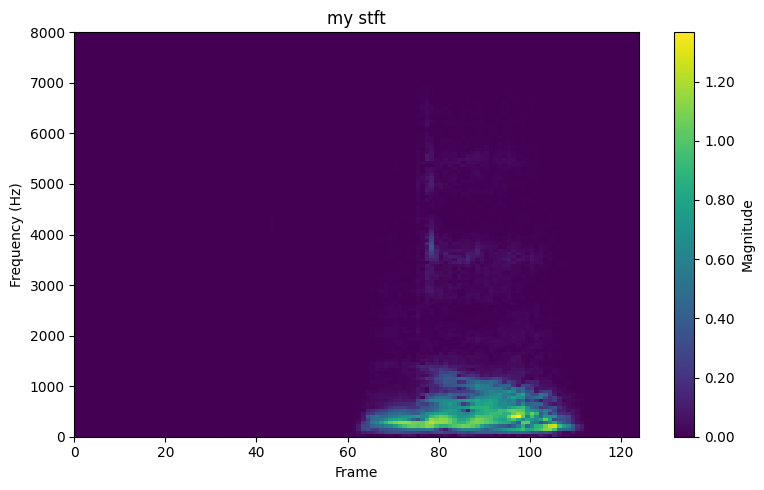

Shape after squeeze: (16000,)


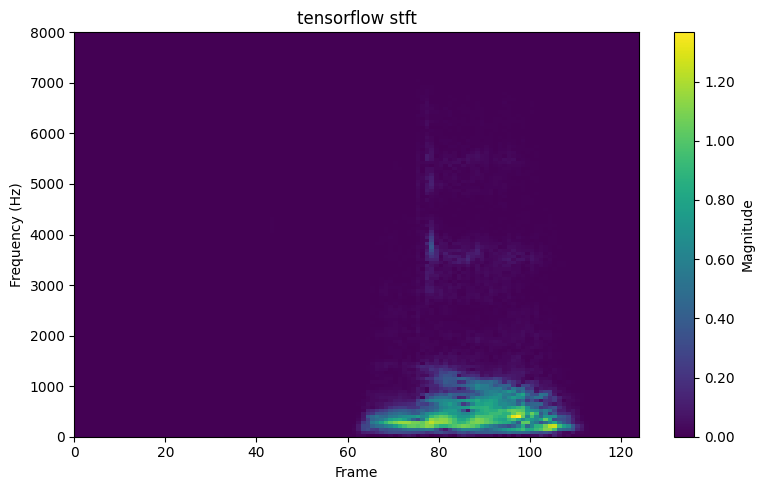

(1, 124, 129, 1)


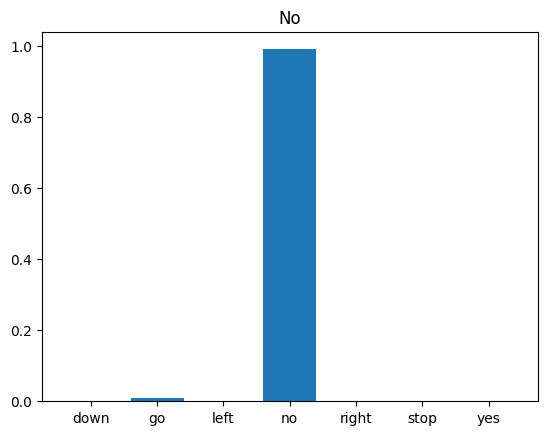

In [ ]:
x = data_dir/'no/01bb6a2a_nohash_0.wav'
x = tf.io.read_file(str(x))
x, sample_rate = tf.audio.decode_wav(x, desired_channels=1, desired_samples=16000,)
x = tf.squeeze(x, axis=-1)
audio_tensor = x
print("Shape after squeeze:", x.shape)
custom_spec = get_spectrogram_custom(audio_tensor.numpy())
tf_spec = get_spectrogram(audio_tensor)

prediction = model(tf_spec)
#x_labels = ['no', 'yes', 'down', 'go', 'left', 'up', 'right', 'stop']
x_labels = ['down', 'go', 'left', 'no', 'right', 'stop', 'right', 'yes']
plt.bar(x_labels, tf.nn.softmax(prediction[0]))
plt.title('No')
plt.show()

display.display(display.Audio(audio_tensor, rate=16000))

In [ ]:
# Tähän koodilohkoon voit sitten tehdä tarvittavat aliohjelmat
# jotta saat toteutettua konvoluutioneuroverkon kaikki osat
# steppi stepiltä

def dense2(a0,w1,b1):
  a1 = np.matmul(a0,w1) + b1
  #a1 = np.matmul(w1,a0) + b1
  return a1

#def dense1():
#def flatten():
#def maxPooling():
#def conv2():
#def conv1():
#def normalize():
#def spectrogram():



resizing_1
normalization_1
conv2d_2
conv2d_3
max_pooling2d_1
dropout_2
flatten_1
dense_2
dropout_3
dense_3
<Sequential name=sequential_6, built=True>
<Dense name=dense_3, built=True>
<Sequential name=sequential_7, built=True>
[array([0.12540947], dtype=float32), array([0.5840314], dtype=float32), np.int64(0)]
[(128, 8), (8,)]


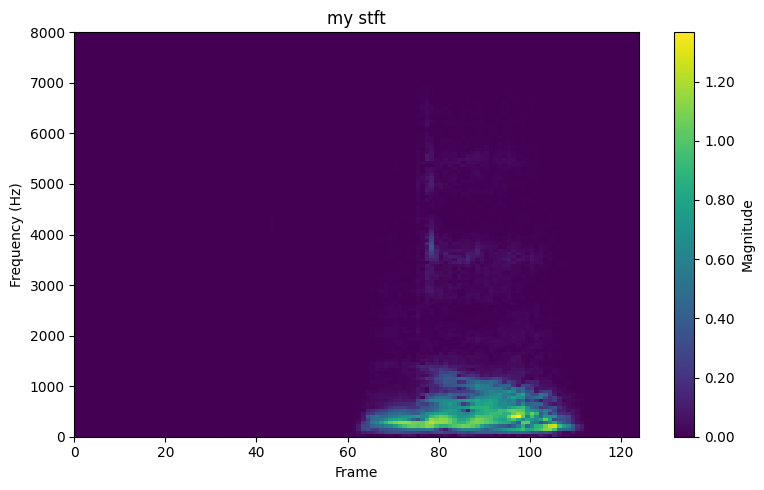

(1, 124, 129, 1)
w1 =  [[ 0.18964058  0.18747671 -0.39565954 ...  0.17516948  0.20155802
  -0.33286884]
 [-0.42294016 -0.15995124  0.01363782 ... -0.39398032  0.19158745
  -0.30429173]
 [-0.31830963  0.11008212  0.13423012 ... -0.22109348  0.00434316
   0.16232134]
 ...
 [-0.20339017  0.02441668  0.17942128 ... -0.22598107  0.15366186
   0.09909915]
 [-0.30170837 -0.08873117 -0.14328727 ...  0.24282211  0.23459415
  -0.04710241]
 [-0.09988049  0.14956795 -0.03263114 ...  0.15984876 -0.14929341
  -0.13211238]]
w1 shape =  (128, 8)
b1 =  [ 0.20322895 -0.00625458 -0.12167758  0.05570949 -0.10731463 -0.13689403
  0.04408068  0.01220485]
b1 shape =  (8,)
oma tulos =  [[-2.362219   3.70149   -4.376376   8.403941  -9.531817  -7.497174
  -7.5124946 -2.0341299]]


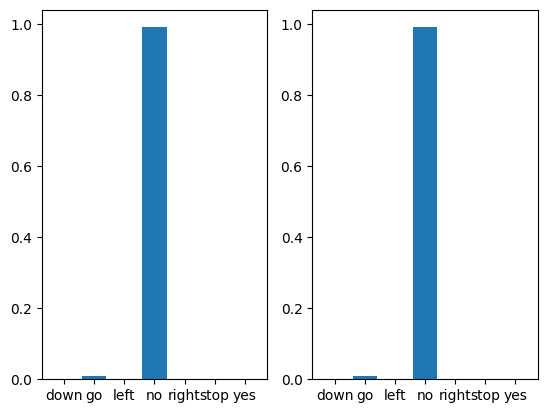

In [ ]:
'''
Projekti aloitetaan konvoluutioneuroverkon loppupäästä
alla olevan esimerkin mukaisesti. Yritän selittää tässä tuon esimerkin.

get_reference_layer() funktio palauttaa kolme mallia seuraavasti:
-start = malli alkuperäisen mallin alusta siihen layeriin asti, jonka annat
         parametrina. Tässä esimerkissä dense_1 layeriin asti. Jos siis
         sinulla on muuttujassa x spektrogrammi "kuva" ja suoritat komennon
         result = start(x), niin resultissa on dense_1 layeriin menevä tulos.

-layer = Tässä esimerkissä tuo dense_1. Jos suoritat komennon
         layer_result = layer(result), niin syötät dense_1 layerin inputin
         syötteen dense_1 layeriin ja saat tuloksena signaalin dense_1 layerin
         jälkeen.

-end mallia ei tarvita tässä harjoituksessa mihinkään.

Saat siis get_reference_layer() funktiolla mistä tahansa mallin kohdasta start
ja layer mallit joiden avulla sinun on helppo testata yksi layer kerrallaan
osaatko kirjoittaa Python koodin, joka toteuttaa layerin tehtävät. Et saa
käyttää koodissasi tensorflown kirjastokomponentteja, vaan sinun tulisi pärjätä
Pythonilla ja NumPyllä. Tavoitehan on ymmärtää millaista laskentaa YKSINKERTAINEN
konvoluutioneuroverkko sisältää. Tämä auttaa todennäköisesti ymmärtämään ja
ehkä arvostamaankin sitä laskentamäärää, joka oikeita ongelmia ratkovissa
verkoissa suoritetaan.

Eli yhden layerin testaus menee jotenkin seuraavasti:

(start, layer, end) = get_reference_layer("TestattavanLayerinNimi", model)
signaaliLayerinInputissa = start(x)  # jos oletetaan että x = spektrogrammi "kuva"
OikeaVastausLayerinOutputissa = layer(signaaliLayerinInputissa)
SinunLayerFunktiollaSaatuVastaus = SinunFunktio(signaaliLayerinInputissa)

Jos OikeaVastausLayerinOutputissa = SinunLayerFunktiollaSaatuVastaus,
niin sait kyseisen layerin toteutettua oikein.

Edellinen vertailu on ehkä helpointa tehdä siten, että verrataan kahden mallin
antamaa tulosta model-mallin = alkuperäinen Tensorflow-malli ja mallin, jossa osa
layereistä on korvattu sinun tekemillä funktiolla. Jos kummankin mallin antama
tulos printattuna on samanlainen, niin sinun funktiot toimivat samalla tavalla
kuin alkuperäisessä mallissa. TÄMÄN takia kannustan siihen, että projekti
aloitetaan mallin loppupäästä eli dense2 layeristä. Kun saat tuon tomimaan, niin
toteutat dense1:n jne.

'''

for l in model.layers:
    print(l.name)

(start, layer, end) = get_reference_layer("dense_3", model)
print(start)
print(layer)
print(end)
print(get_layer_weights("normalization_1",model))
print(get_weights_shape(get_layer_weights("dense_3",model)))
weights = get_layer_weights("dense_3",model)

#print("Original input", model.input_shape)
#print("Start input", start.input_shape)
#print("Layer input", layer.input.shape)
#print("End input", end.input_shape)

# To use the model parts, call the part with the input data
x = get_spectrogram_custom(audio_tensor)
print(x.shape)
result = start(x)             # tämä antaa siis verkon oikean tuloksen ennen viimeistä dense_1
                              # layeriä
layer_result = layer(result)  # Ja tämä tuloksen dense_1:n jälkeen
a0 = result                   # viimeiseen neuroverkon kerrokseen menevät 128 neuronia inputtina
w1 = weights[0]
print("w1 = ", w1)
print("w1 shape = ", w1.shape)
b1 = weights[1]
print("b1 = ", b1)
print("b1 shape = ", b1.shape)
layer_oma_result = dense2(a0,w1,b1)
print("oma tulos = ",layer_oma_result)

#print(layer_result)
#print(layer_result.shape)
#print(layer_result[0,:])
#x_labels = ['no', 'yes', 'down', 'go', 'left', 'up', 'right', 'stop']
x_labels = ['down', 'go', 'left', 'no', 'right', 'stop', 'right', 'yes']
plt.figure(1)
plt.subplot(1,2,1)
plt.bar(x_labels, tf.nn.softmax(layer_result[0,:]))
plt.subplot(1,2,2)
plt.bar(x_labels, tf.nn.softmax(layer_oma_result[0,:]))
#plt.title('No')
plt.show()


In [ ]:
model.save_weights("my_model_weights.weights.h5")


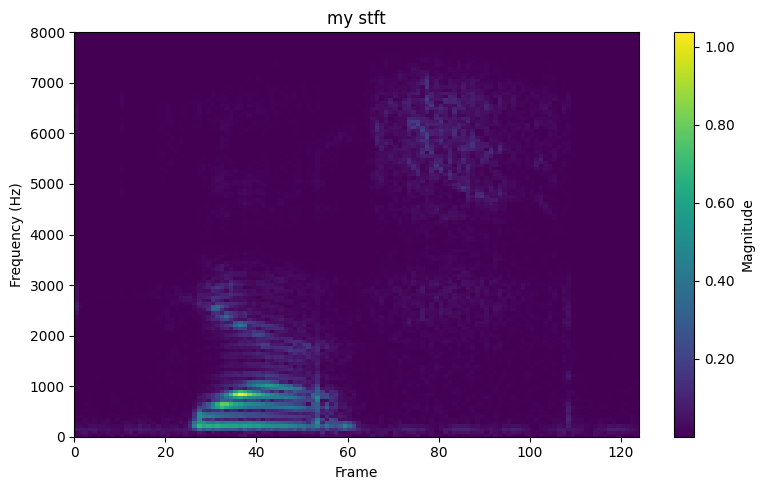

(1, 124, 129, 1)
_______________________________________
predicted yes
***************************************


<BarContainer object of 8 artists>

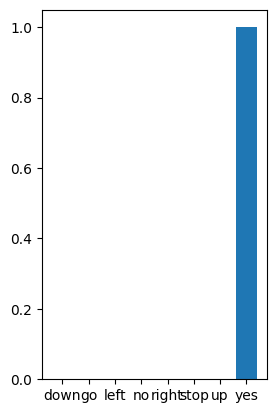

In [ ]:
def normalize(inputs):
    """Normalization-kerroksen toteutus. Laskee keskiarvon ja varianssin itse."""
    numpy_mean = inputs.mean(axis=(0,1,2))
    numpy_variance = inputs.var()
    normalized_numpy = (inputs - numpy_mean) / np.sqrt(numpy_variance + 1e-7)
    return normalized_numpy
def resize(inputs, new_height, new_width):
    """Resizing-kerroksen toteutus."""
    #bilineaarinen inerpolaatio juttu
    _, H, W, _ = inputs.shape
    row_ratio = (H - 1) / (new_height - 1) if new_height > 1 else 0
    col_ratio = (W - 1) / (new_width - 1) if new_width > 1 else 0

    resized = np.zeros((1, new_height, new_width, 1), dtype=inputs.dtype)

    for i in range(new_height):
        for j in range(new_width):
            r = i * row_ratio
            c = j * col_ratio
            r0, c0 = int(np.floor(r)), int(np.floor(c))
            r1, c1 = min(r0 + 1, H - 1), min(c0 + 1, W - 1)
            dr, dc = r - r0, c - c0

            top_left = inputs[0, r0, c0, 0]
            top_right = inputs[0, r0, c1, 0]
            bottom_left = inputs[0, r1, c0, 0]
            bottom_right = inputs[0, r1, c1, 0]

            top = top_left * (1 - dc) + top_right * dc
            bottom = bottom_left * (1 - dc) + bottom_right * dc
            value = top * (1 - dr) + bottom * dr

            resized[0, i, j, 0] = value

    return resized

def convolution1(inputs_numpy, filters, biases, strides=(1, 1), activation='relu'):
    """Toteuttaa konvoluutiolaskennan."""

    input_padded= inputs_numpy
    batch_size, Height, Width, channels = input_padded.shape
    kernelH, kernelW, in_channels, out_channels = filters.shape
    out_H = (Height -kernelH) // strides[0] + 1
    out_W = (Width -kernelW) // strides[1] + 1

    output = np.zeros((out_channels,out_H,out_W))

    for f in range(out_channels):
        kernel = filters[:, :, :, f]
        for i in range(out_H):
            for j in range(out_W):
                region = input_padded[0,
                                  i*strides[0]:i*strides[0]+kernelH,
                                  j*strides[1]:j*strides[1]+kernelW,
                                  :]
                value = np.sum(region * kernel)
                if biases is not None:
                    value +=biases[f]
                output[f,i,j] = value


    manual_output = output.transpose(1, 2, 0)
    manual_output = np.expand_dims(manual_output, axis=0)



    if activation == 'relu':
        manual_output = np.maximum(manual_output, 0)
    return manual_output
def maxPooling(inputs, pool_size=(2,2), strides=(2,2)):

    N, H, W, C = inputs.shape
    pool_H, pool_W = pool_size
    stride_H, stride_W = strides

    out_H = (H - pool_H) // stride_H + 1
    out_W = (W - pool_W) // stride_W + 1

    output = np.zeros((N, out_H, out_W, C))

    for n in range(N):
        for i in range(out_H):
            for j in range(out_W):
                h_start = i * stride_H
                w_start = j * stride_W
                region = inputs[n, h_start:h_start+pool_H, w_start:w_start+pool_W, :]
                output[n, i, j, :] = np.max(region, axis=(0, 1))
    return output
def flatten(inputs_numpy):
    output = inputs_numpy.reshape(inputs_numpy.shape[0], -1)
    return output

def dense1(inputs_numpy, weights, biases, activation='relu'):

    manual_output = np.matmul(inputs_numpy, weights) + biases
    if activation == 'relu':
        manual_output = np.maximum(manual_output, 0)
    return manual_output

def run_custom_model_with_learned_weights(waveform):

    conv2d_2_weights = get_layer_weights("conv2d_2",model)
    conv2d_3_weights = get_layer_weights("conv2d_3",model)
    dense_2_weights = get_layer_weights("dense_2",model)
    dense_3_weights = get_layer_weights("dense_3",model)
    x = get_spectrogram_custom(waveform)
    print(x.shape)
    x = resize(x, 32, 32)
    x = normalize(x)
    x = convolution1(x, conv2d_2_weights[0], conv2d_2_weights[1])
    x = convolution1(x, conv2d_3_weights[0], conv2d_3_weights[1])
    x = maxPooling(x)
    x = flatten(x)
    x = dense1(x, dense_2_weights[0], dense_2_weights[1])

    predictions = dense1(x, dense_3_weights[0], dense_3_weights[1])

    return predictions
x = data_dir/'yes/00f0204f_nohash_0.wav'
x = tf.io.read_file(str(x))
x, sample_rate = tf.audio.decode_wav(x, desired_channels=1, desired_samples=16000,)
x = tf.squeeze(x, axis=-1)
waveform = x
label_names = ['down', 'go', 'left', 'no', 'right', 'stop', 'up', 'yes']
output = run_custom_model_with_learned_weights(waveform)

predicted_index = np.argmax(output, axis=1)[0]
print(f"_______________________________________")

print(f"predicted {label_names[predicted_index]}")
print(f"***************************************")

plt.figure(1)
plt.subplot(1,2,1)
plt.bar(label_names, tf.nn.softmax(output[0,:]))

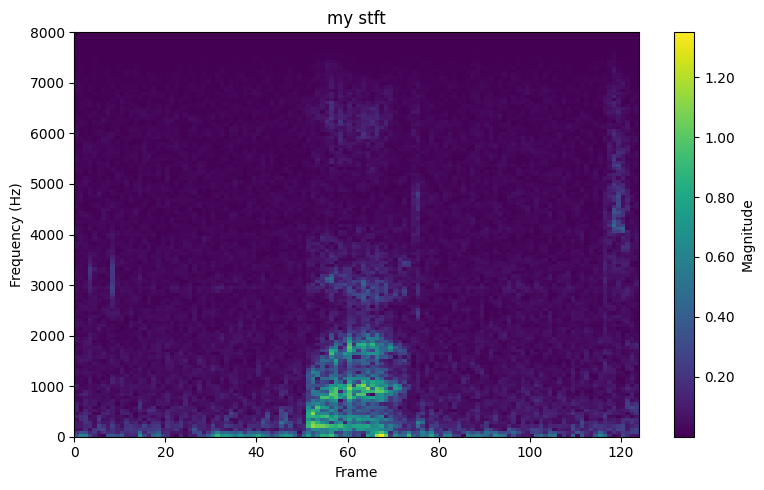

(1, 124, 129, 1)
File: f550b7dc_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


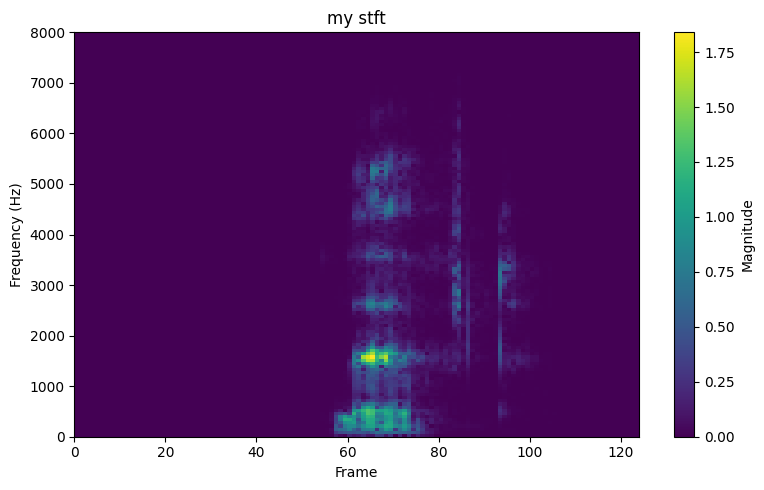

(1, 124, 129, 1)
File: d90b4138_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 1.0


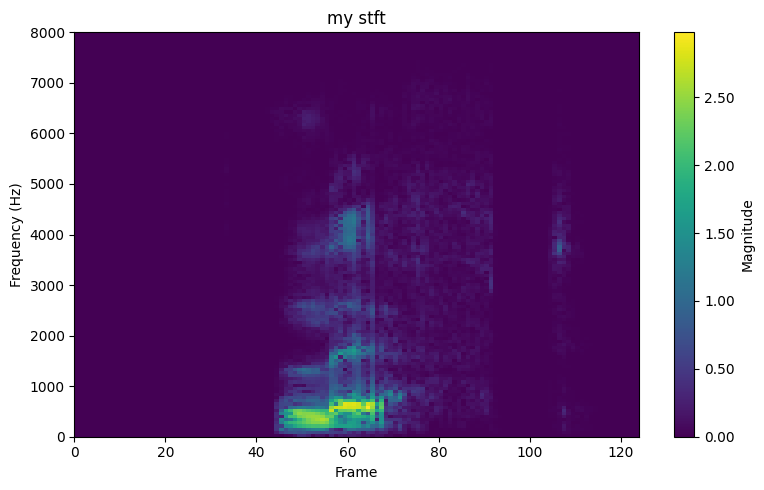

(1, 124, 129, 1)
File: 9db2bfe9_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 1.0


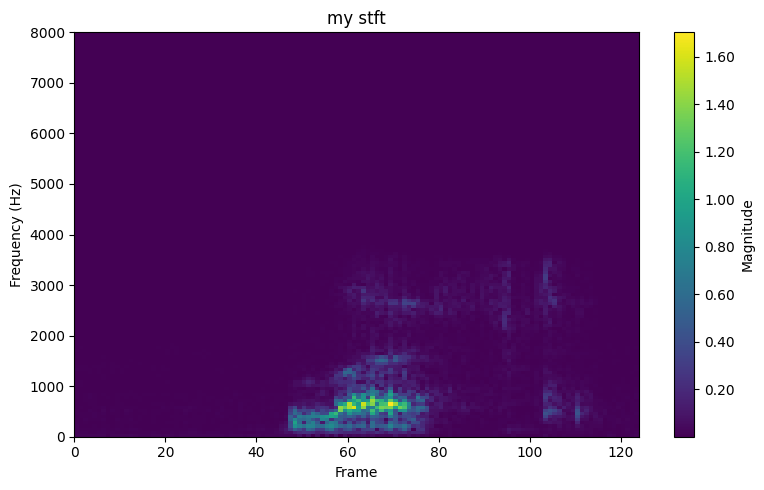

(1, 124, 129, 1)
File: 27c30960_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 1.0


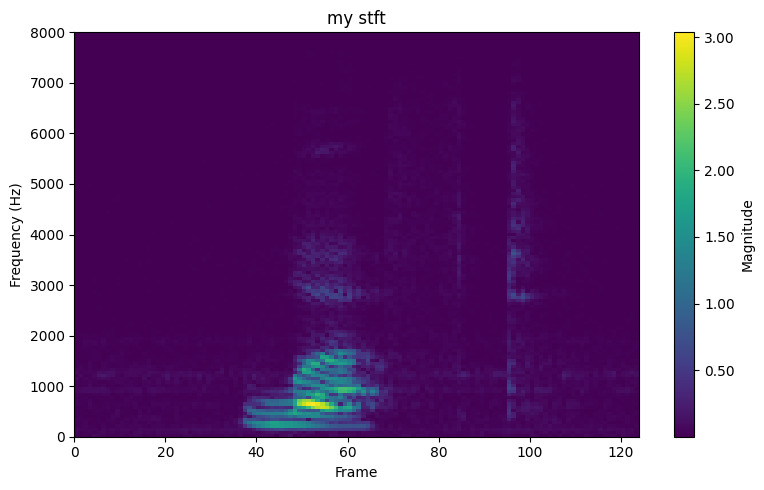

(1, 124, 129, 1)
File: a2b16113_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


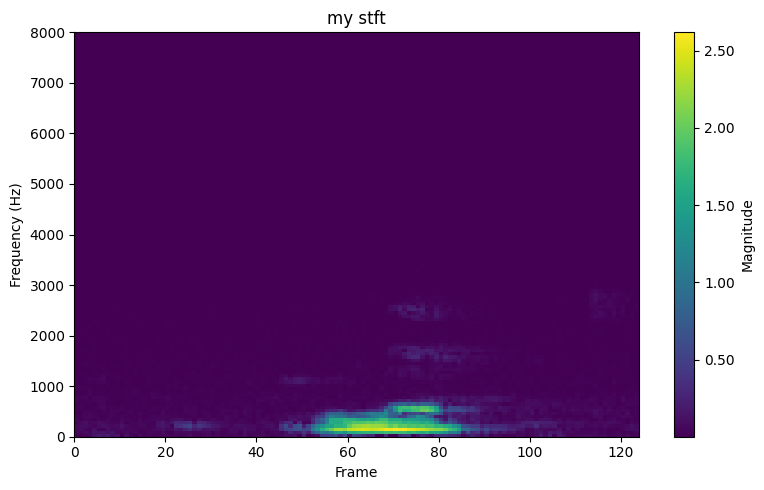

(1, 124, 129, 1)
File: e9901cf0_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


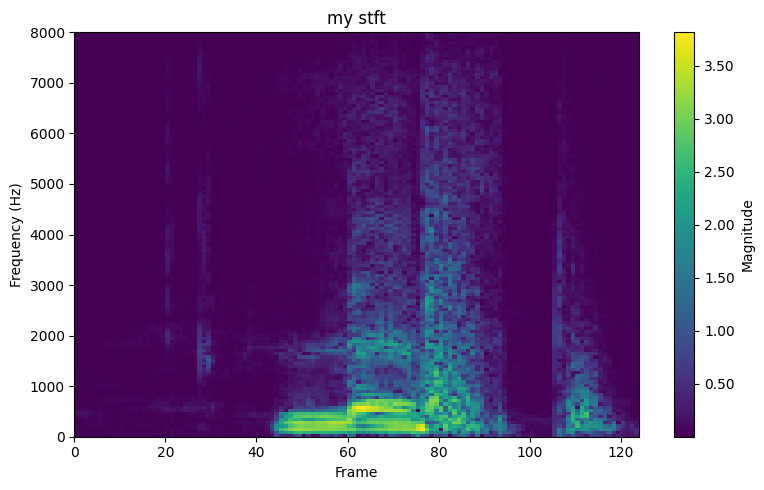

(1, 124, 129, 1)
File: 964e8cfd_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


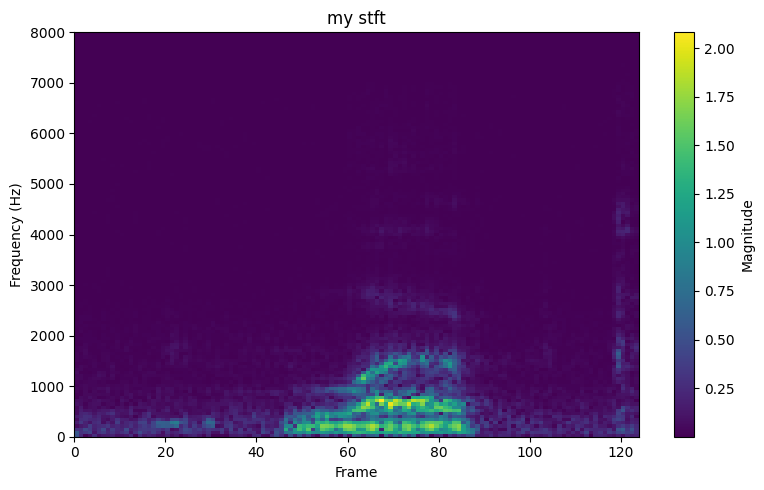

(1, 124, 129, 1)
File: 11b1df78_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 1.0


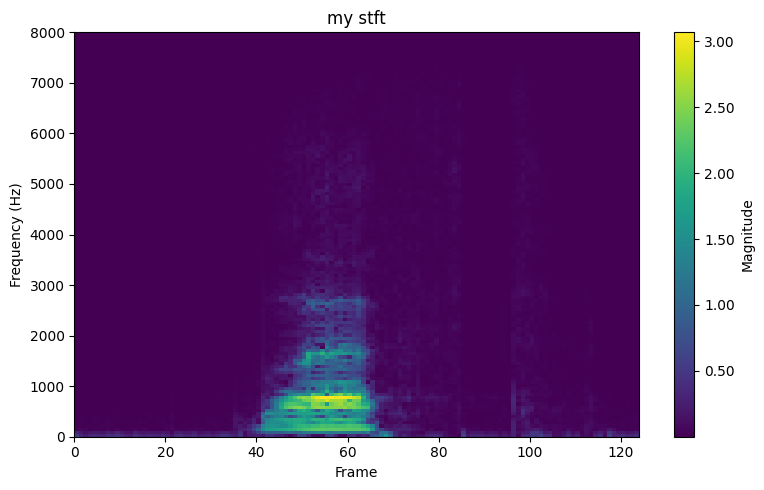

(1, 124, 129, 1)
File: aef8dcf5_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


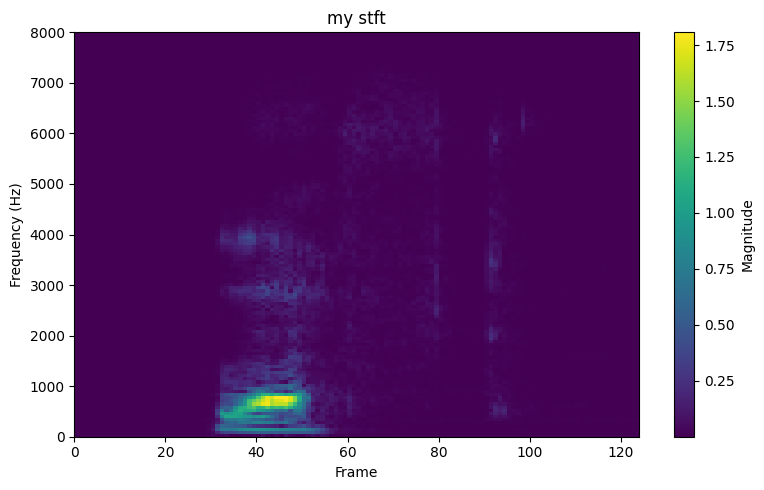

(1, 124, 129, 1)
File: e7ea8b76_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 1.0


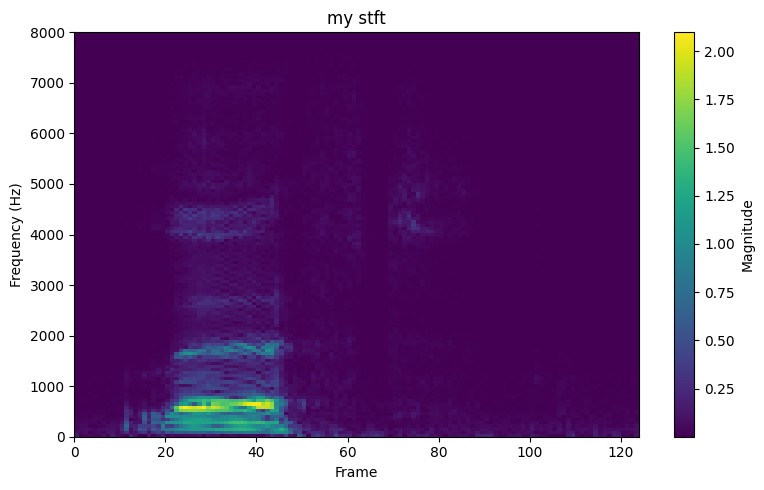

(1, 124, 129, 1)
File: 7eee5973_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


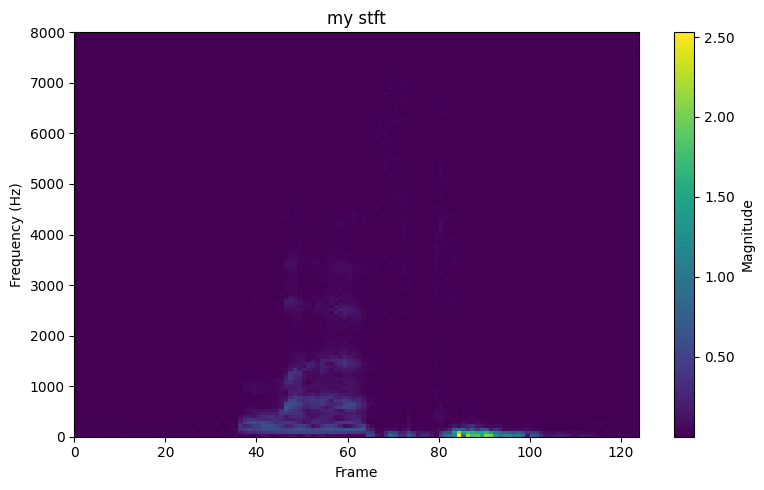

(1, 124, 129, 1)
File: d91a159e_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


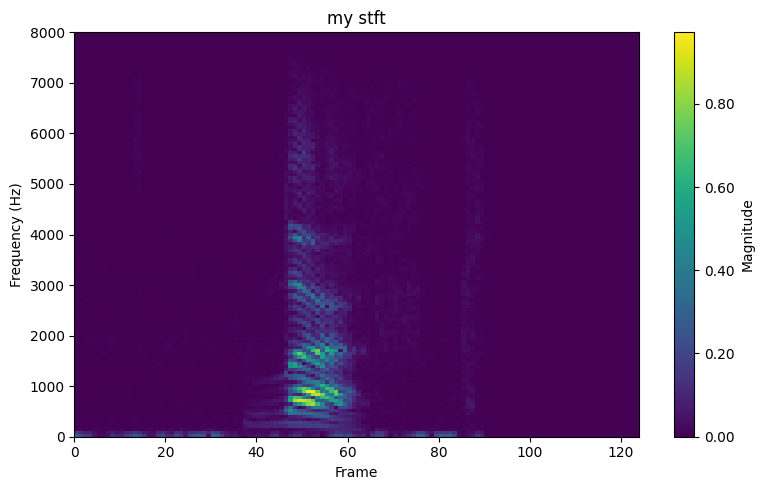

(1, 124, 129, 1)
File: 962f27eb_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


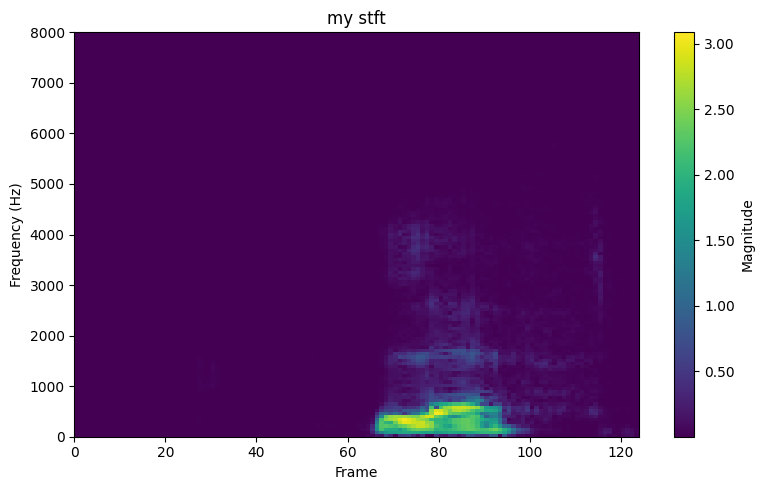

(1, 124, 129, 1)
File: 7cf14c54_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 1.0


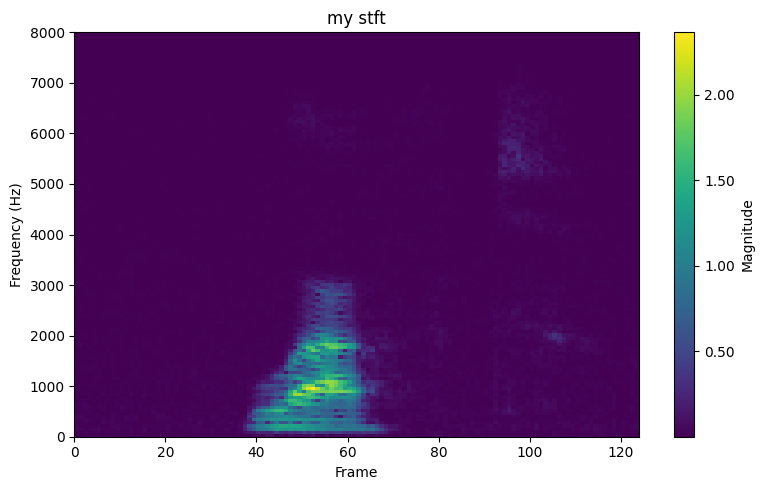

(1, 124, 129, 1)
File: 1f3bece8_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 1.0


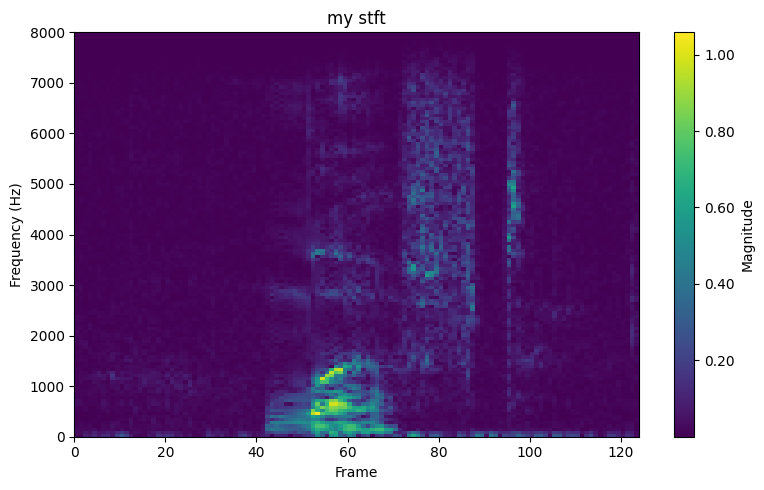

(1, 124, 129, 1)
File: f8ad3941_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


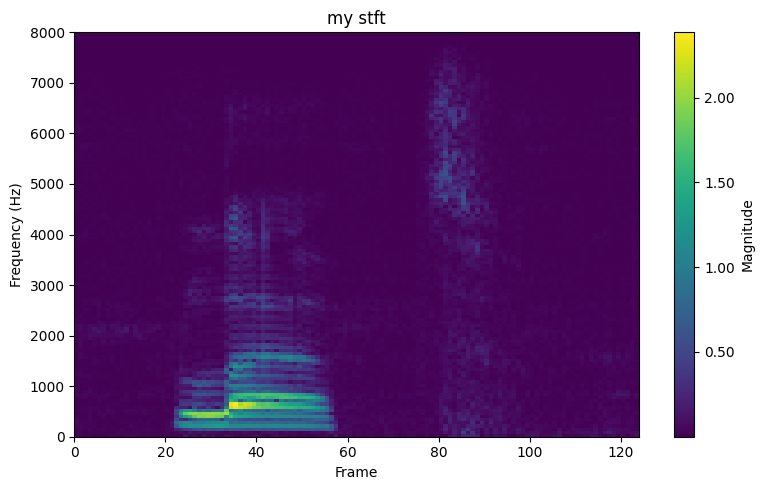

(1, 124, 129, 1)
File: 7a5530c9_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 1.0


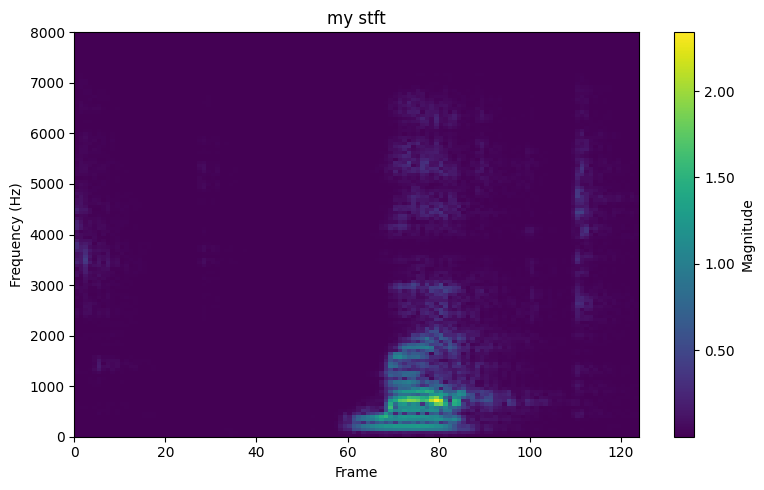

(1, 124, 129, 1)
File: 1a892463_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


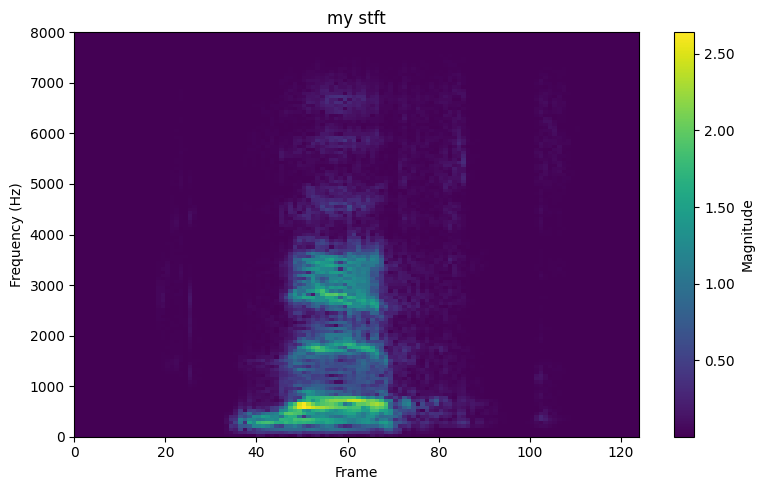

(1, 124, 129, 1)
File: 8eb4a1bf_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


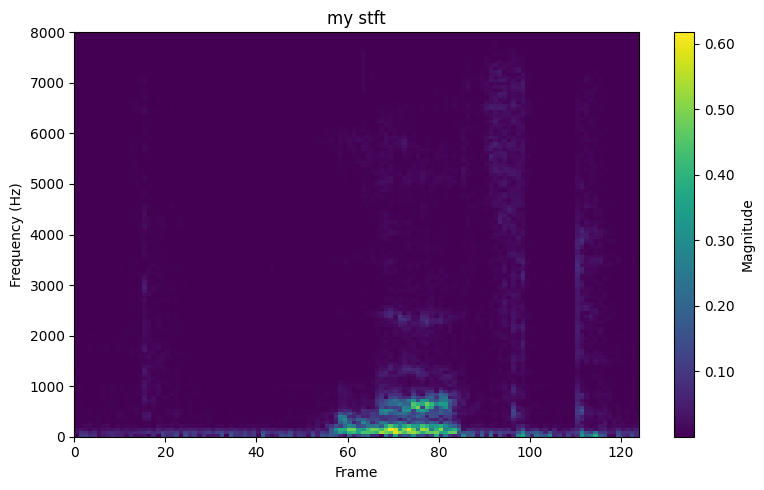

(1, 124, 129, 1)
File: 748cb308_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 1.0


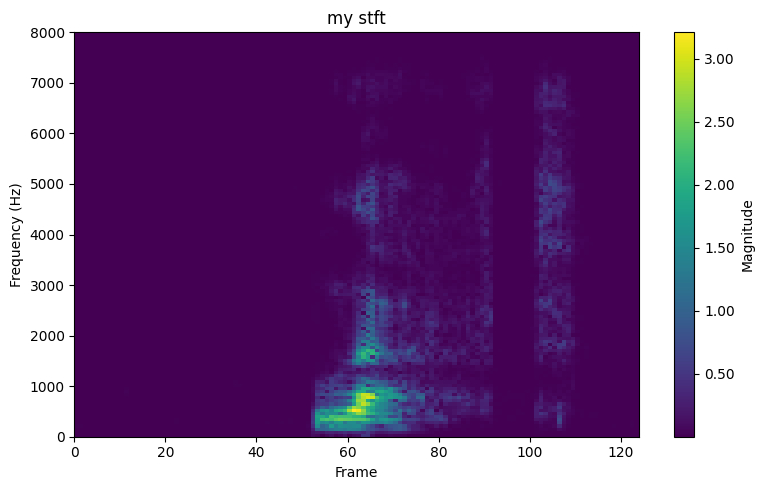

(1, 124, 129, 1)
File: 1890e5c3_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 1.0


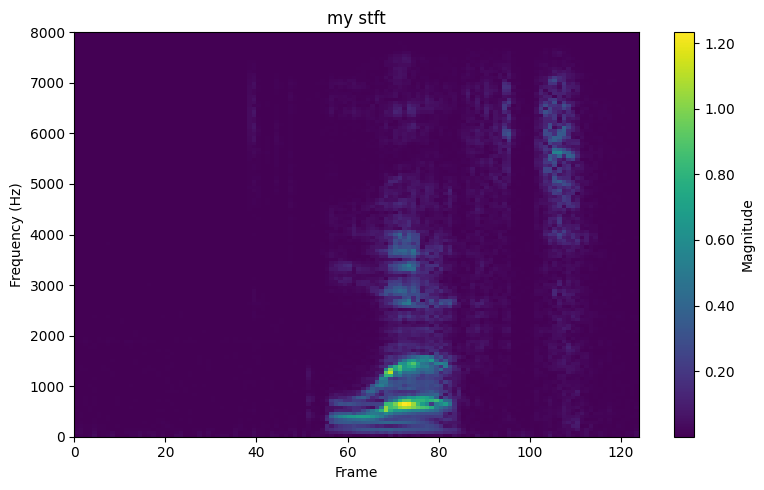

(1, 124, 129, 1)
File: 3824c00e_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


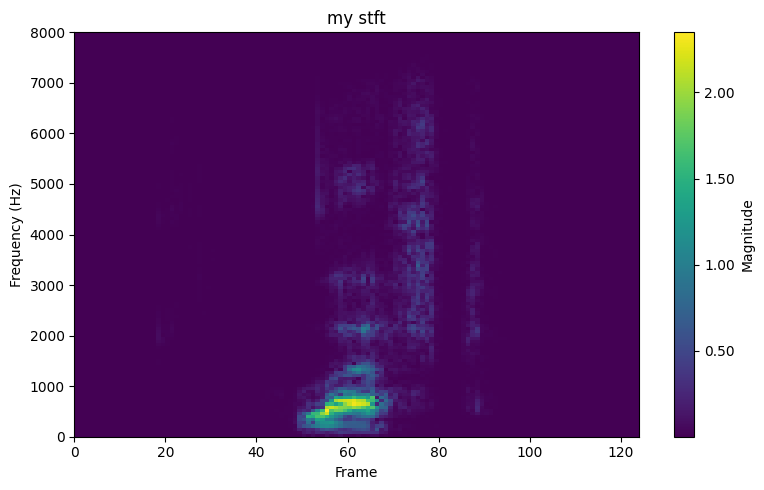

(1, 124, 129, 1)
File: 1ecfb537_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 1.0


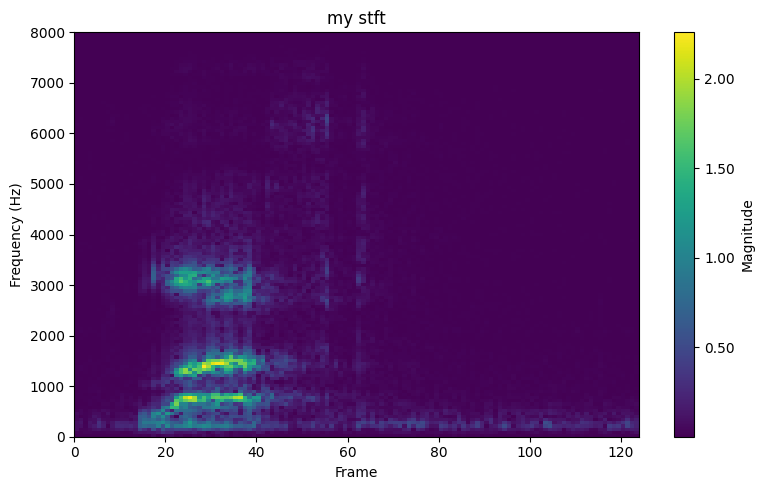

(1, 124, 129, 1)
File: 8a194ee6_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


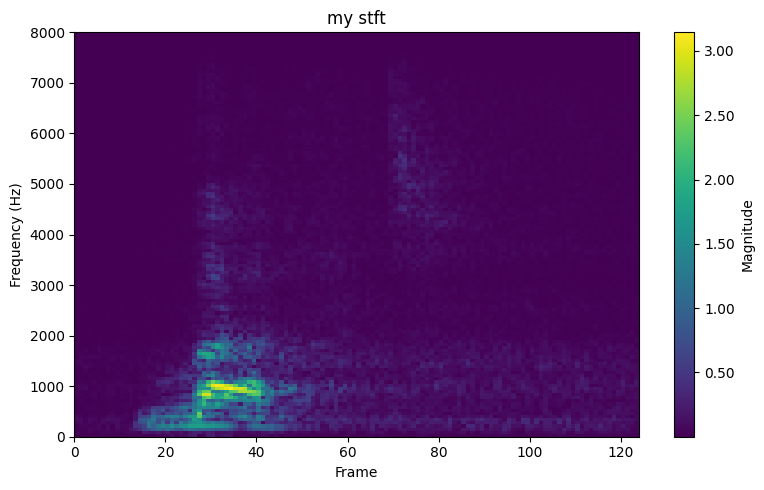

(1, 124, 129, 1)
File: 462e1919_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 1.0


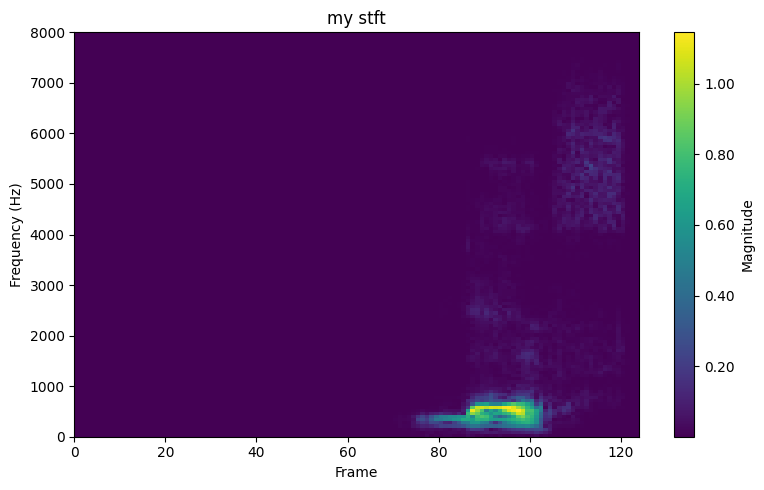

(1, 124, 129, 1)
File: 712e4d58_nohash_3.wav, True label: left, Predicted label: yes

Accuracy: 0.9615384615384616


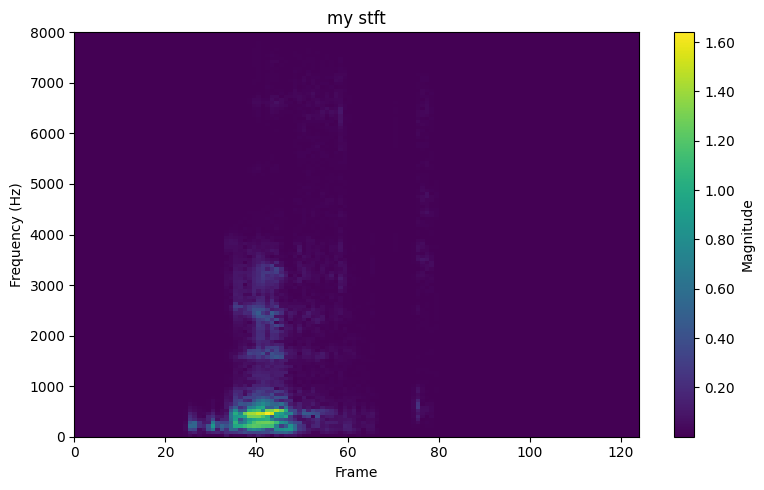

(1, 124, 129, 1)
File: 735845ab_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9629629629629629


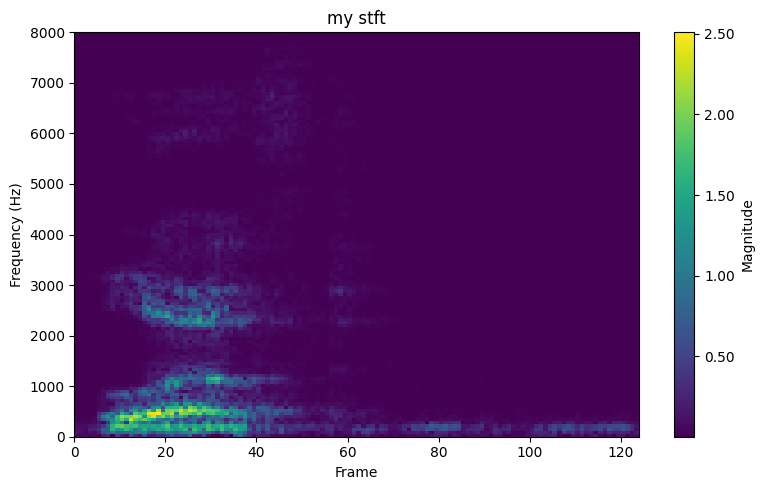

(1, 124, 129, 1)
File: f17be97f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9642857142857143


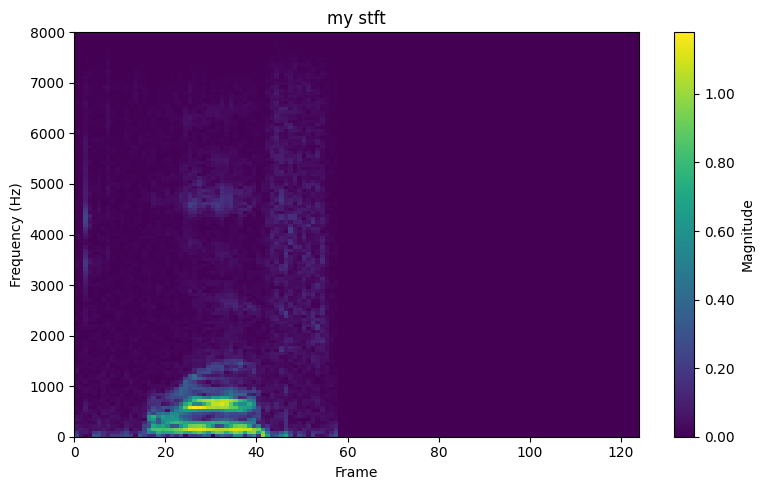

(1, 124, 129, 1)
File: a40c62f1_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9655172413793104


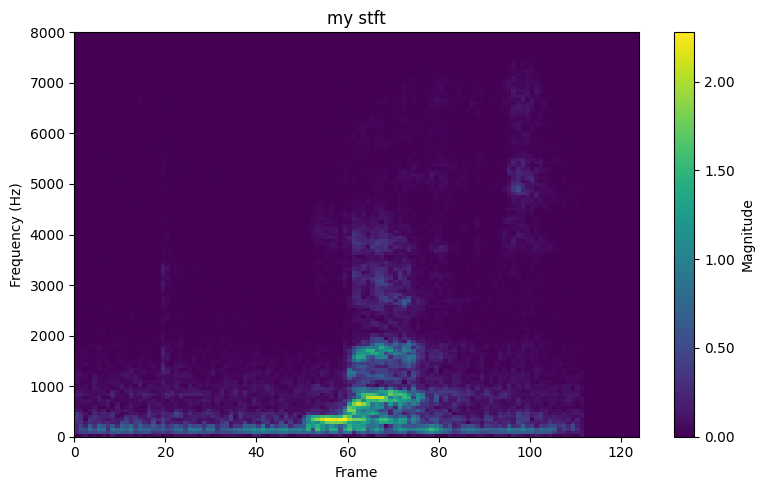

(1, 124, 129, 1)
File: e4a2cf79_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9666666666666667


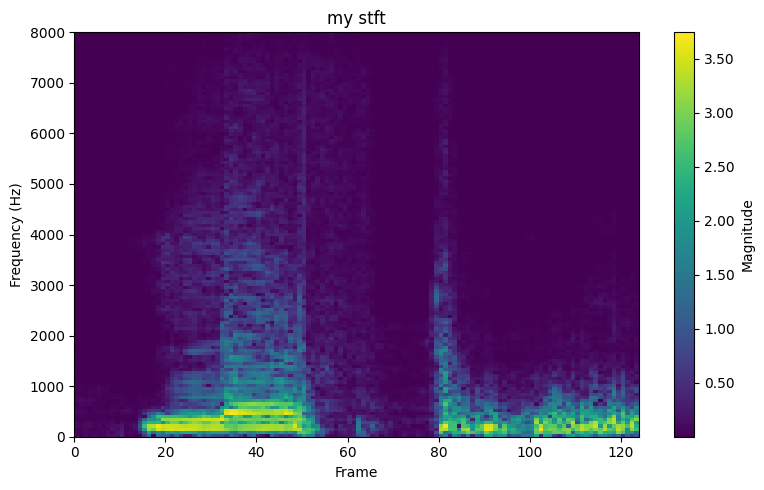

(1, 124, 129, 1)
File: 229978fd_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.967741935483871


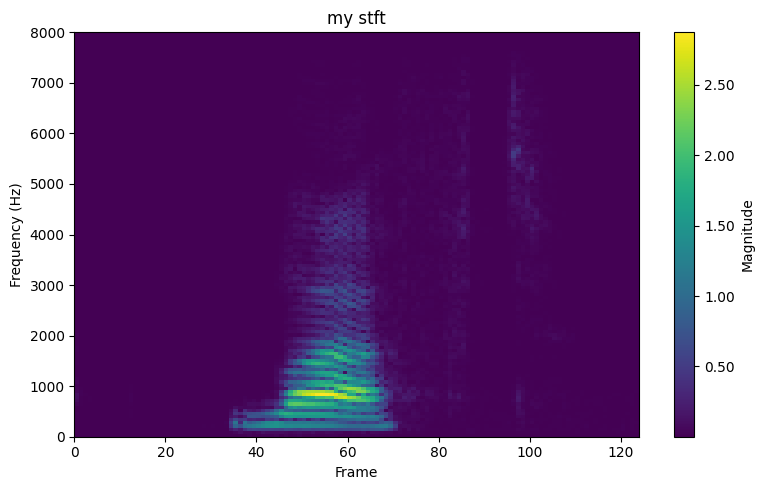

(1, 124, 129, 1)
File: e63b69c5_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.96875


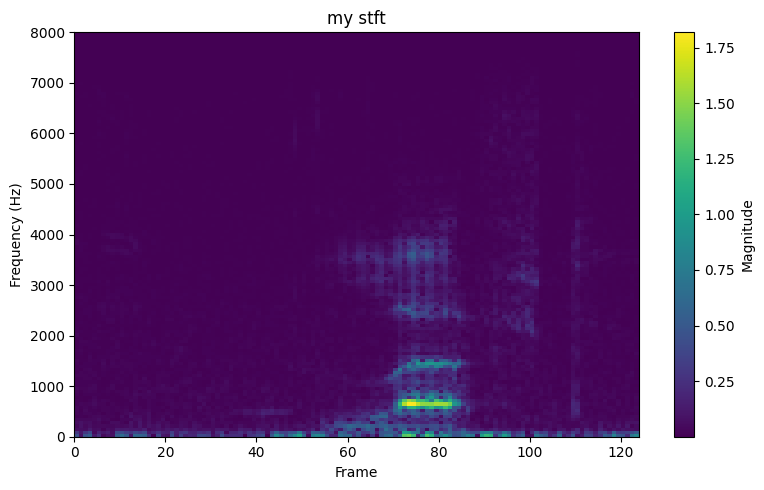

(1, 124, 129, 1)
File: 2d82a556_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9696969696969697


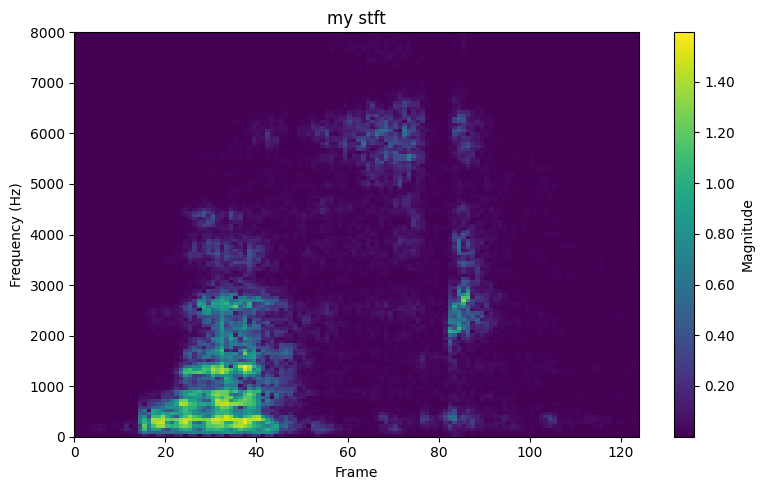

(1, 124, 129, 1)
File: aff582a1_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9705882352941176


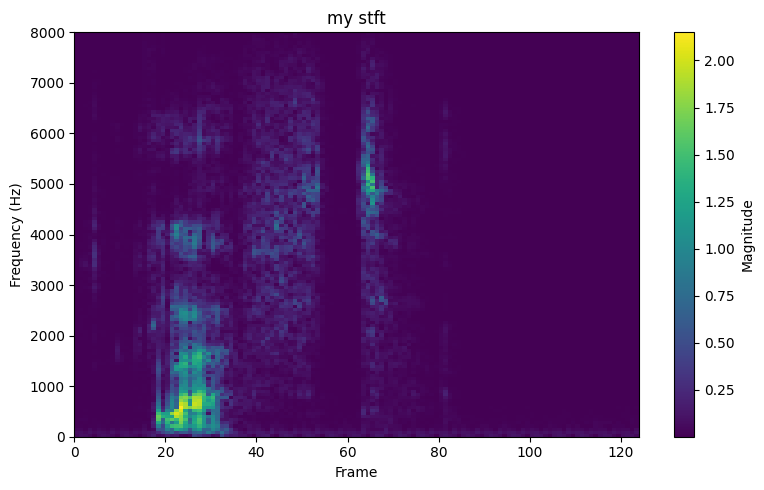

(1, 124, 129, 1)
File: 834f03fe_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 0.9714285714285714


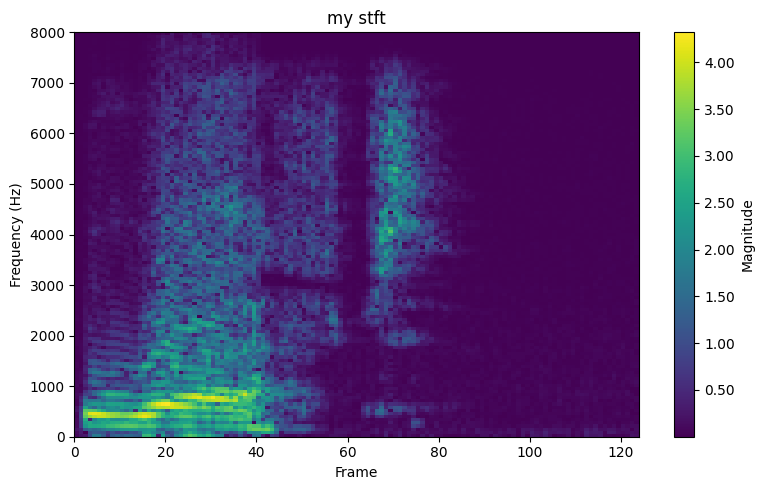

(1, 124, 129, 1)
File: f638a812_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9722222222222222


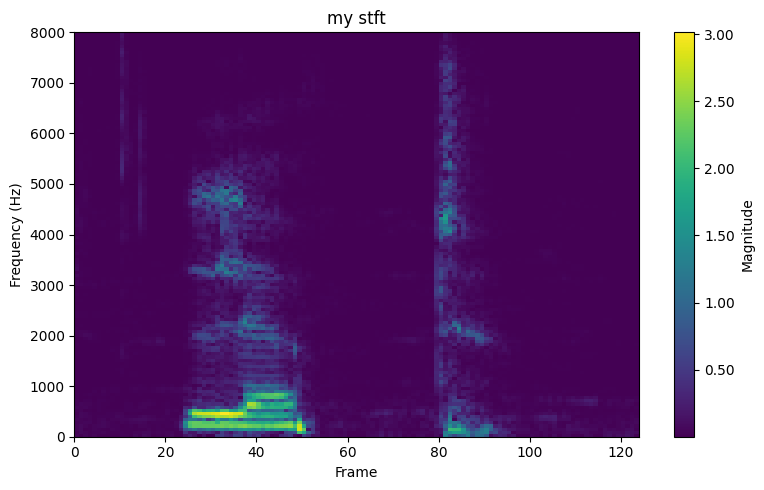

(1, 124, 129, 1)
File: 56eb74ae_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 0.972972972972973


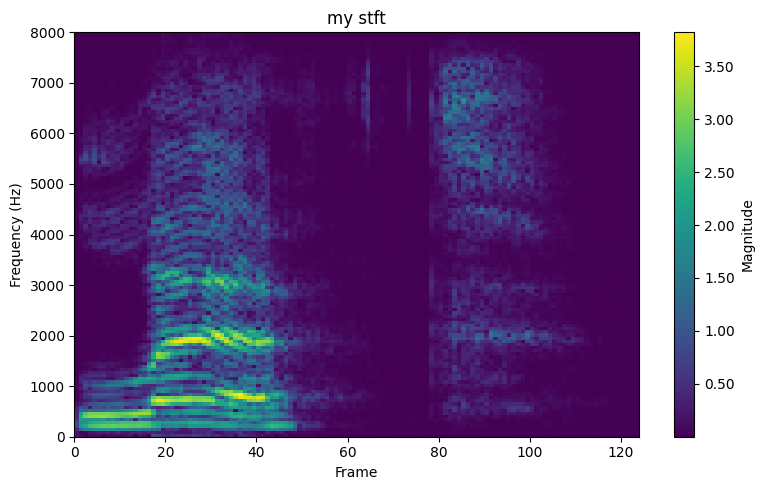

(1, 124, 129, 1)
File: 5aac2efa_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9736842105263158


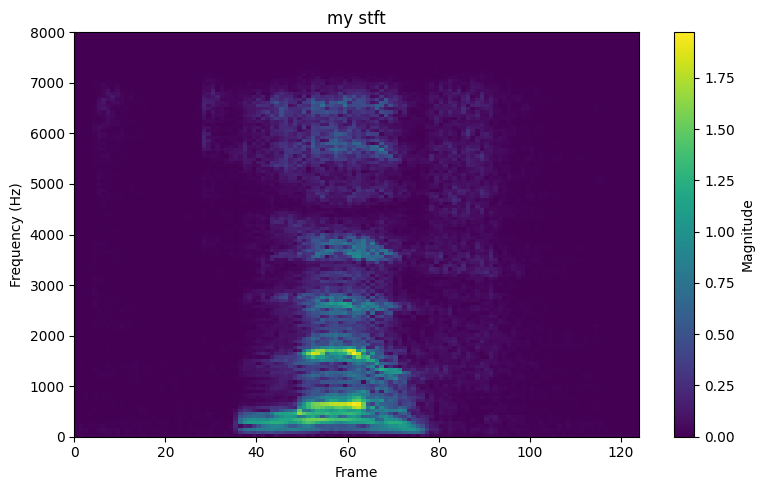

(1, 124, 129, 1)
File: ff63ab0b_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9743589743589743


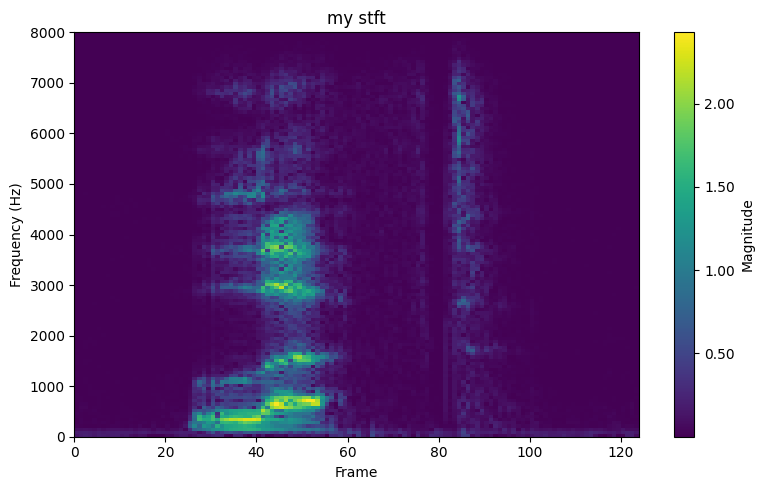

(1, 124, 129, 1)
File: e7d0eb3f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.975


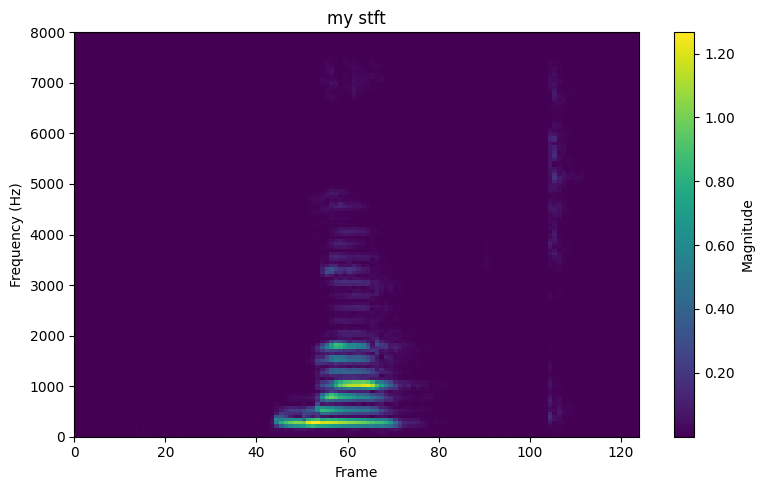

(1, 124, 129, 1)
File: 3143fdff_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.975609756097561


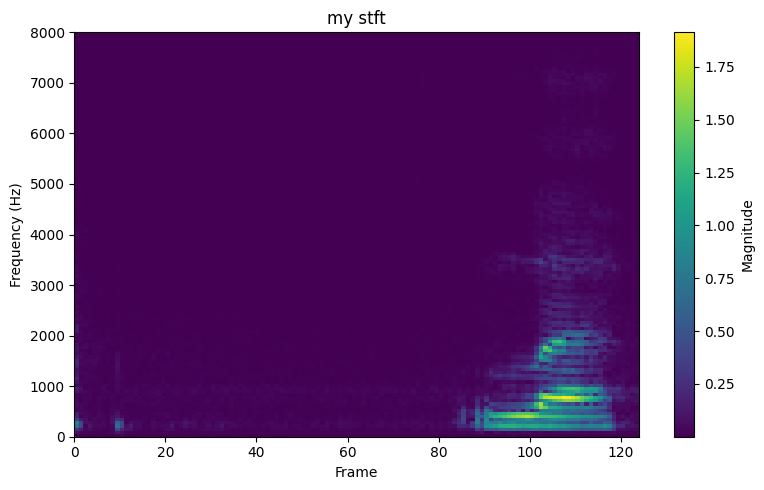

(1, 124, 129, 1)
File: 659b7fae_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9761904761904762


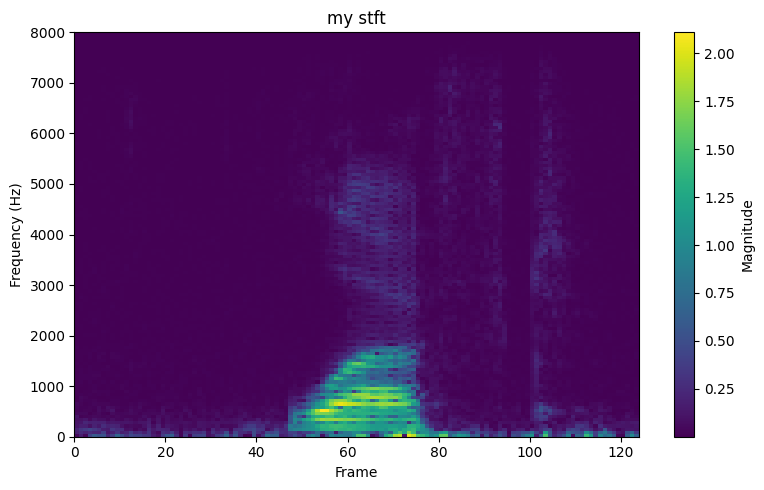

(1, 124, 129, 1)
File: 01648c51_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9767441860465116


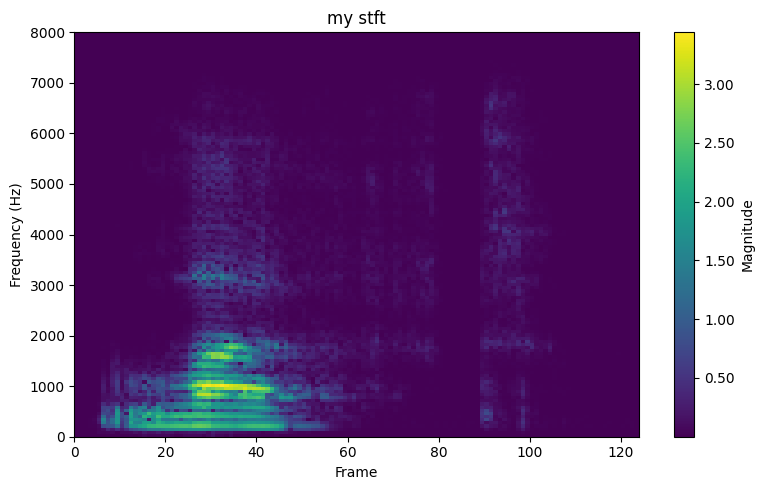

(1, 124, 129, 1)
File: 13d7b8c9_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9772727272727273


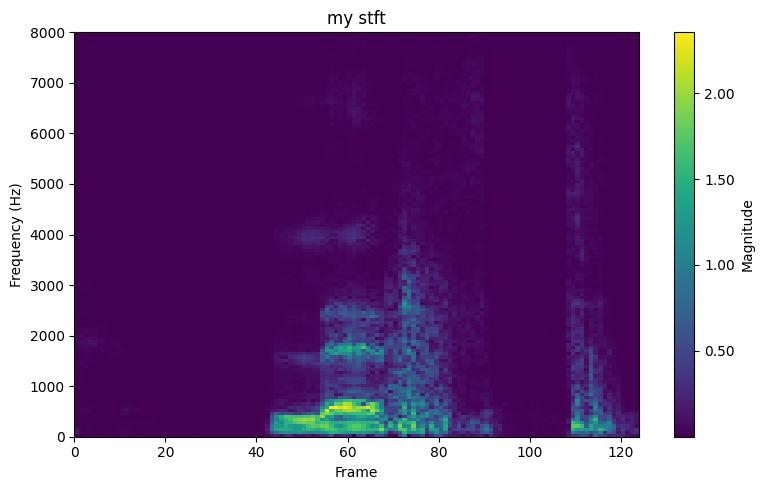

(1, 124, 129, 1)
File: 9aa21fa9_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9777777777777777


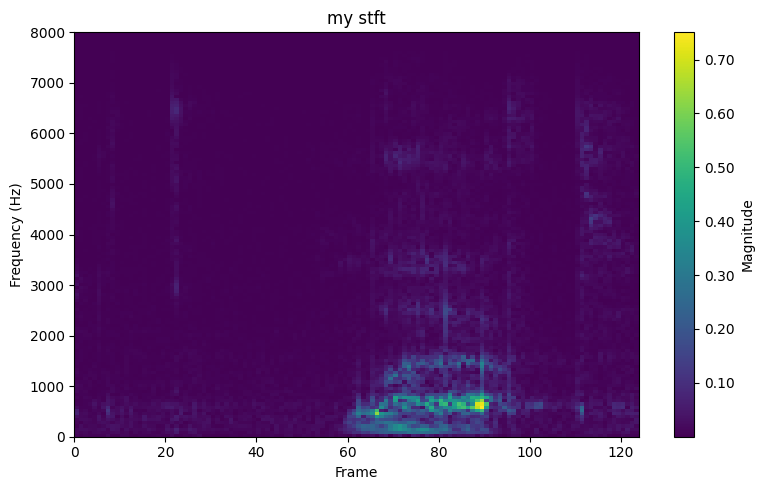

(1, 124, 129, 1)
File: fd32732a_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9782608695652174


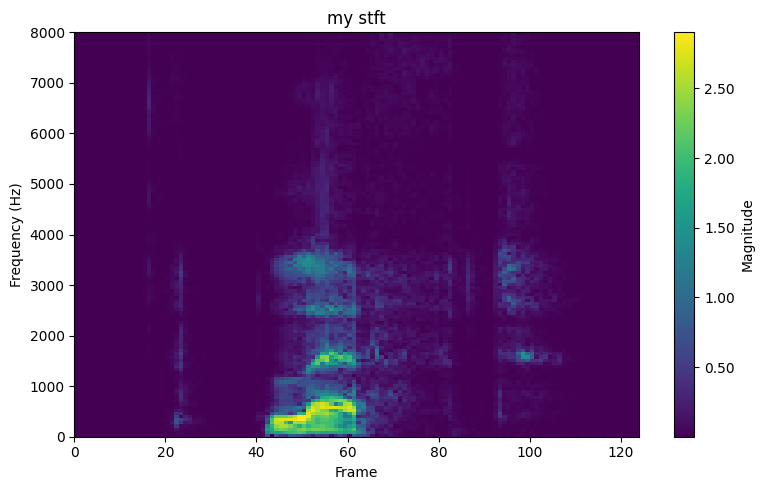

(1, 124, 129, 1)
File: 7211390b_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9787234042553191


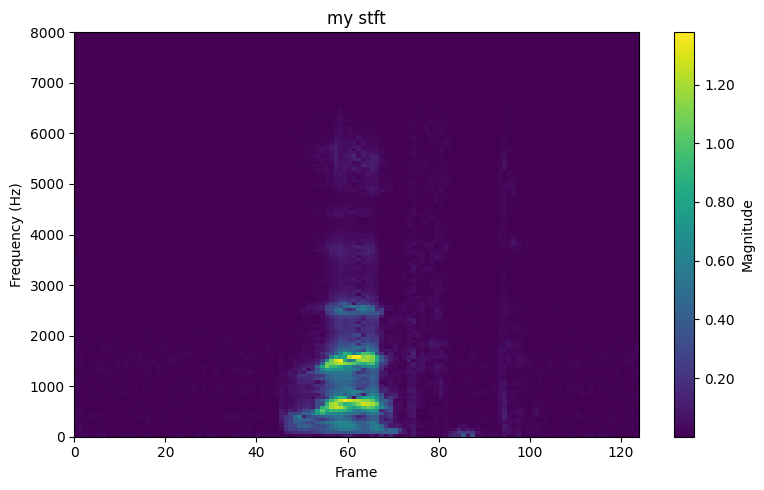

(1, 124, 129, 1)
File: f4c77b26_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9791666666666666


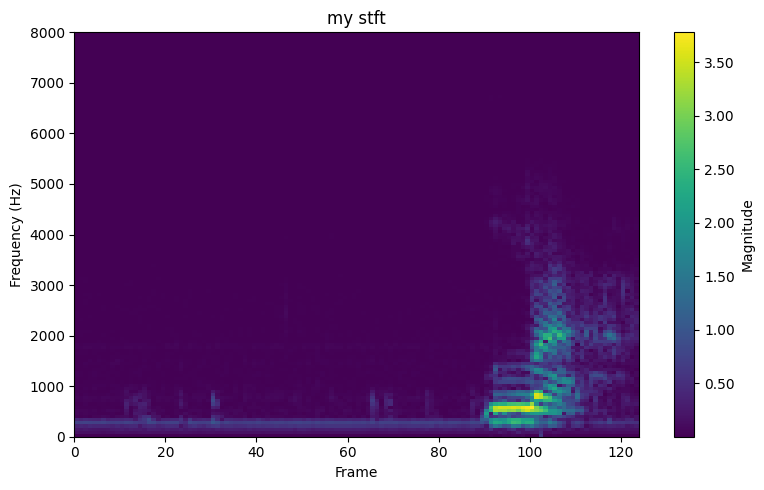

(1, 124, 129, 1)
File: 3df9a3d4_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9795918367346939


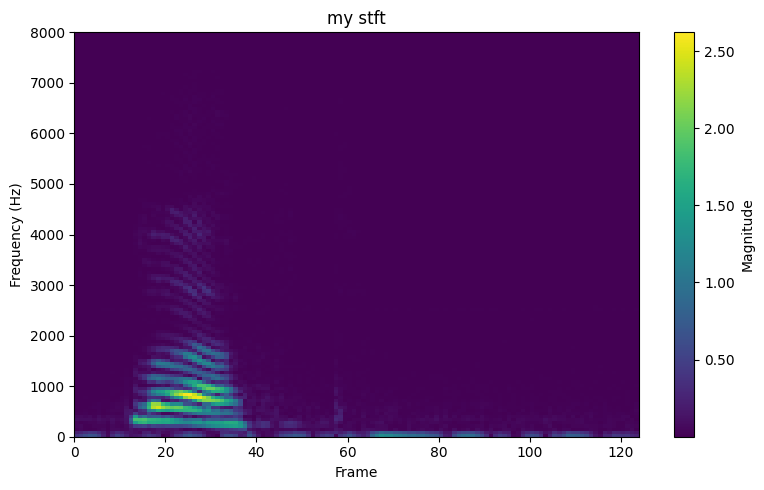

(1, 124, 129, 1)
File: 2a0b413e_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.98


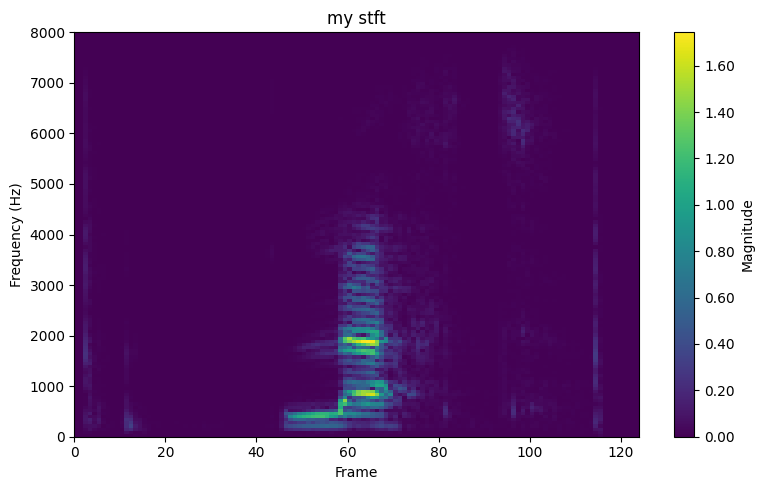

(1, 124, 129, 1)
File: 824e8ce5_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9803921568627451


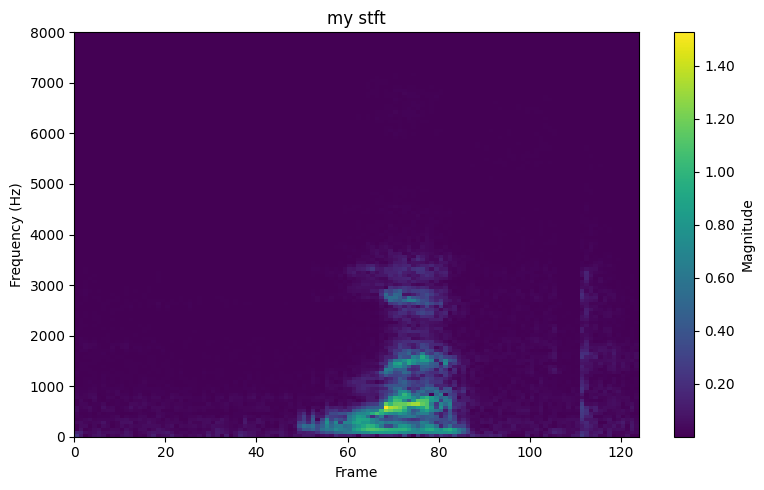

(1, 124, 129, 1)
File: 3e3fa7fd_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9807692307692307


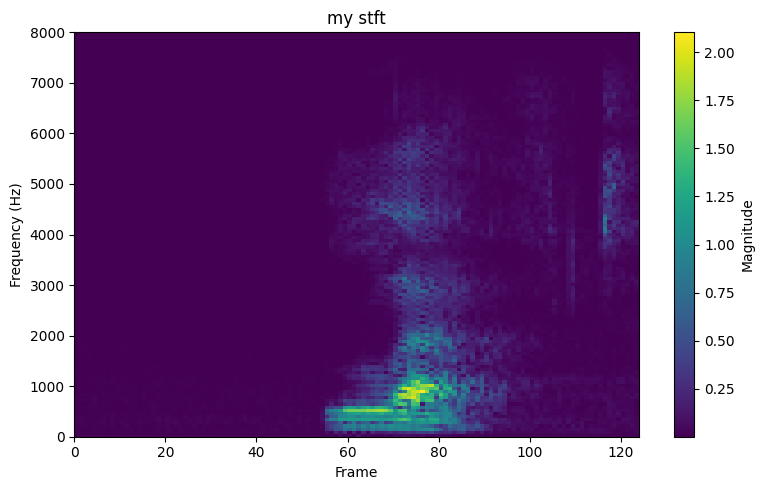

(1, 124, 129, 1)
File: b2fbe484_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9811320754716981


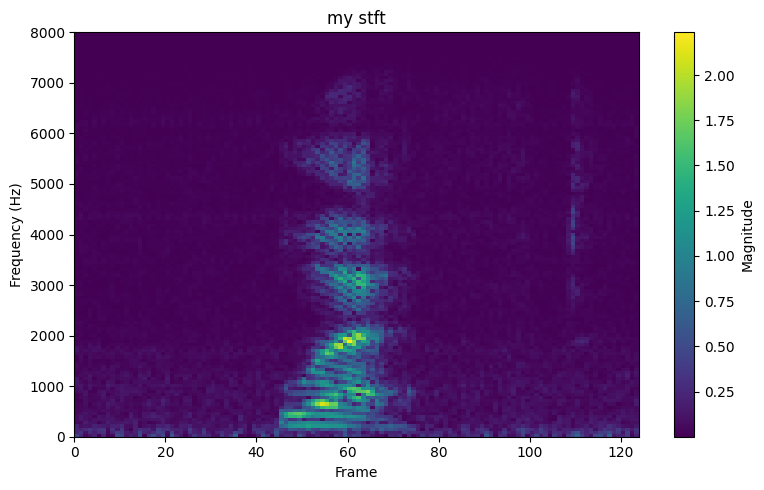

(1, 124, 129, 1)
File: 4a803e67_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9814814814814815


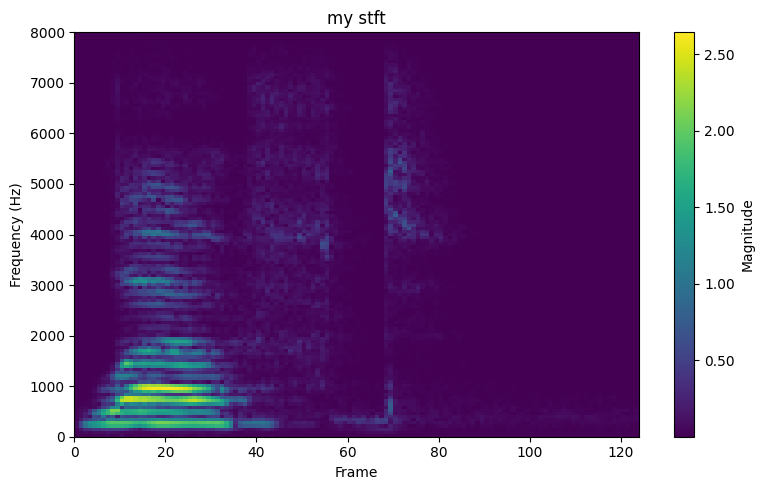

(1, 124, 129, 1)
File: 9ce7a419_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9818181818181818


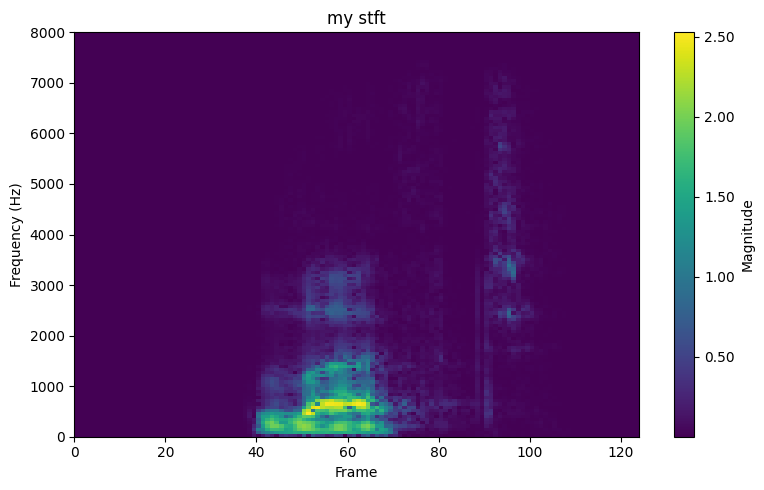

(1, 124, 129, 1)
File: d197e3ae_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9821428571428571


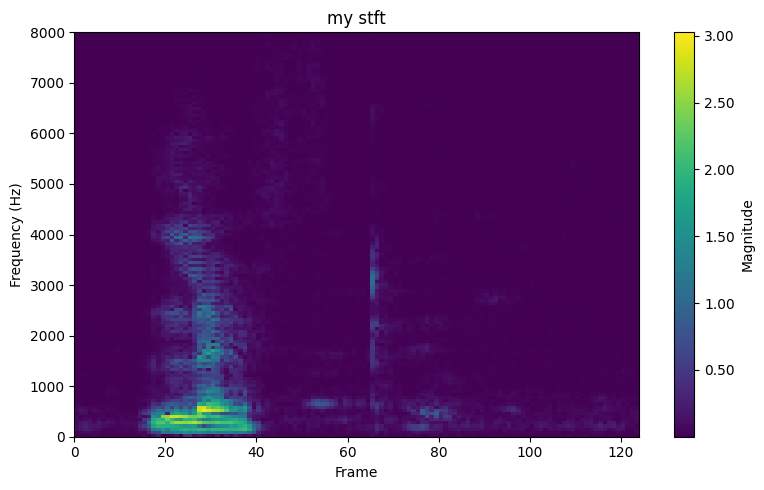

(1, 124, 129, 1)
File: 28e47b1a_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9824561403508771


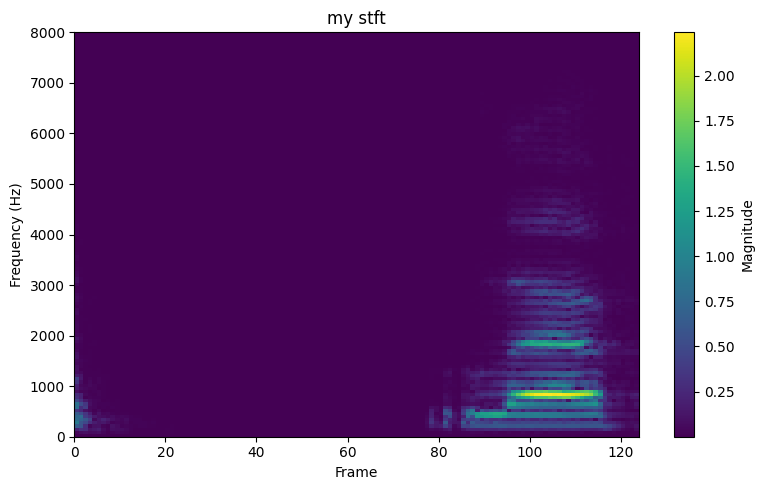

(1, 124, 129, 1)
File: 5ac04a92_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9827586206896551


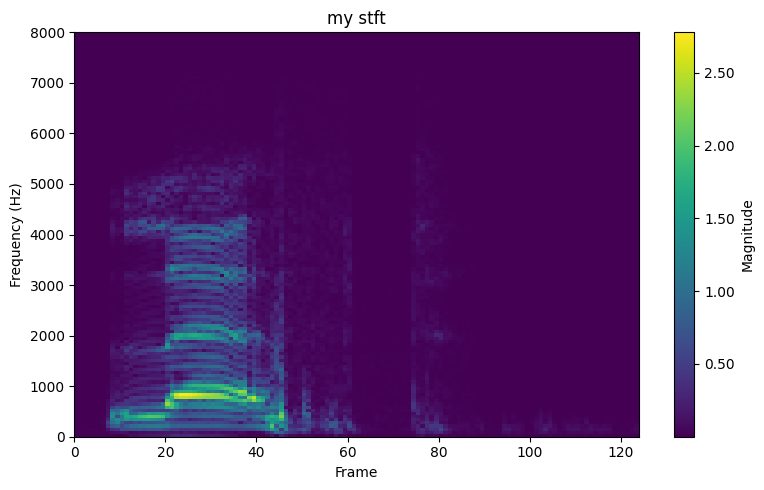

(1, 124, 129, 1)
File: 2151b09a_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9830508474576272


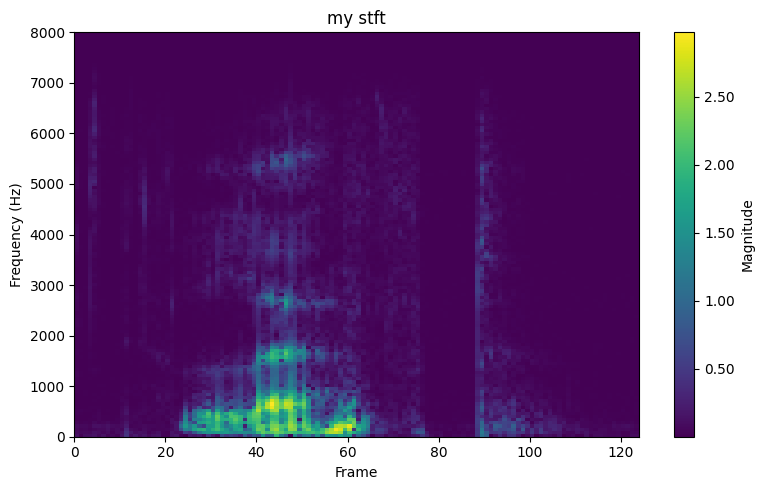

(1, 124, 129, 1)
File: 1d1fe0a0_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9833333333333333


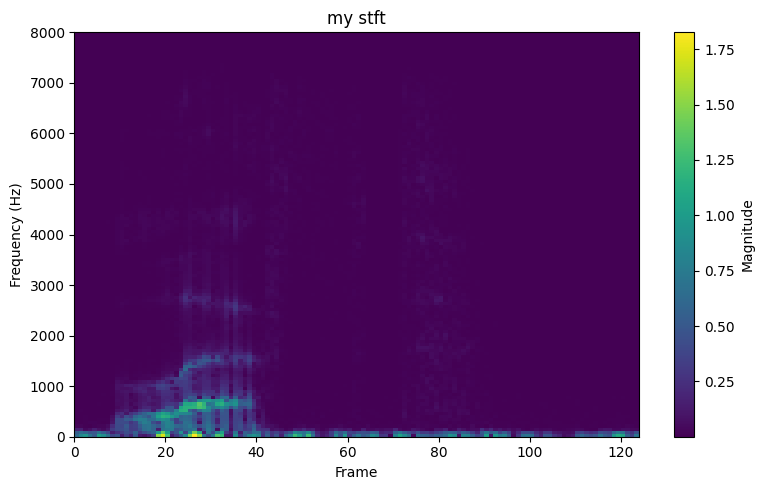

(1, 124, 129, 1)
File: 53d5b86f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9836065573770492


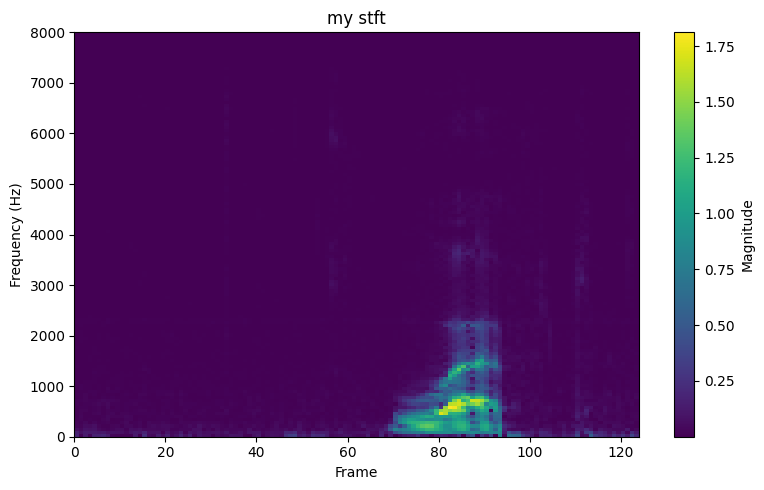

(1, 124, 129, 1)
File: 2313e093_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9838709677419355


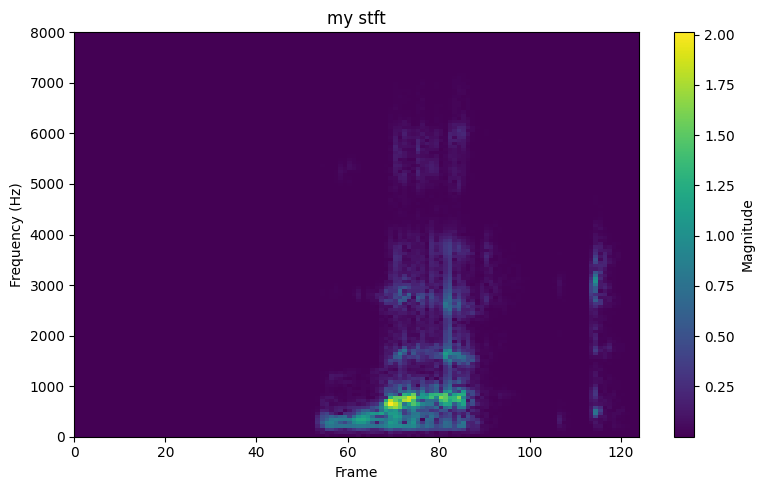

(1, 124, 129, 1)
File: 5db0e146_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9841269841269841


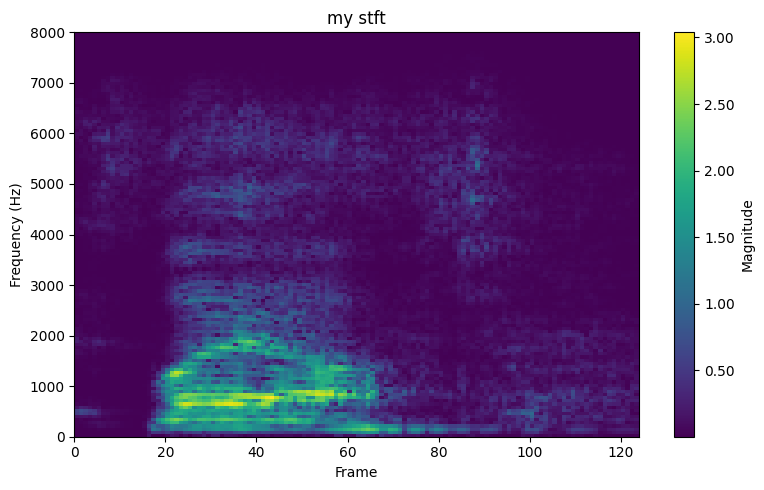

(1, 124, 129, 1)
File: 39a12648_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.984375


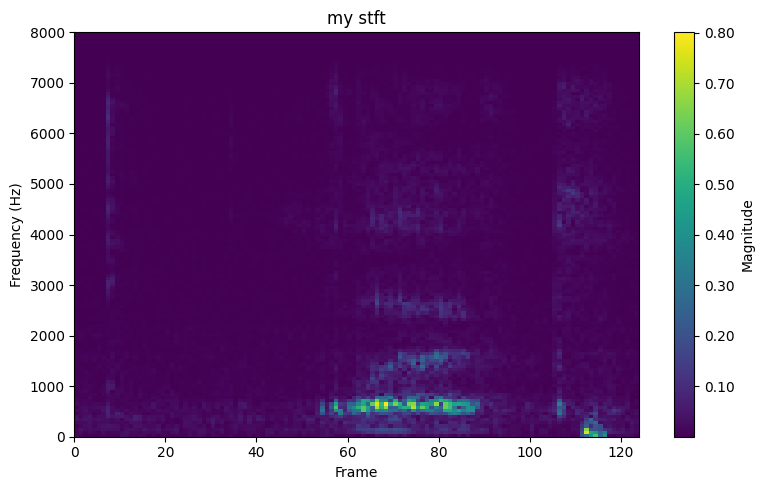

(1, 124, 129, 1)
File: fd32732a_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9846153846153847


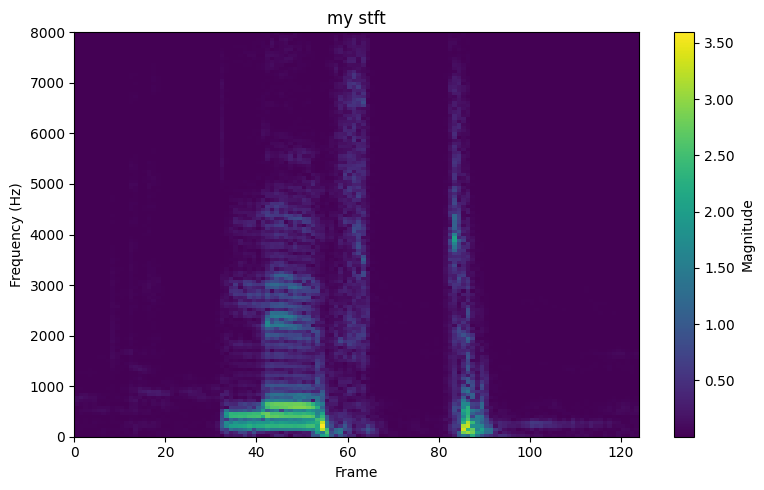

(1, 124, 129, 1)
File: 8e05039f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9848484848484849


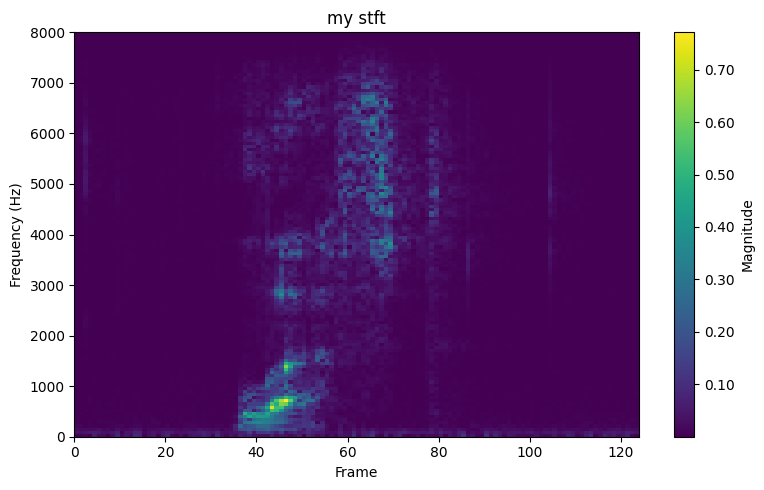

(1, 124, 129, 1)
File: 5e1b34a6_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9850746268656716


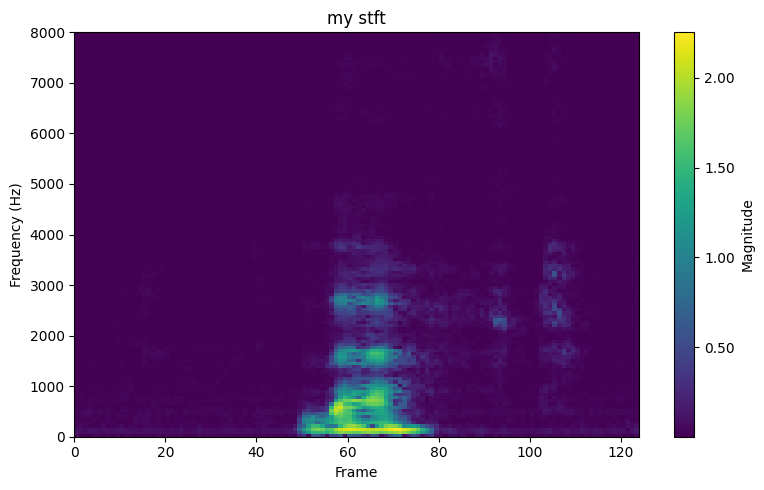

(1, 124, 129, 1)
File: bdee441c_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9852941176470589


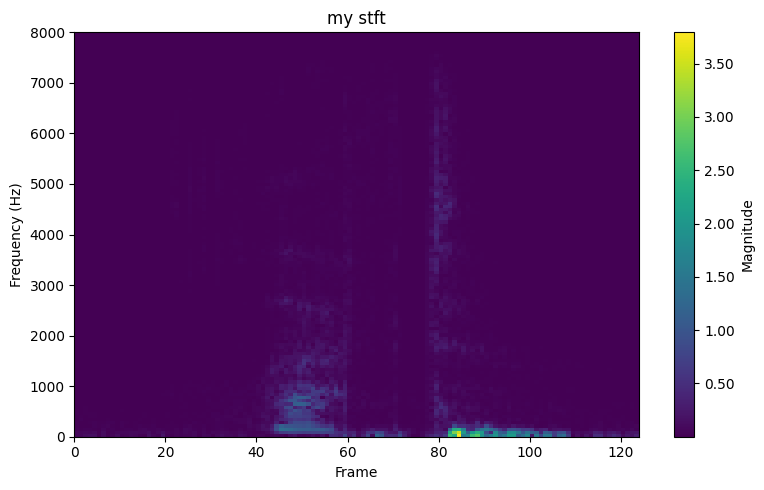

(1, 124, 129, 1)
File: 33246bc2_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9855072463768116


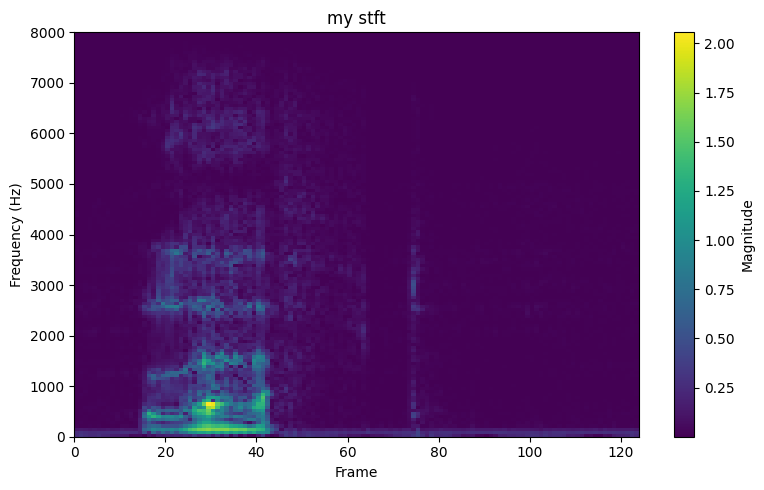

(1, 124, 129, 1)
File: 7096522d_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9857142857142858


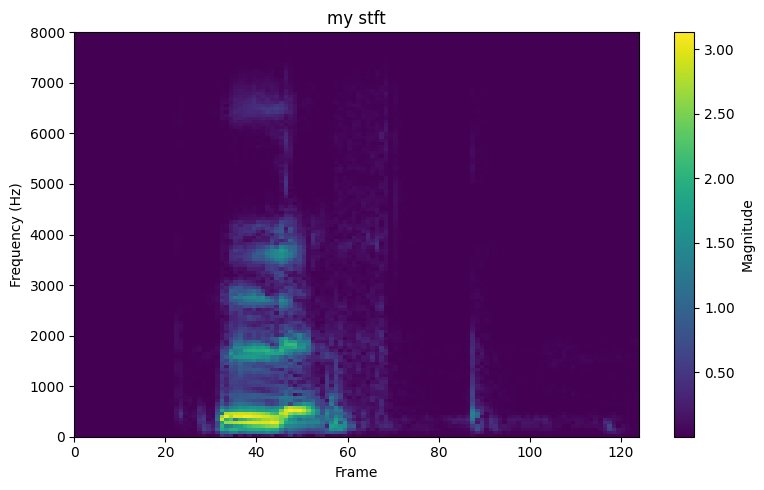

(1, 124, 129, 1)
File: dea820ce_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9859154929577465


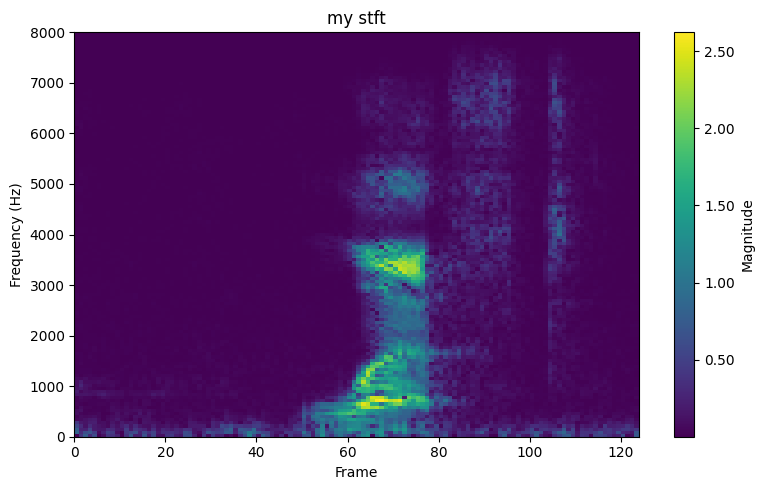

(1, 124, 129, 1)
File: 7ca023e2_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9861111111111112


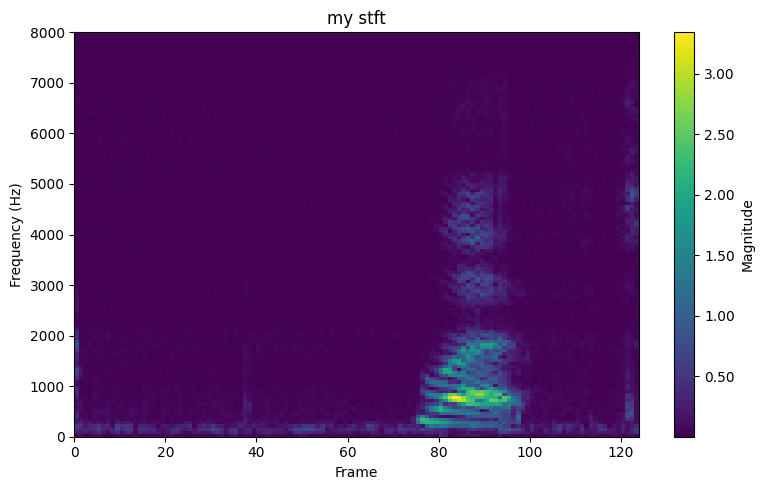

(1, 124, 129, 1)
File: 4c841771_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9863013698630136


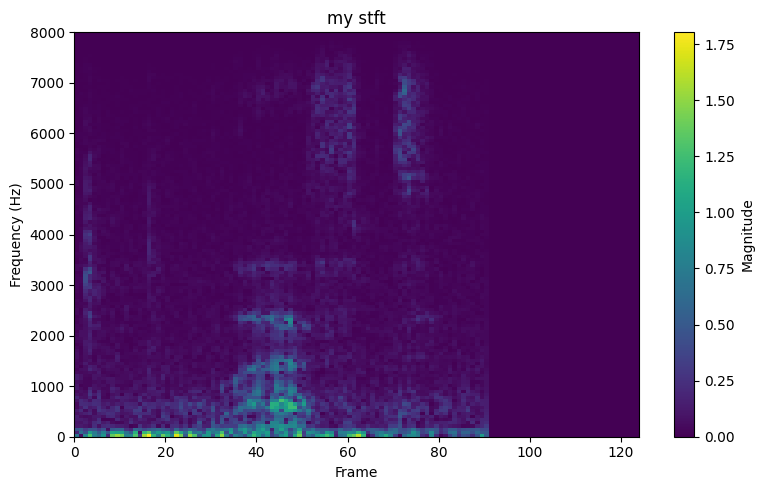

(1, 124, 129, 1)
File: cd3331a6_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9864864864864865


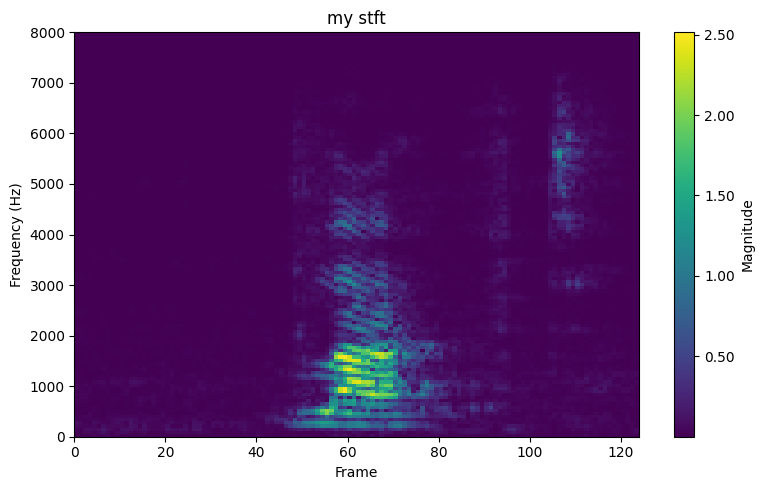

(1, 124, 129, 1)
File: 2ad772d6_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9866666666666667


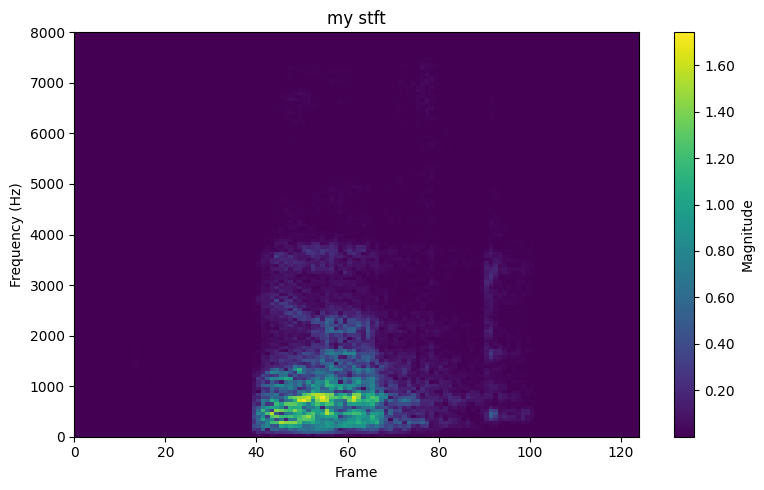

(1, 124, 129, 1)
File: 6727b579_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9868421052631579


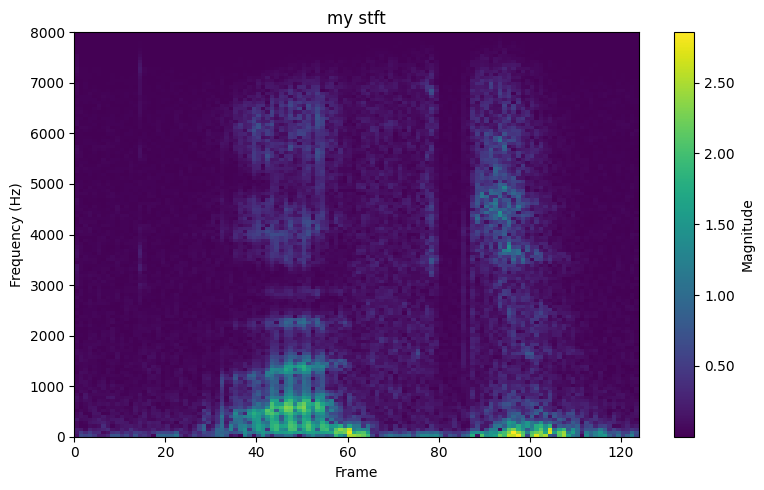

(1, 124, 129, 1)
File: 42ccb57a_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.987012987012987


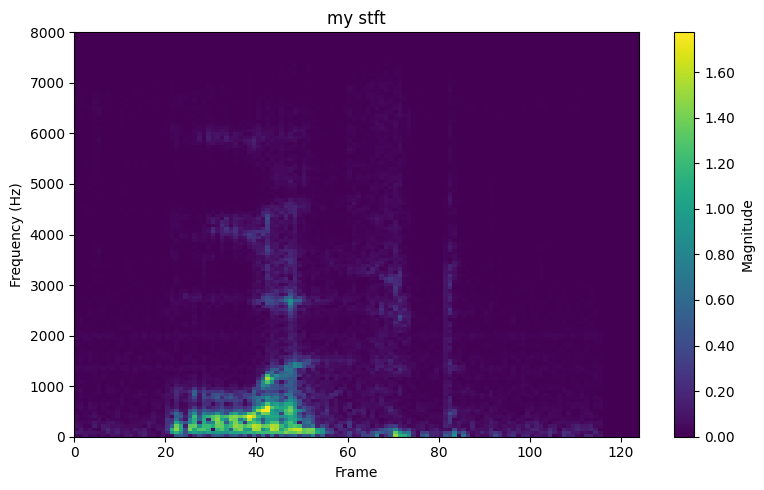

(1, 124, 129, 1)
File: 1cc80e39_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9871794871794872


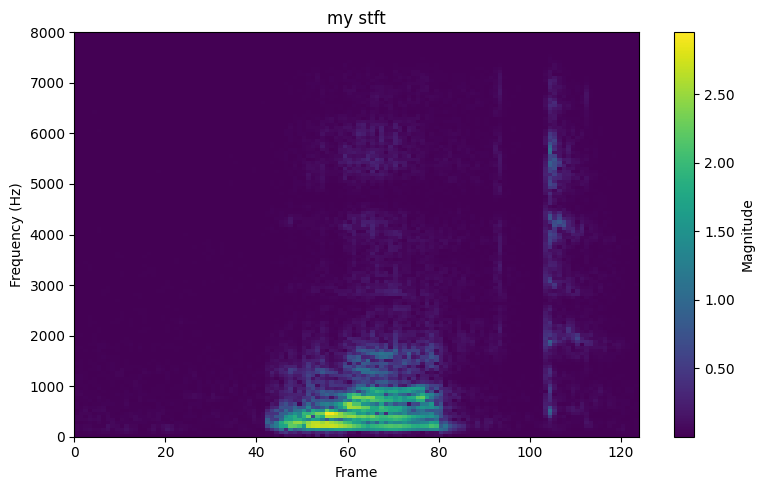

(1, 124, 129, 1)
File: 325a0c39_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9873417721518988


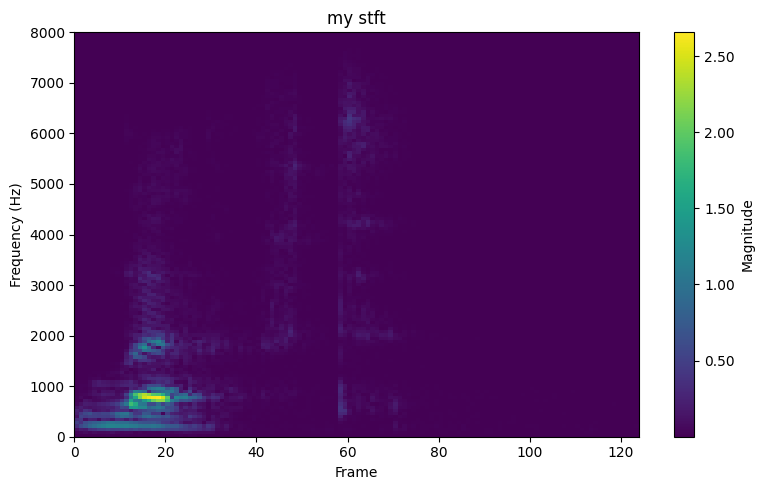

(1, 124, 129, 1)
File: adec6a94_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9875


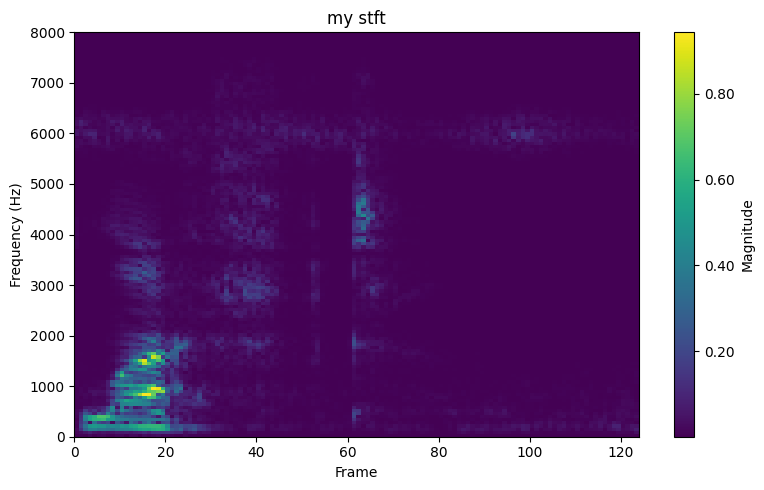

(1, 124, 129, 1)
File: 6166ae21_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9876543209876543


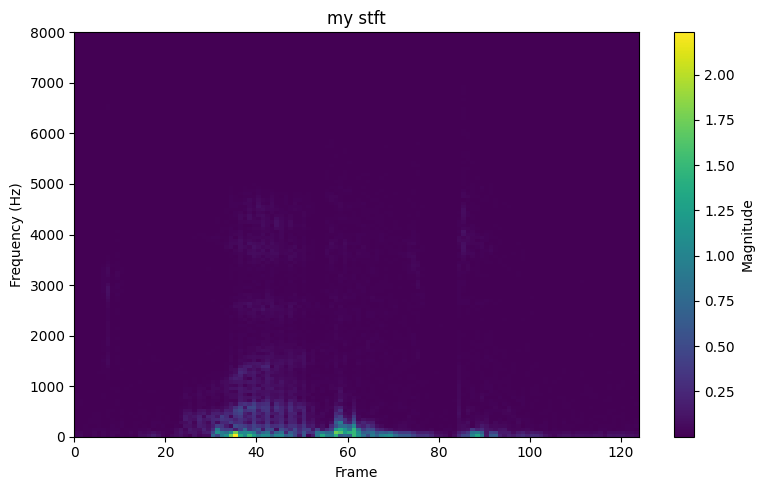

(1, 124, 129, 1)
File: c37a72d3_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9878048780487805


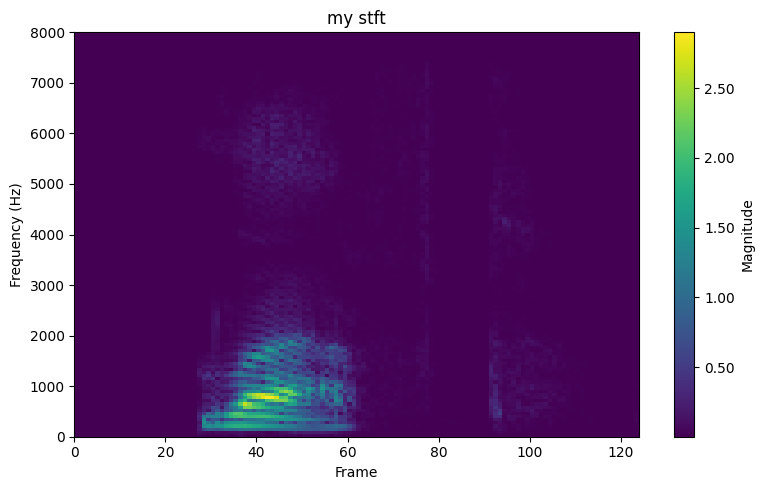

(1, 124, 129, 1)
File: 3efef882_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9879518072289156


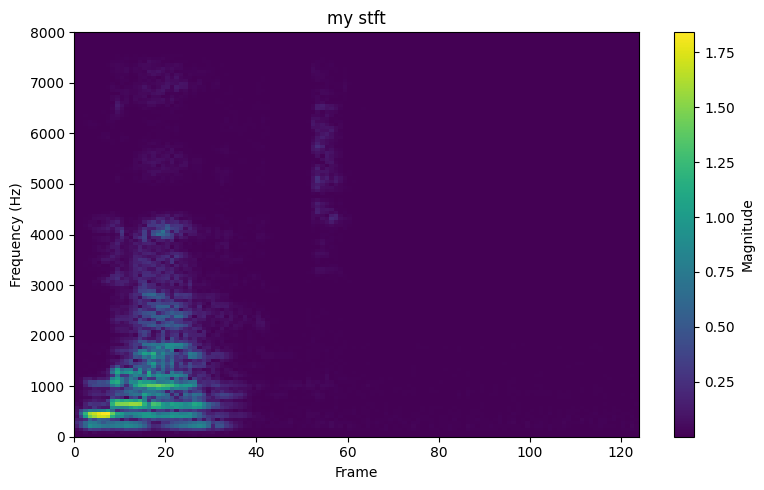

(1, 124, 129, 1)
File: 06a79a03_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9880952380952381


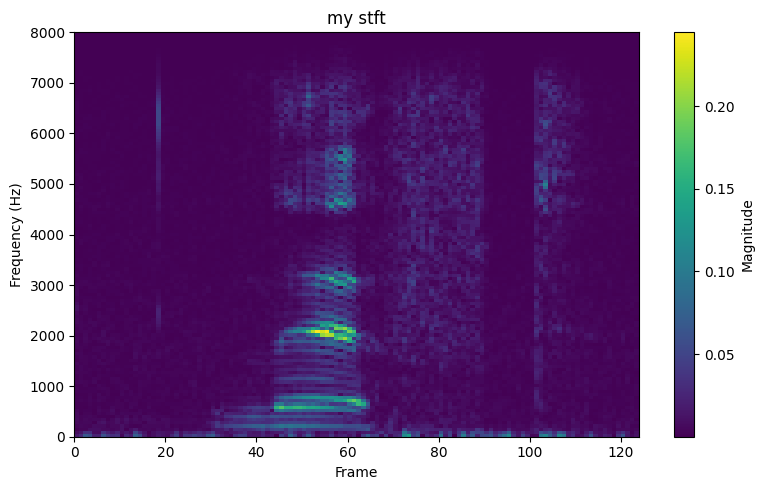

(1, 124, 129, 1)
File: eee9b9e2_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9882352941176471


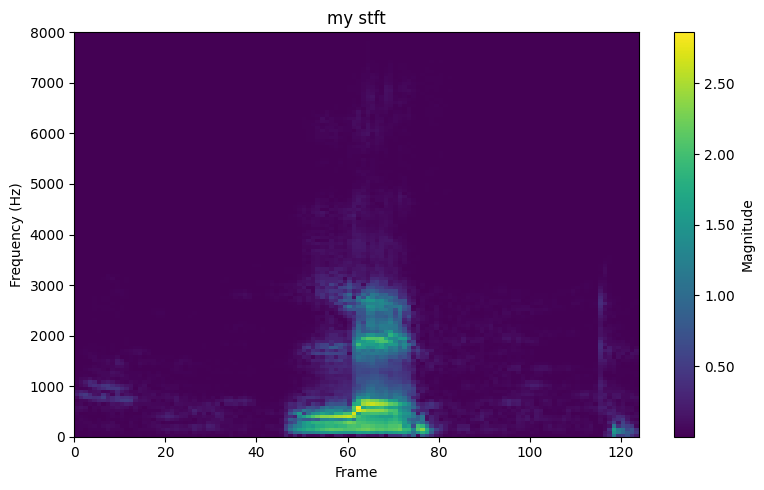

(1, 124, 129, 1)
File: b97c9f77_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 0.9883720930232558


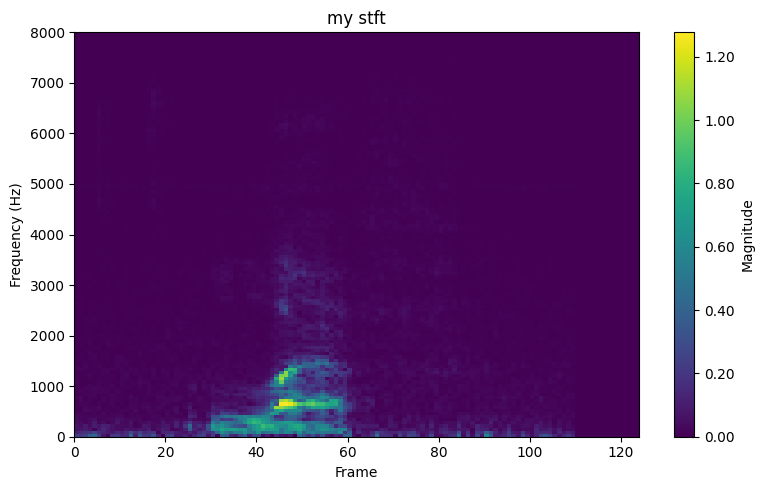

(1, 124, 129, 1)
File: 82c6d220_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9885057471264368


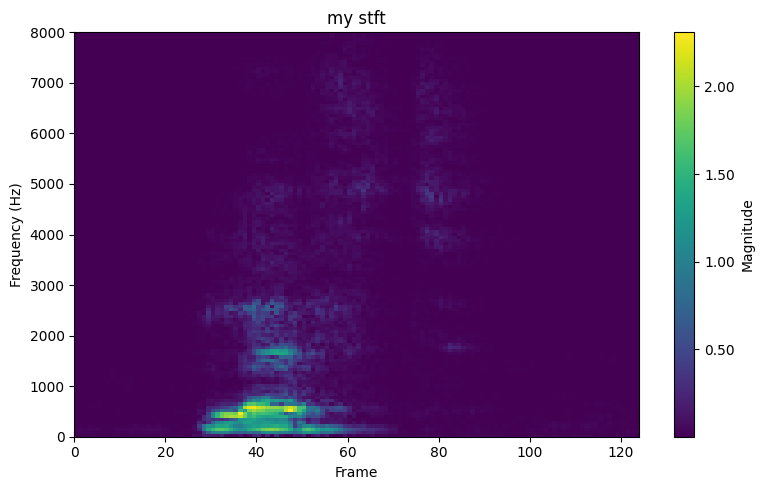

(1, 124, 129, 1)
File: 10ace7eb_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9886363636363636


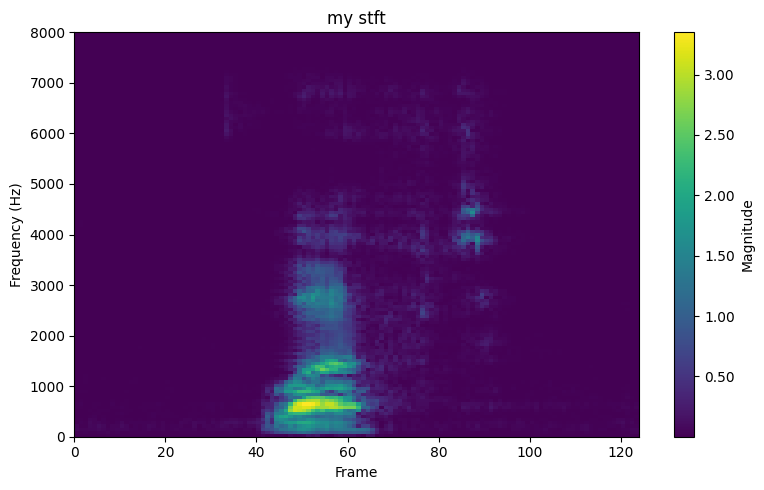

(1, 124, 129, 1)
File: 2b42e7a2_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9887640449438202


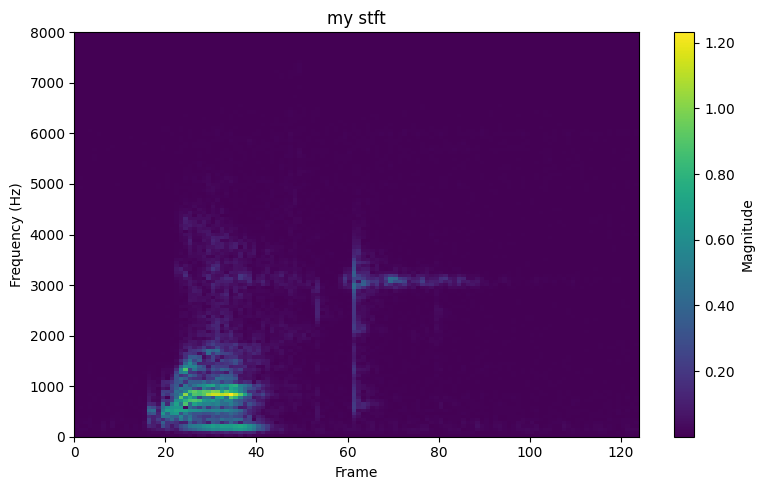

(1, 124, 129, 1)
File: 1daa5ada_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9888888888888889


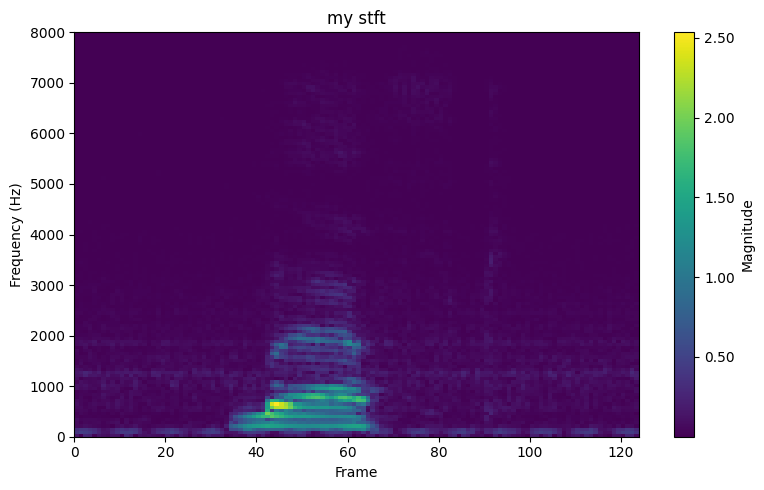

(1, 124, 129, 1)
File: ff21fb59_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.989010989010989


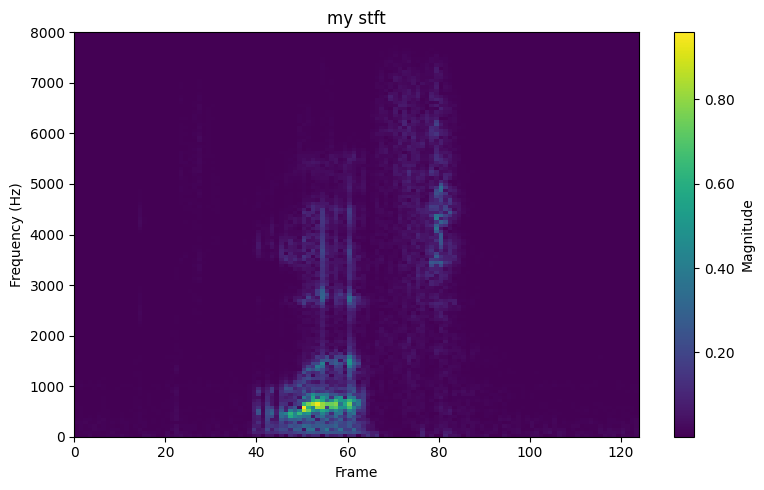

(1, 124, 129, 1)
File: 6f3458b3_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9891304347826086


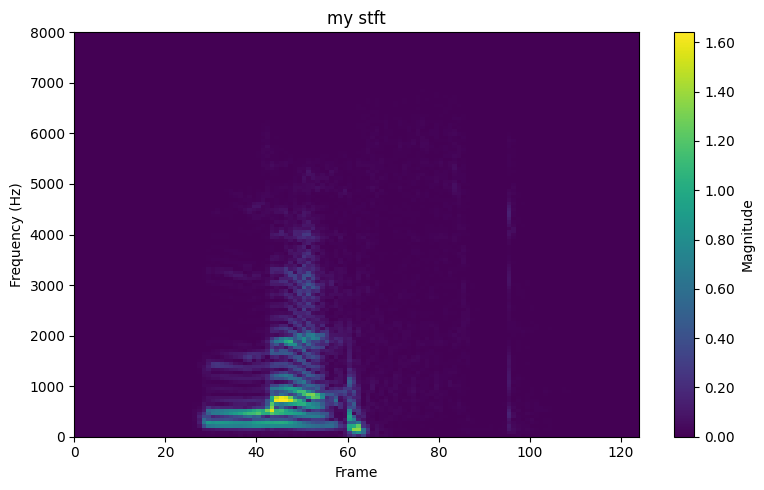

(1, 124, 129, 1)
File: 3d6bee47_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.989247311827957


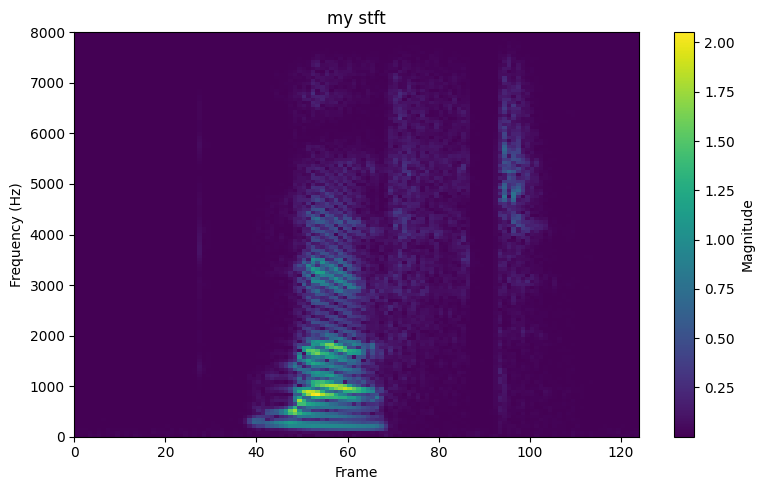

(1, 124, 129, 1)
File: 9d8ac38b_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9893617021276596


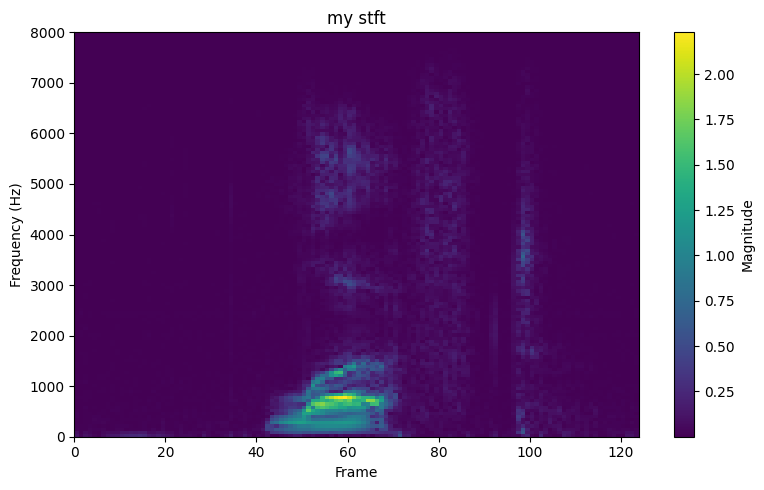

(1, 124, 129, 1)
File: 656e8bb3_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9894736842105263


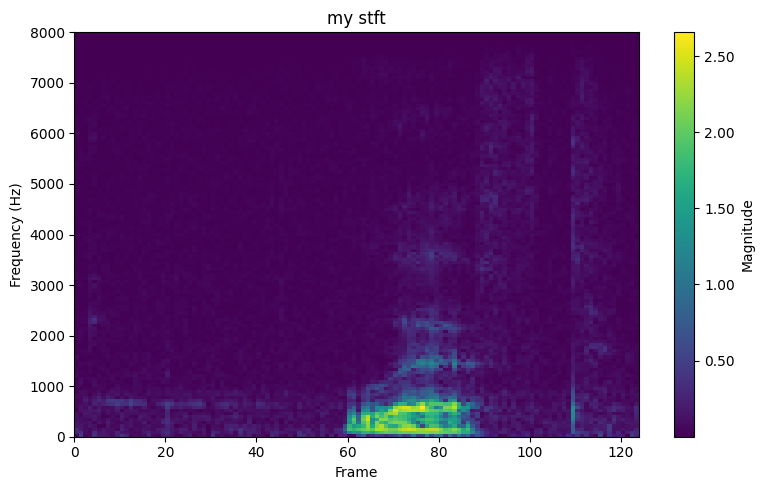

(1, 124, 129, 1)
File: 093f65a1_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9895833333333334


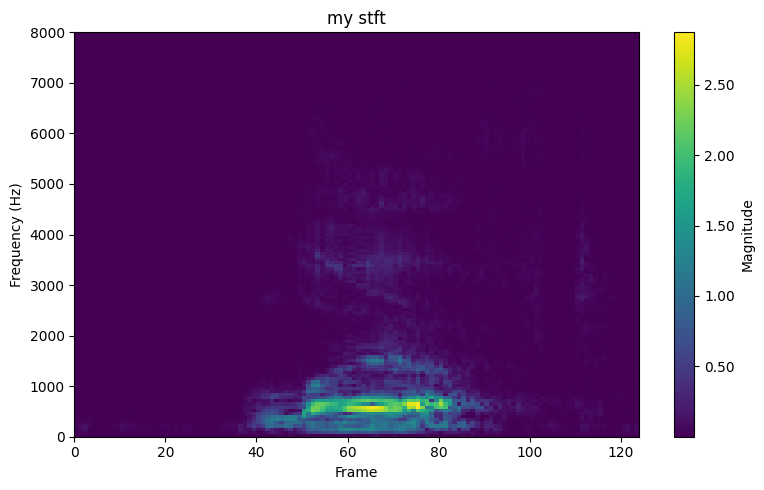

(1, 124, 129, 1)
File: 840eab5a_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9896907216494846


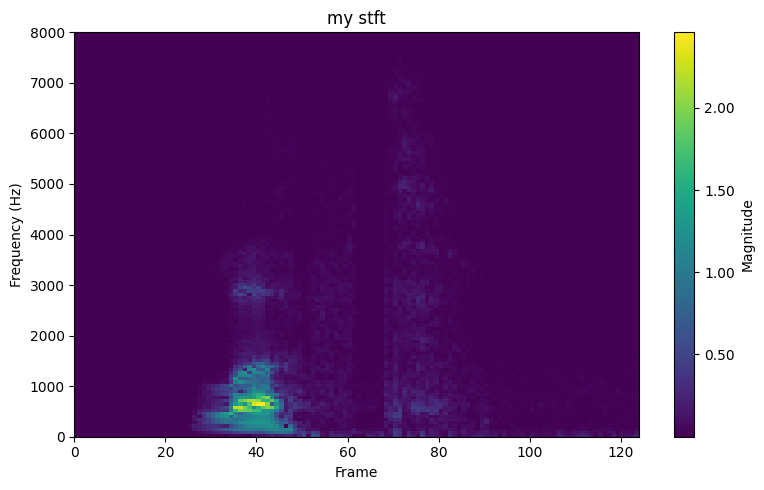

(1, 124, 129, 1)
File: 7910d292_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9897959183673469


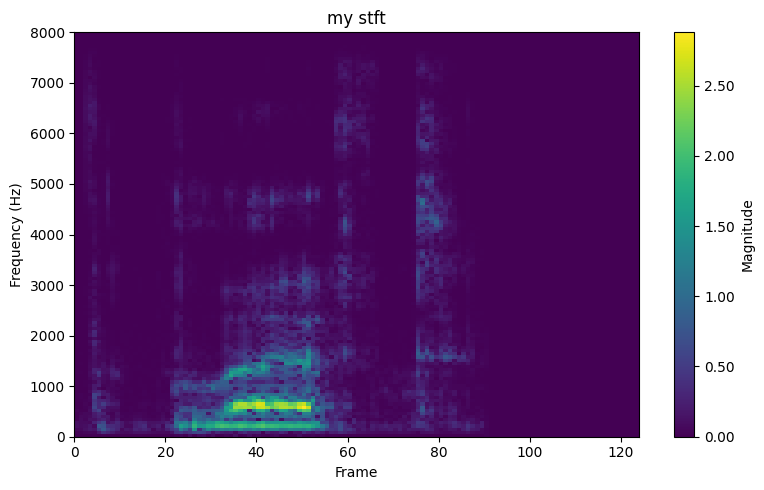

(1, 124, 129, 1)
File: 61d3e51e_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.98989898989899


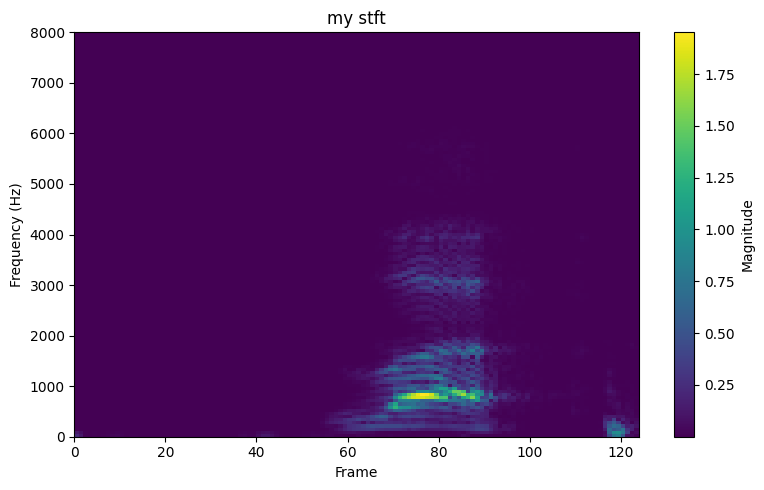

(1, 124, 129, 1)
File: 44c201dd_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.99


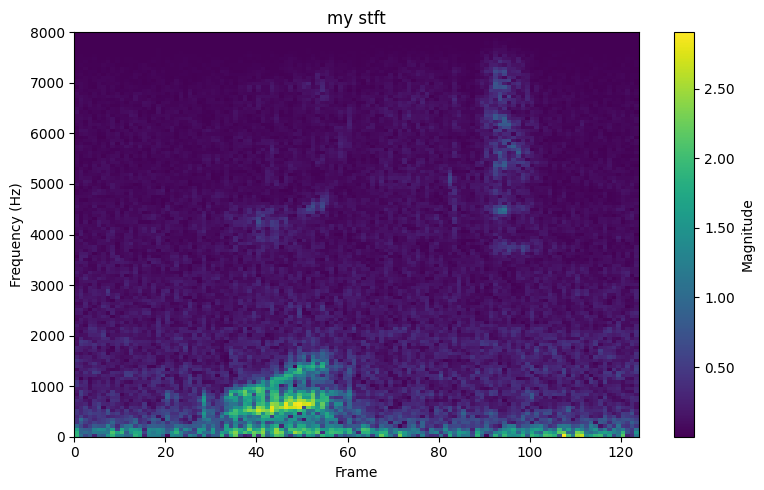

(1, 124, 129, 1)
File: d0ce2418_nohash_2.wav, True label: left, Predicted label: right

Accuracy: 0.9801980198019802


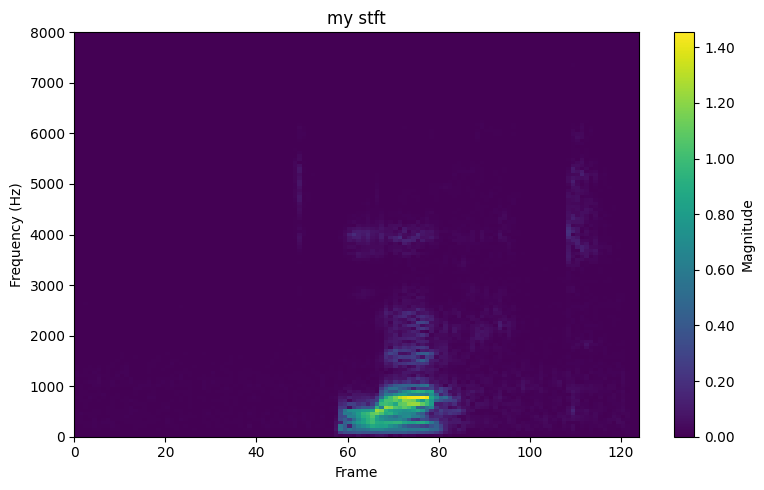

(1, 124, 129, 1)
File: 73af0c50_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9803921568627451


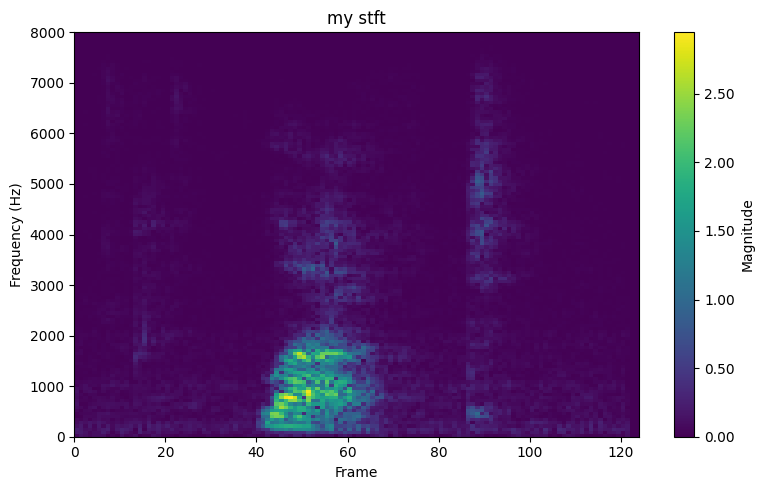

(1, 124, 129, 1)
File: 57cb3575_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9805825242718447


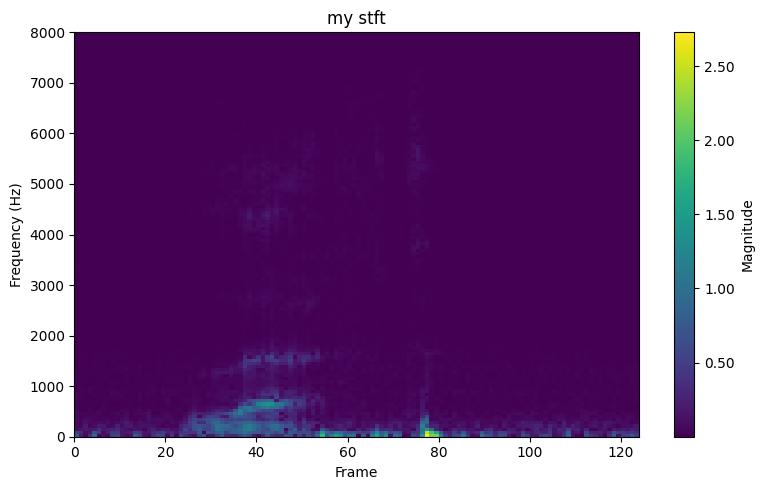

(1, 124, 129, 1)
File: fac74f6a_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9807692307692307


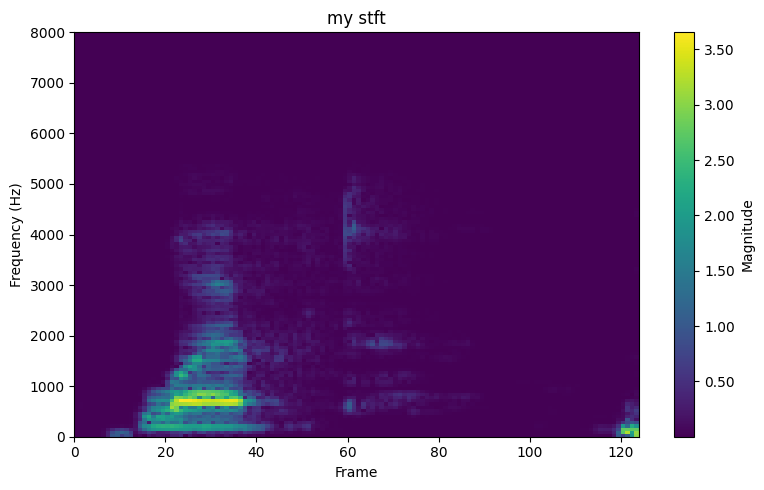

(1, 124, 129, 1)
File: f6581345_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9809523809523809


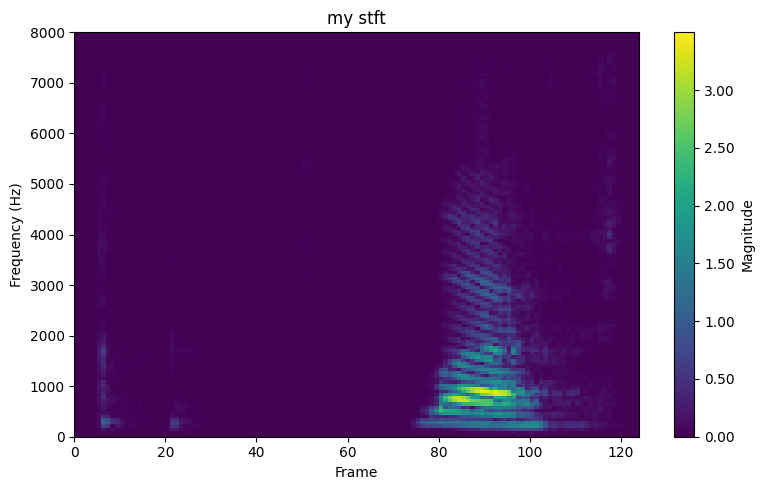

(1, 124, 129, 1)
File: 274c008f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9811320754716981


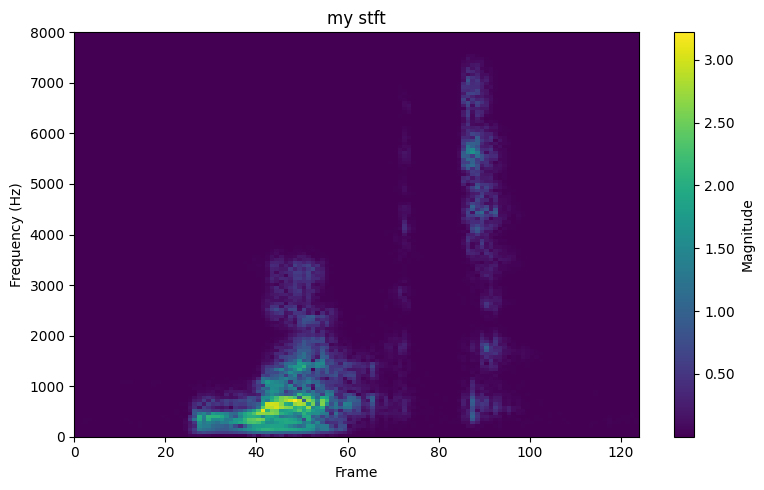

(1, 124, 129, 1)
File: 5f814c23_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9813084112149533


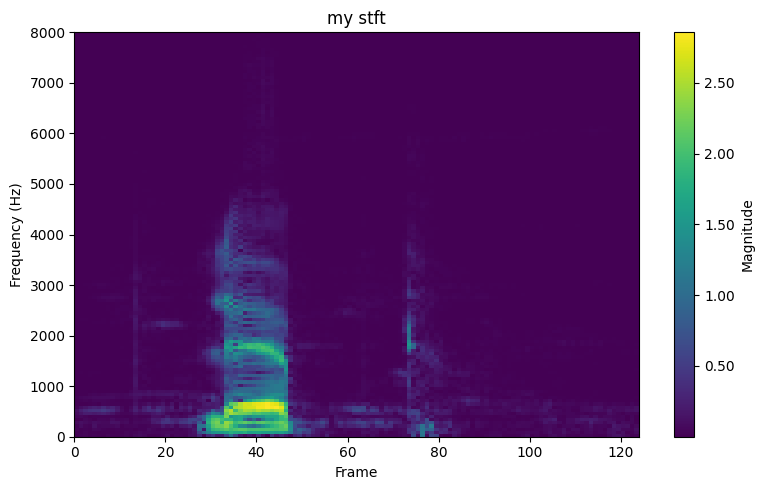

(1, 124, 129, 1)
File: e1469561_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9814814814814815


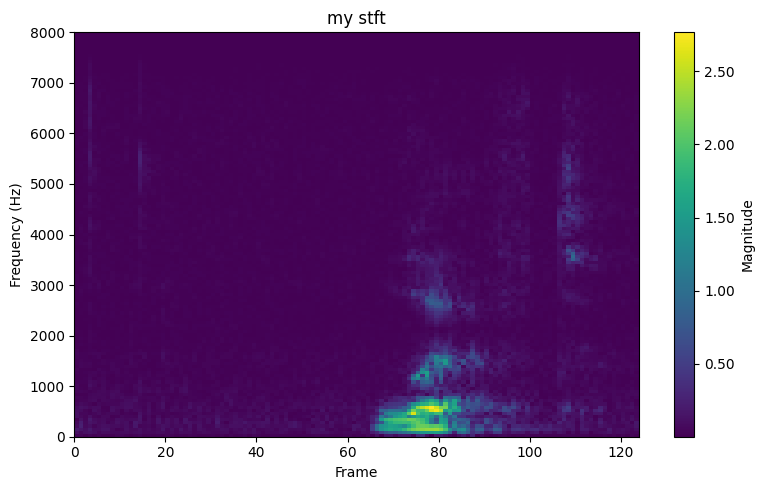

(1, 124, 129, 1)
File: 1cec8d71_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.981651376146789


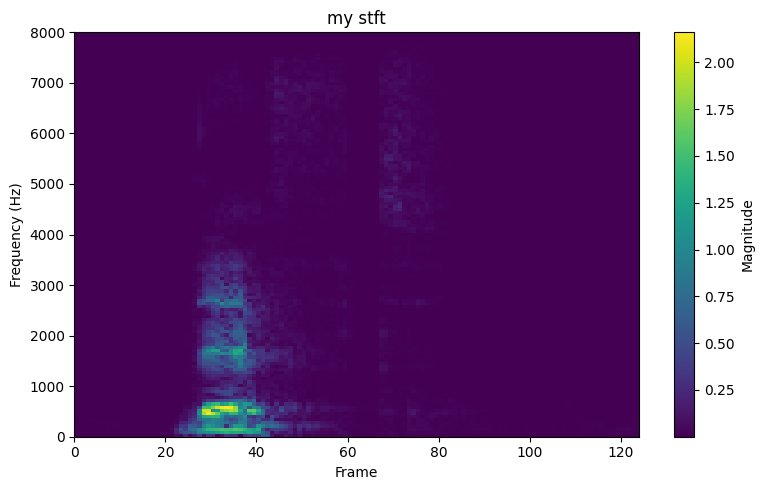

(1, 124, 129, 1)
File: 70a00e98_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9818181818181818


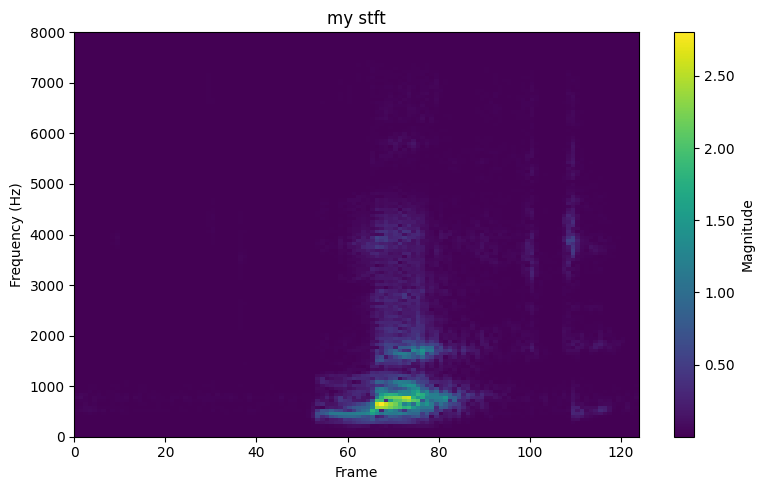

(1, 124, 129, 1)
File: 338dacf5_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9819819819819819


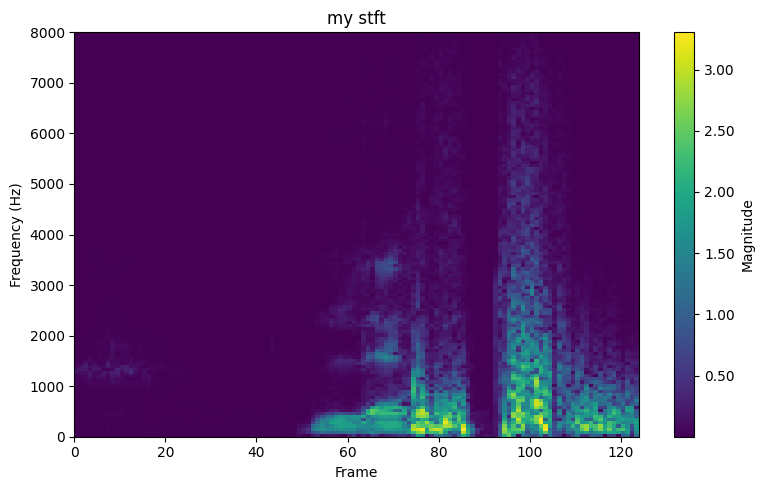

(1, 124, 129, 1)
File: c1d39ce8_nohash_7.wav, True label: left, Predicted label: left

Accuracy: 0.9821428571428571


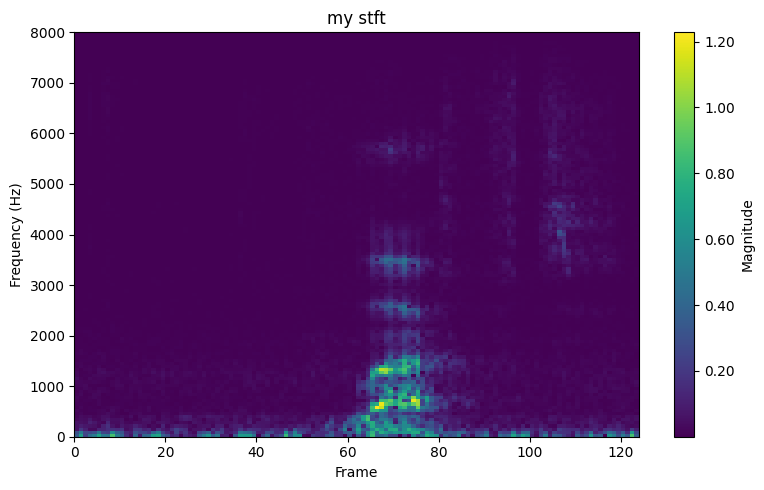

(1, 124, 129, 1)
File: 924c1a04_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9823008849557522


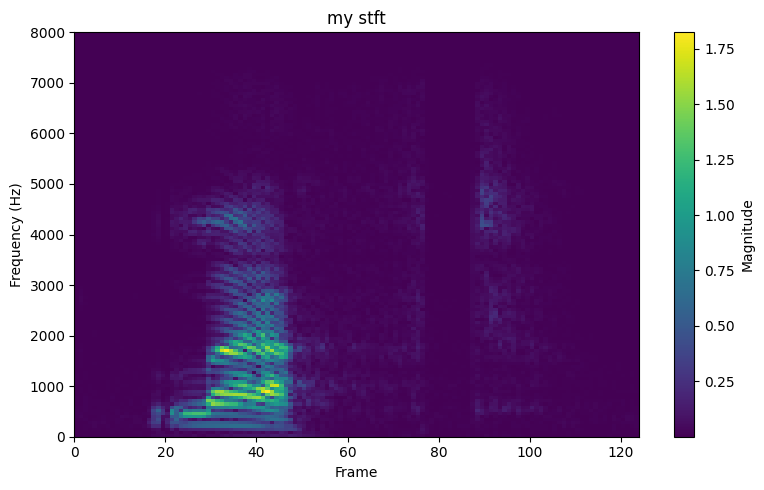

(1, 124, 129, 1)
File: f19d1738_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9824561403508771


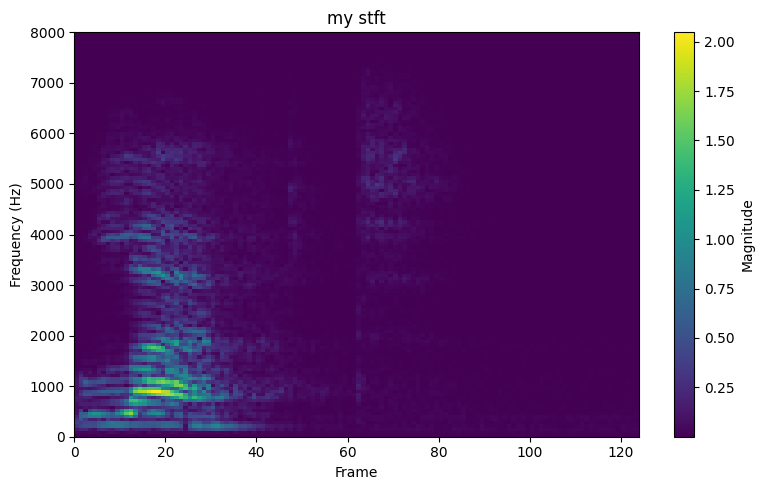

(1, 124, 129, 1)
File: 553f1a79_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9826086956521739


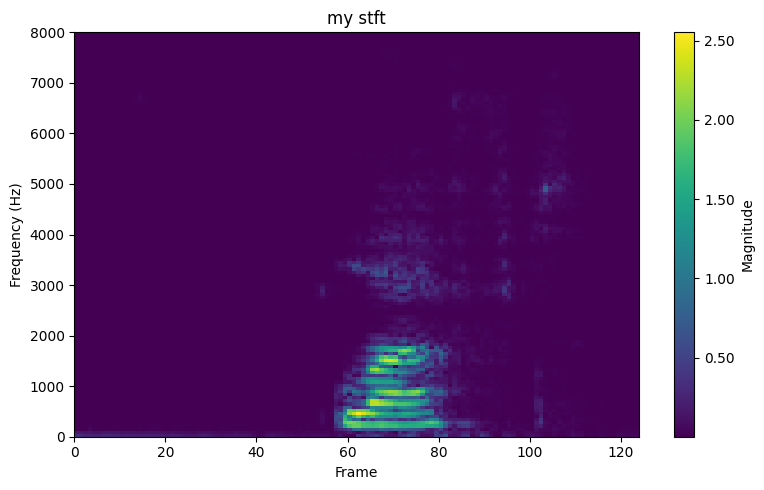

(1, 124, 129, 1)
File: 51eefcc6_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9827586206896551


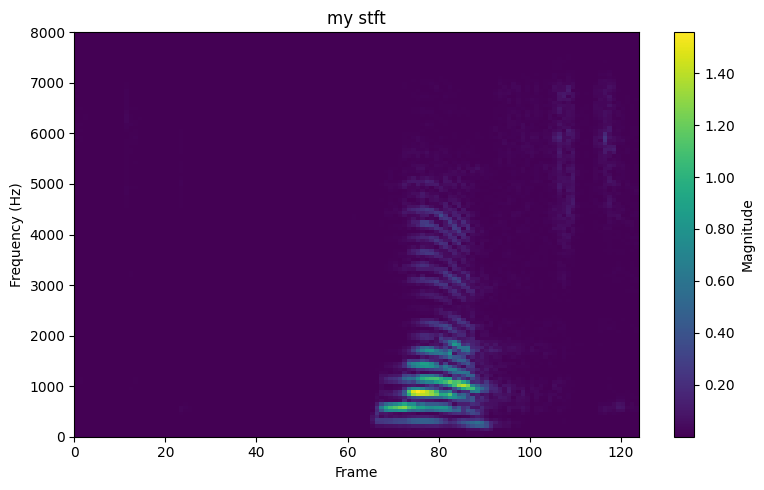

(1, 124, 129, 1)
File: dd6c6806_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9829059829059829


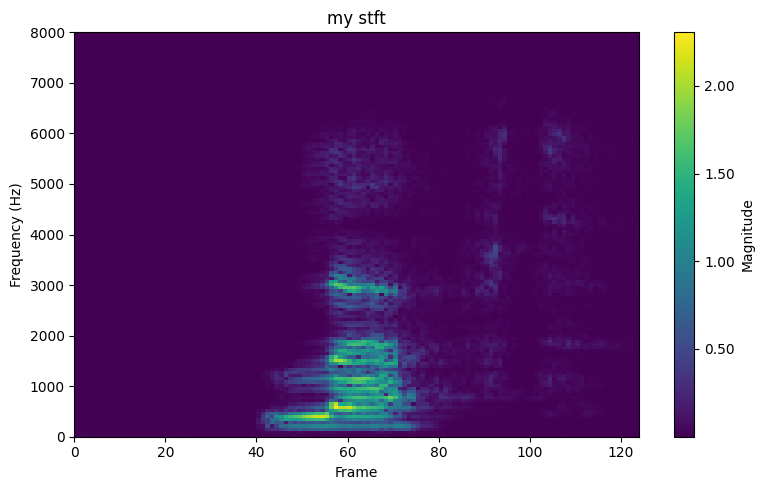

(1, 124, 129, 1)
File: 2c6d3924_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9830508474576272


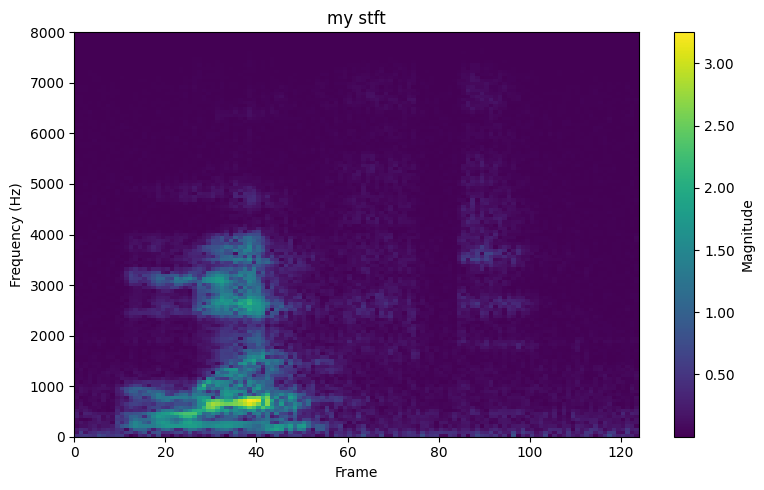

(1, 124, 129, 1)
File: f7b43563_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9831932773109243


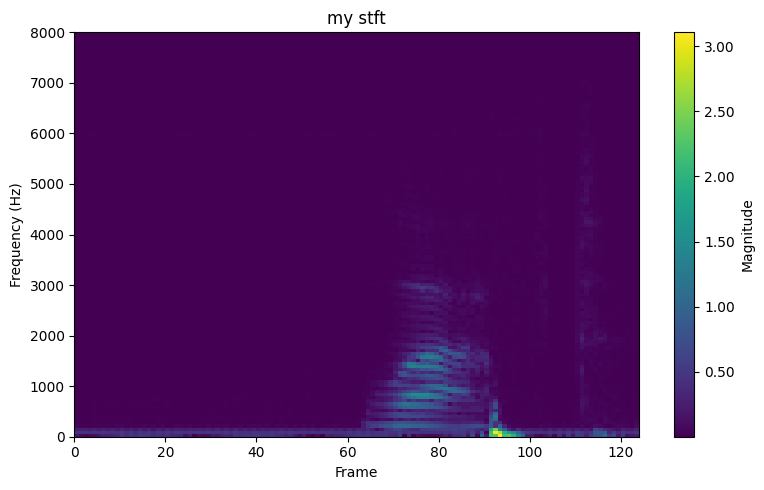

(1, 124, 129, 1)
File: a4baac4e_nohash_0.wav, True label: left, Predicted label: right

Accuracy: 0.975


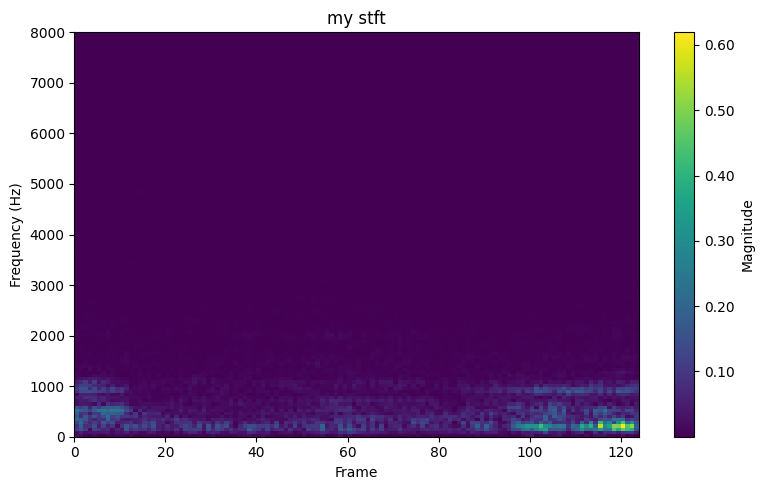

(1, 124, 129, 1)
File: 3bfd30e6_nohash_0.wav, True label: left, Predicted label: go

Accuracy: 0.9669421487603306


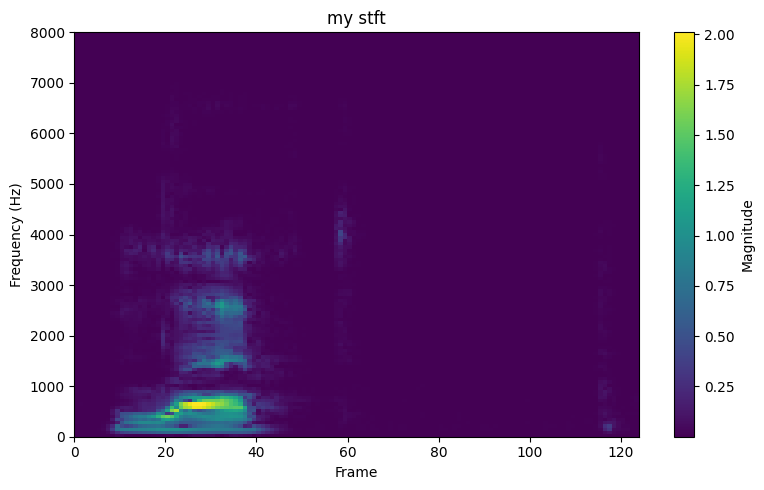

(1, 124, 129, 1)
File: e72aa705_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9672131147540983


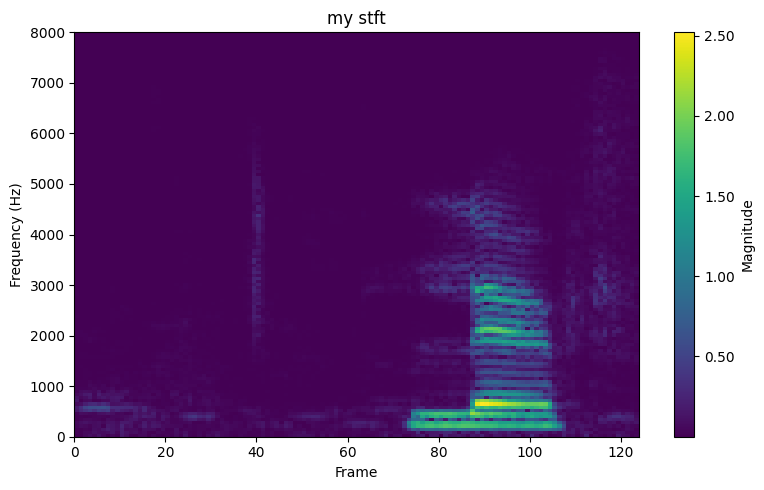

(1, 124, 129, 1)
File: 21832144_nohash_3.wav, True label: left, Predicted label: yes

Accuracy: 0.959349593495935


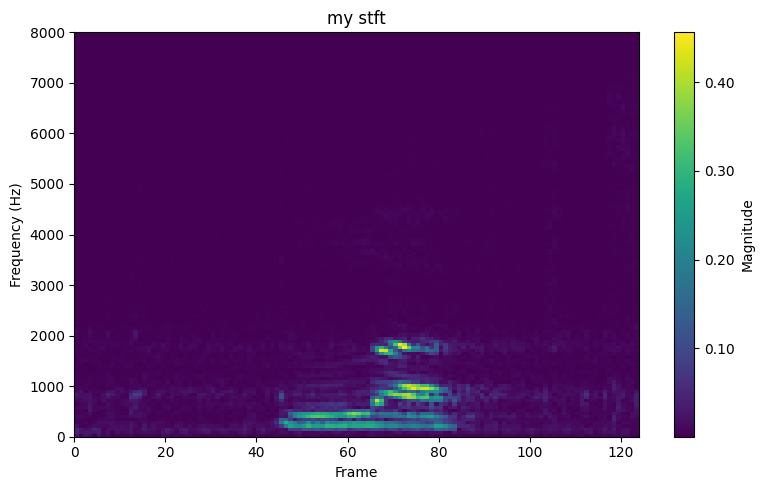

(1, 124, 129, 1)
File: 73dda36a_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9596774193548387


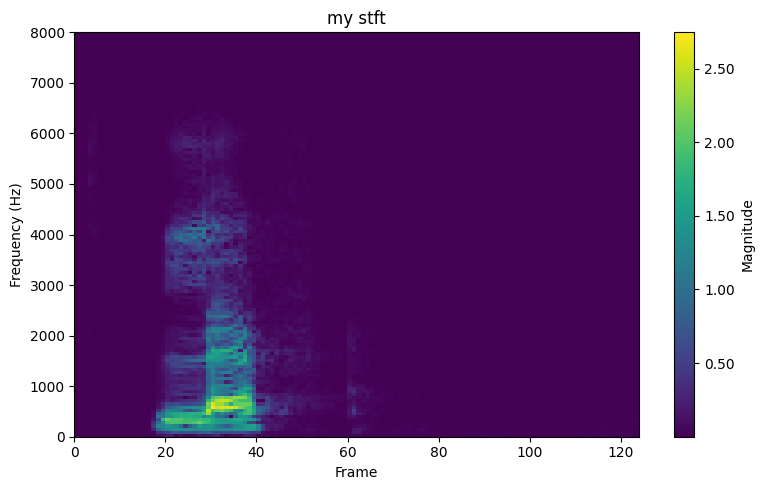

(1, 124, 129, 1)
File: 5c39594f_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.96


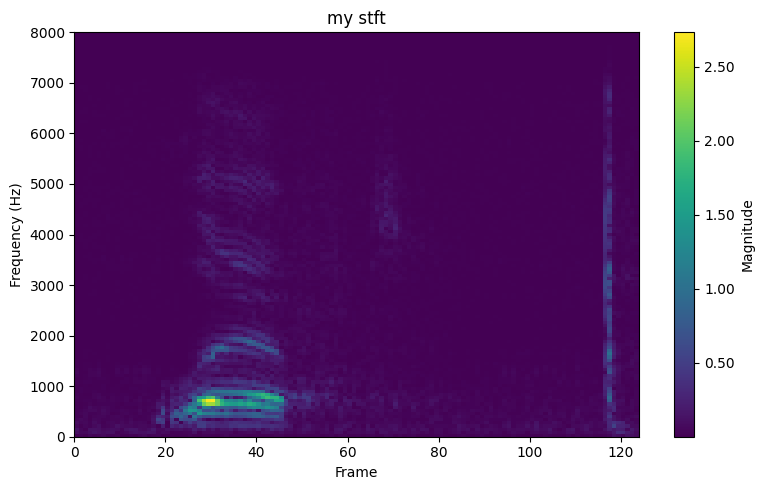

(1, 124, 129, 1)
File: 30802c5d_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9603174603174603


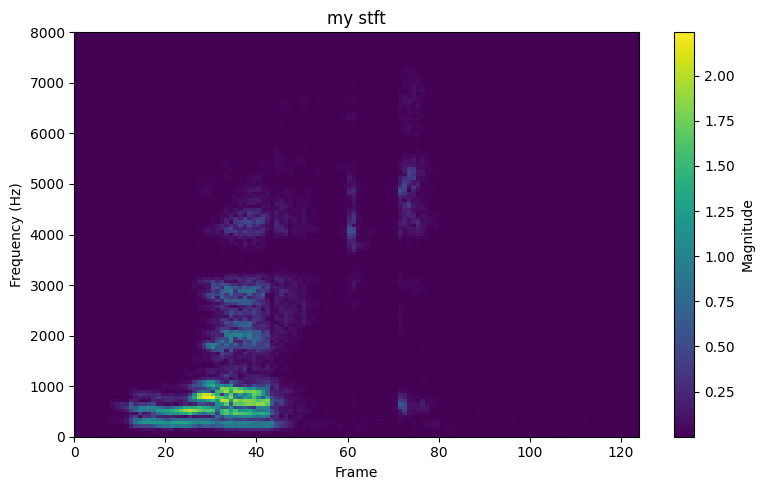

(1, 124, 129, 1)
File: 6add0595_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9606299212598425


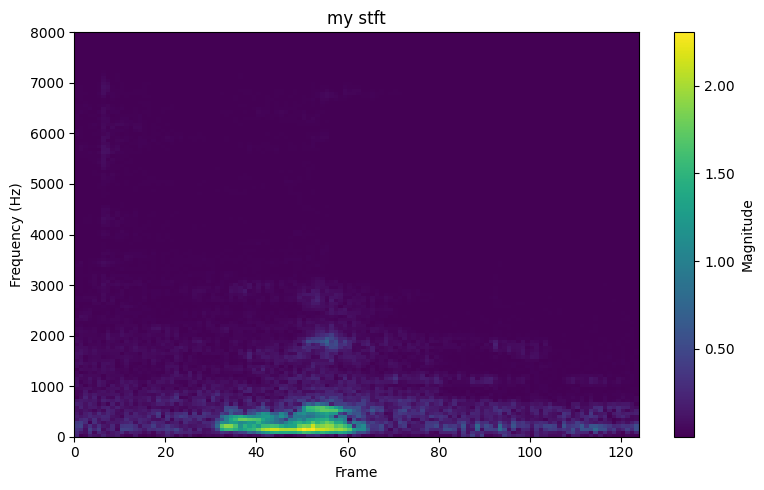

(1, 124, 129, 1)
File: 6a497f80_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9609375


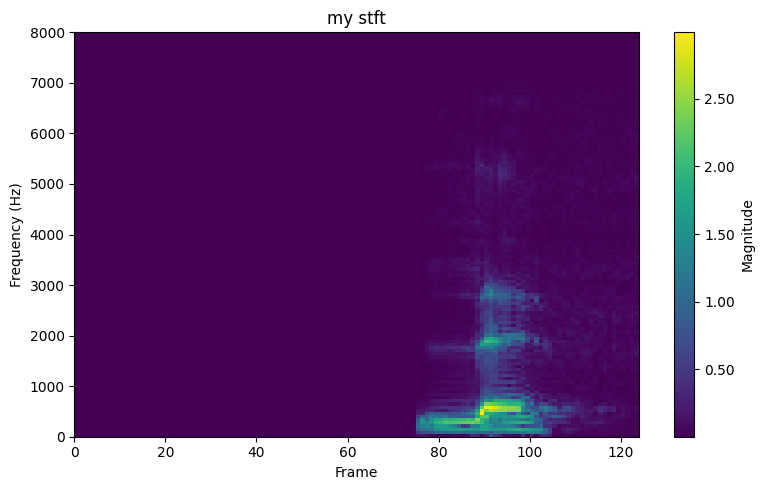

(1, 124, 129, 1)
File: c0445658_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9612403100775194


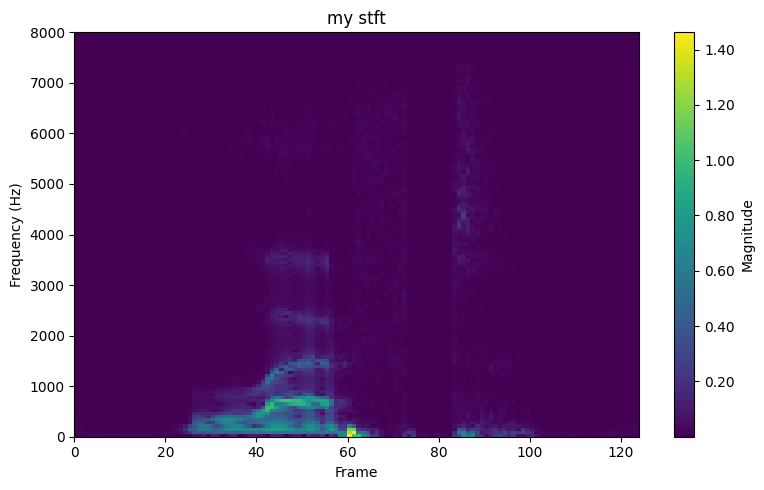

(1, 124, 129, 1)
File: 80f056c0_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9615384615384616


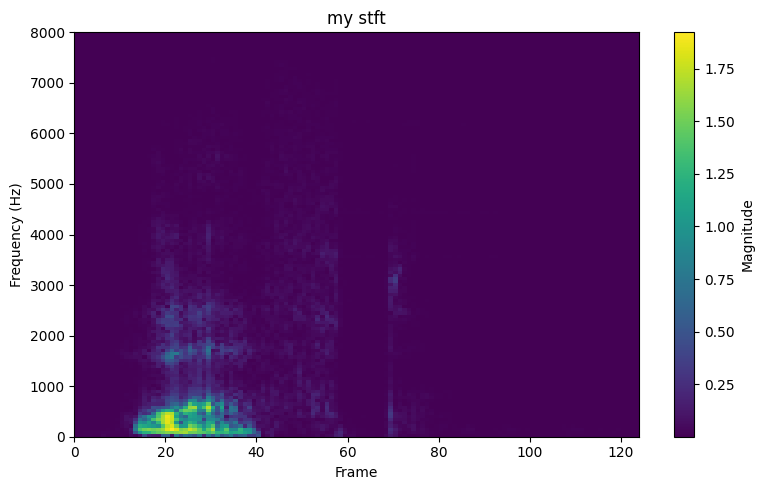

(1, 124, 129, 1)
File: 099d52ad_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9618320610687023


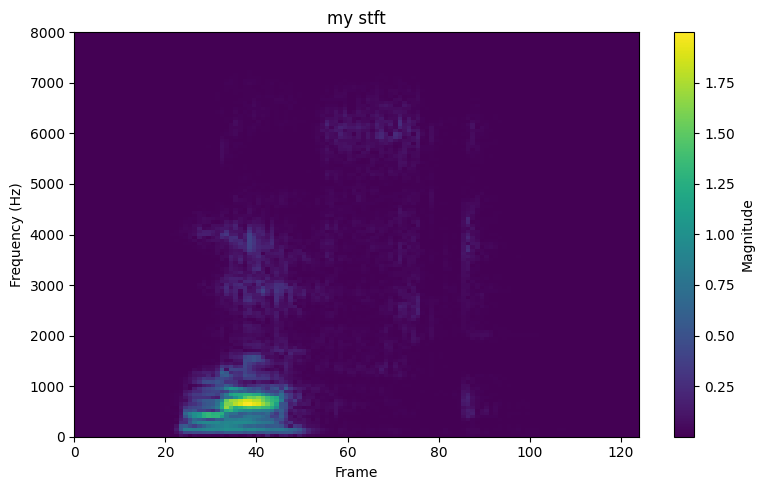

(1, 124, 129, 1)
File: e7ea8b76_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 0.9621212121212122


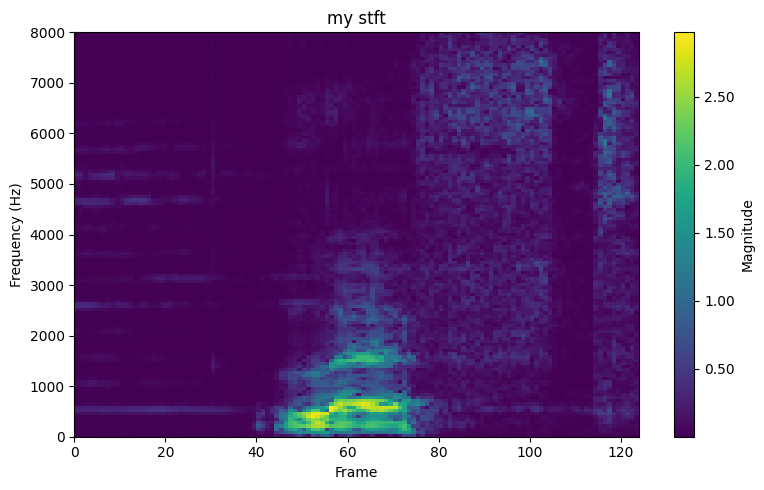

(1, 124, 129, 1)
File: be7a5b2d_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9624060150375939


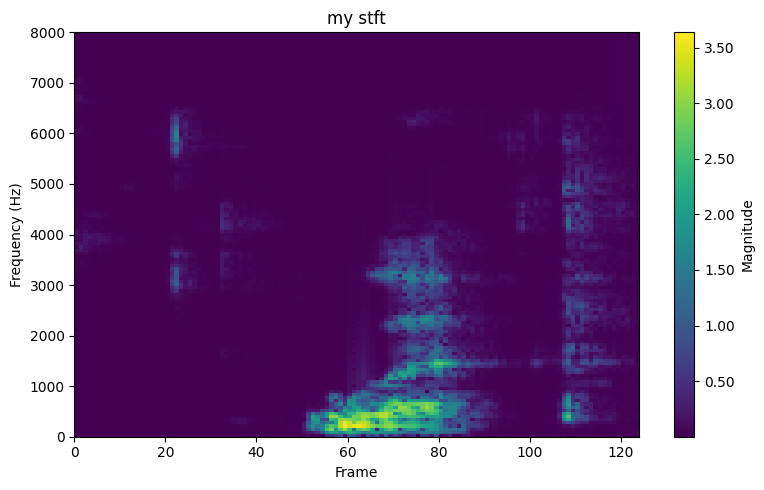

(1, 124, 129, 1)
File: e5e54cee_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9626865671641791


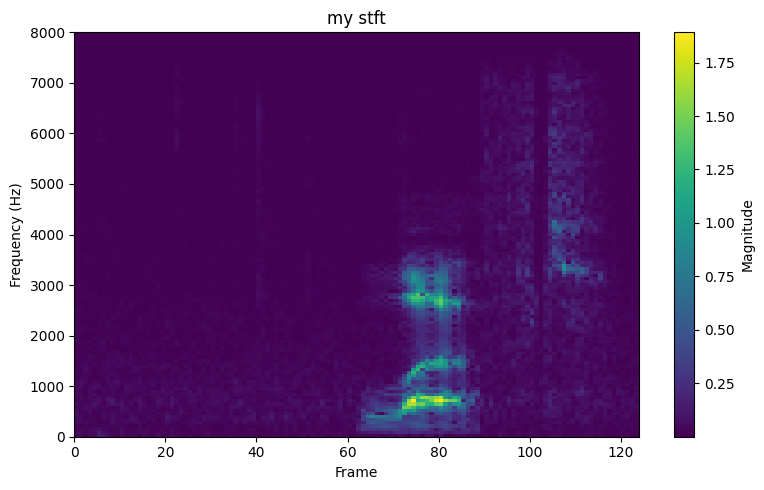

(1, 124, 129, 1)
File: eb76bc68_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9629629629629629


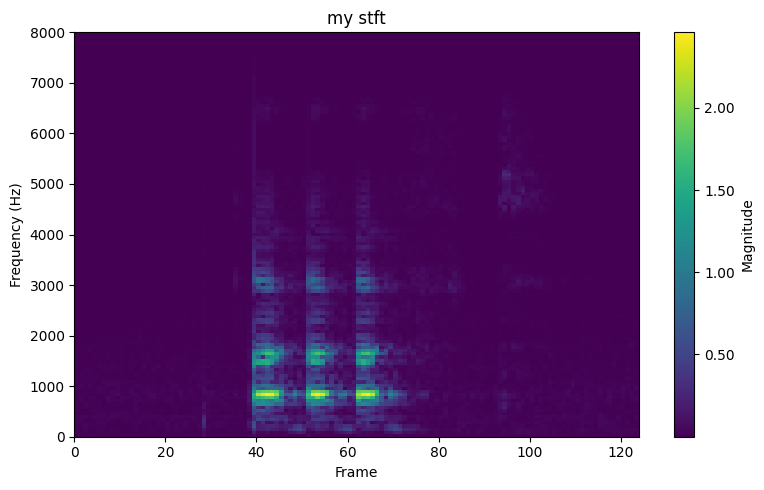

(1, 124, 129, 1)
File: d0426d63_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9632352941176471


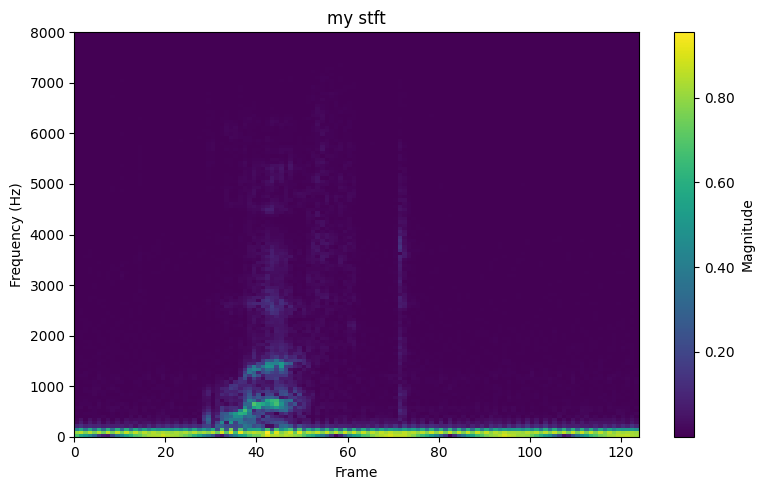

(1, 124, 129, 1)
File: f816db77_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9635036496350365


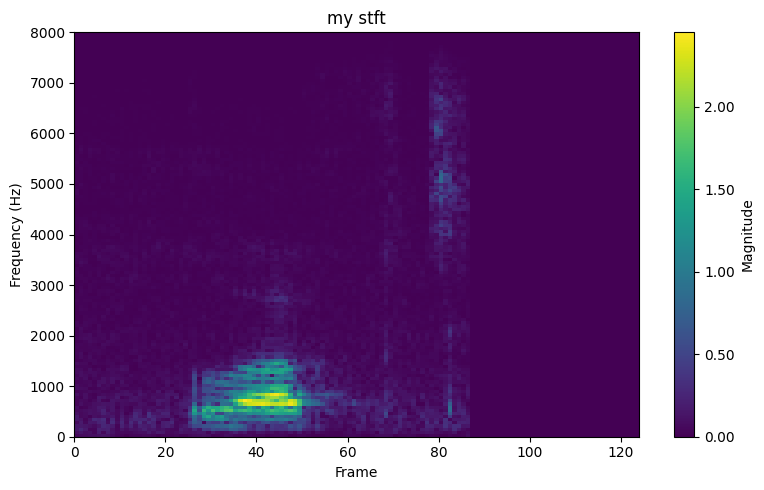

(1, 124, 129, 1)
File: 1a4259c3_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9637681159420289


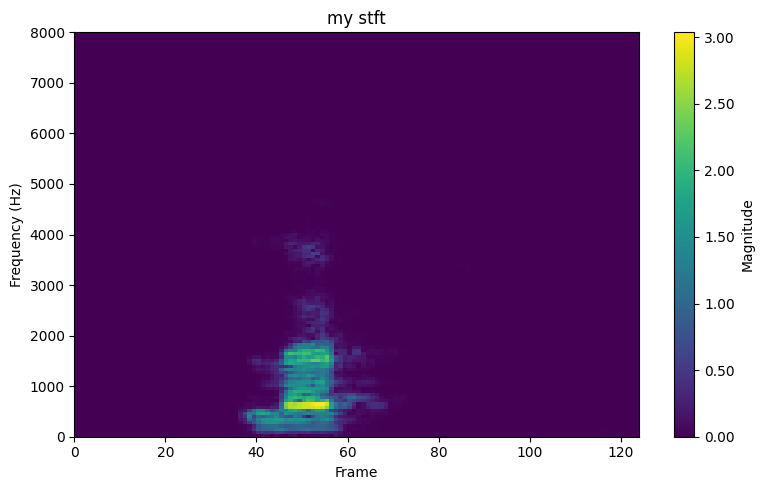

(1, 124, 129, 1)
File: 5fadb538_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9640287769784173


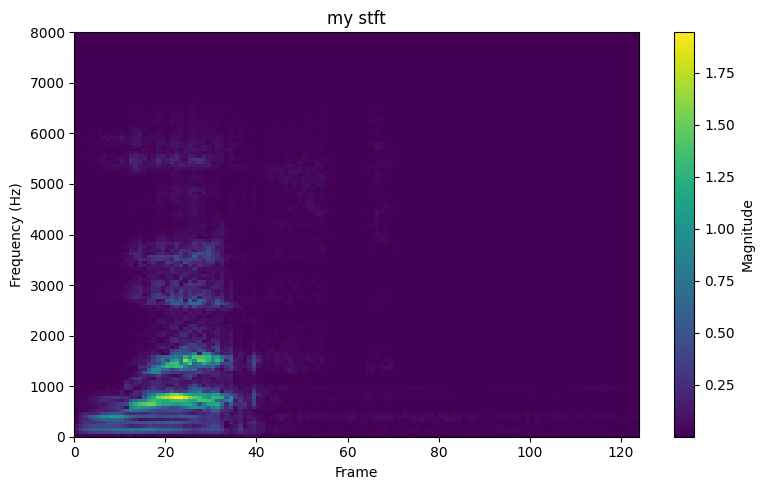

(1, 124, 129, 1)
File: c5570933_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9642857142857143


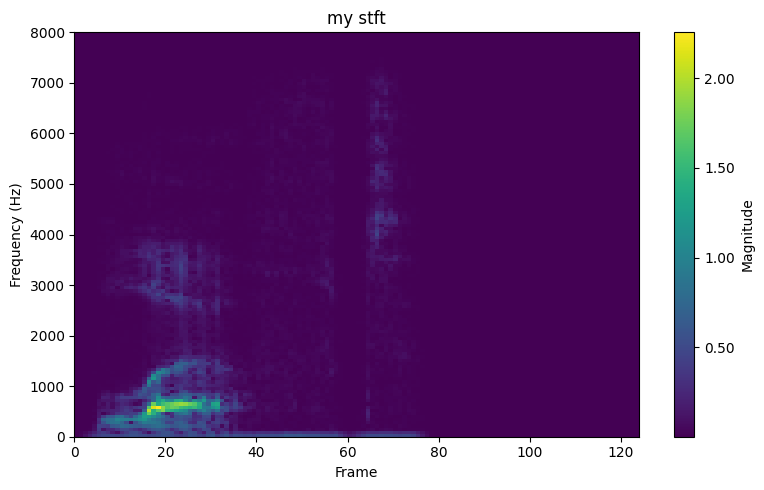

(1, 124, 129, 1)
File: 6b889021_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9645390070921985


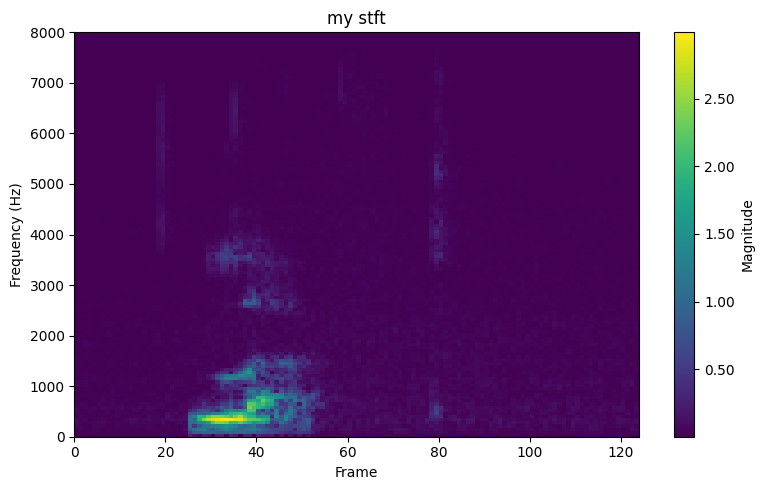

(1, 124, 129, 1)
File: 9c06a3f3_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9647887323943662


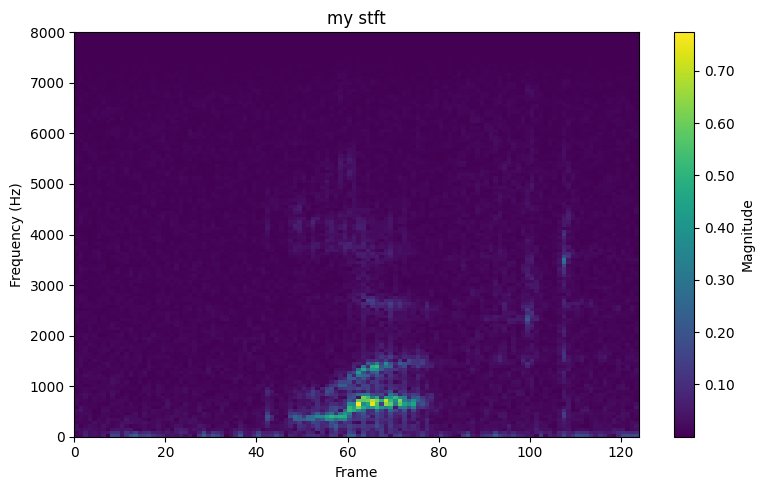

(1, 124, 129, 1)
File: 44b5720d_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.965034965034965


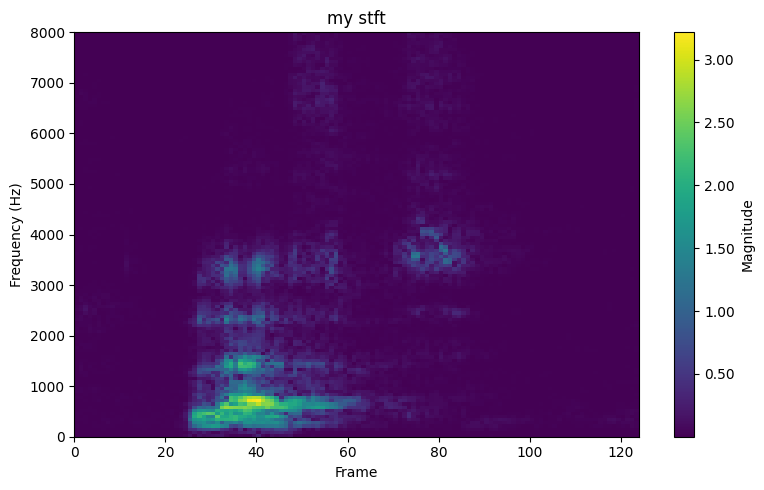

(1, 124, 129, 1)
File: 35d1b6ee_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9652777777777778


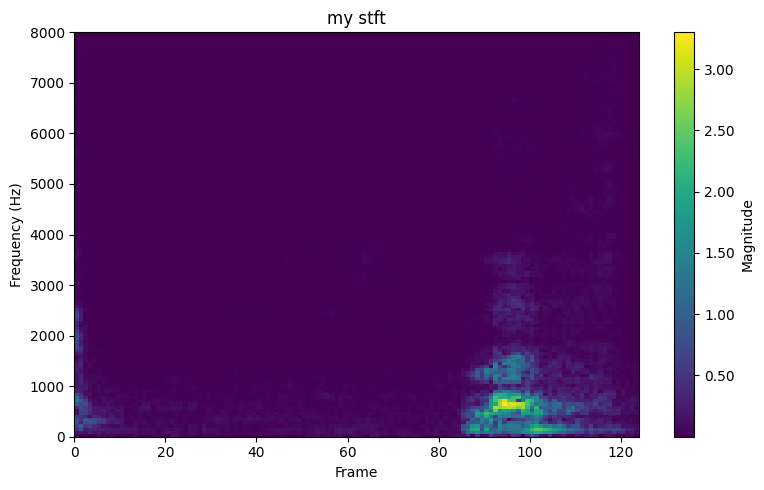

(1, 124, 129, 1)
File: d0faf7e4_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9655172413793104


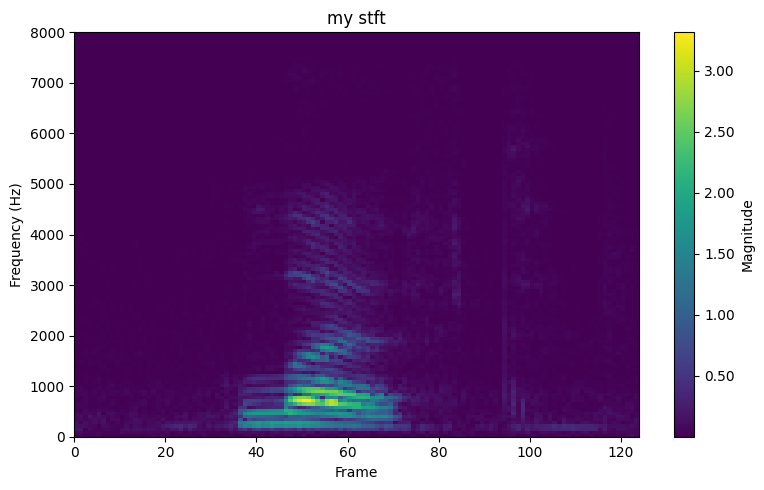

(1, 124, 129, 1)
File: 93ec8b84_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9657534246575342


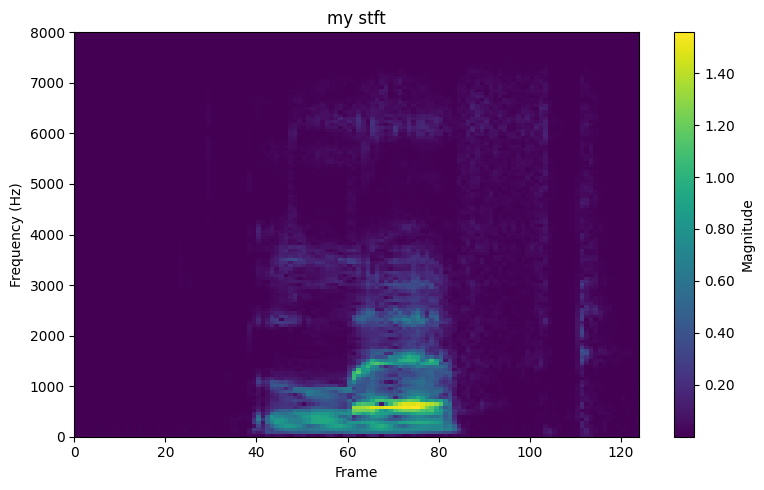

(1, 124, 129, 1)
File: 8335f893_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9659863945578231


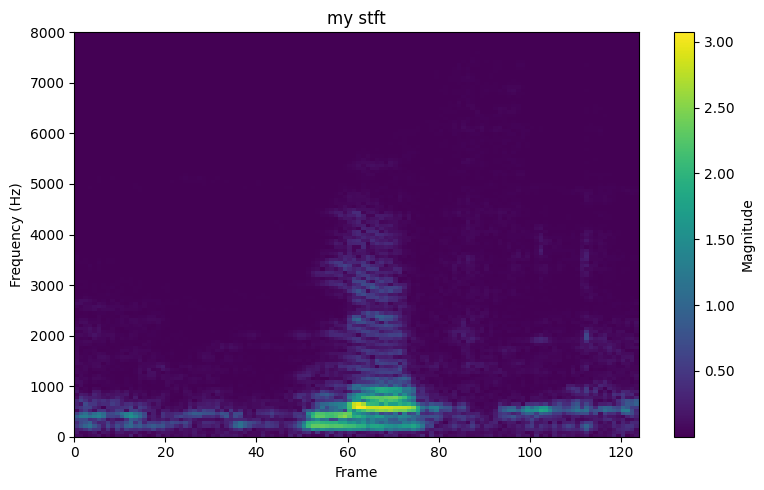

(1, 124, 129, 1)
File: 9886d8bf_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9662162162162162


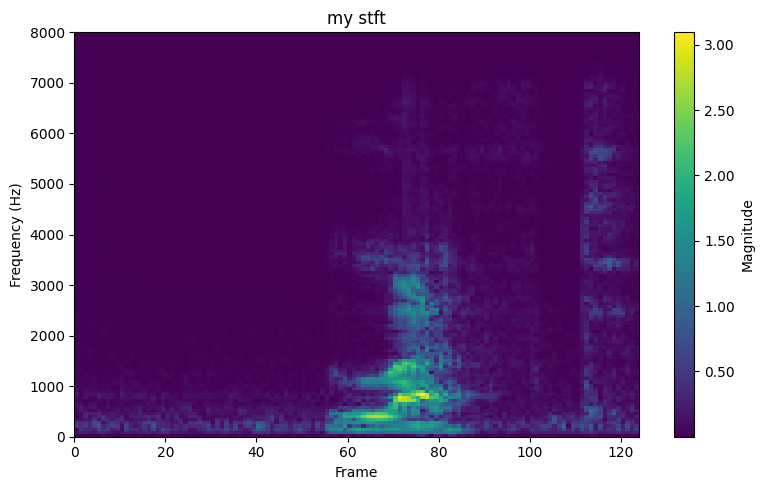

(1, 124, 129, 1)
File: 2aec99ec_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9664429530201343


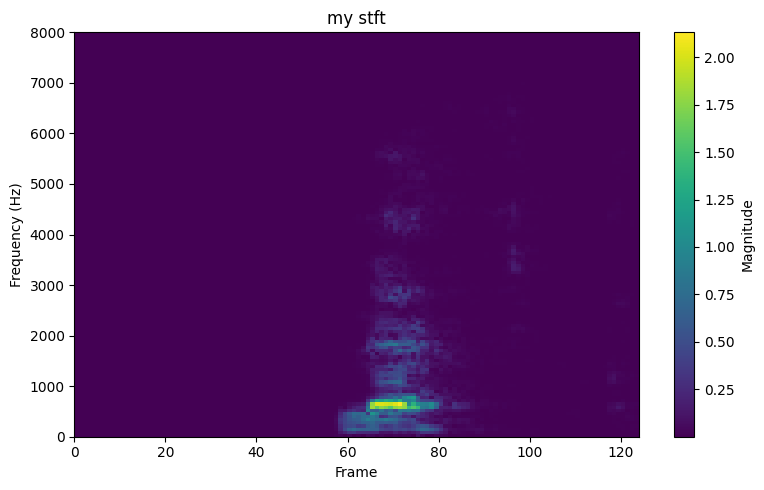

(1, 124, 129, 1)
File: 0132a06d_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9666666666666667


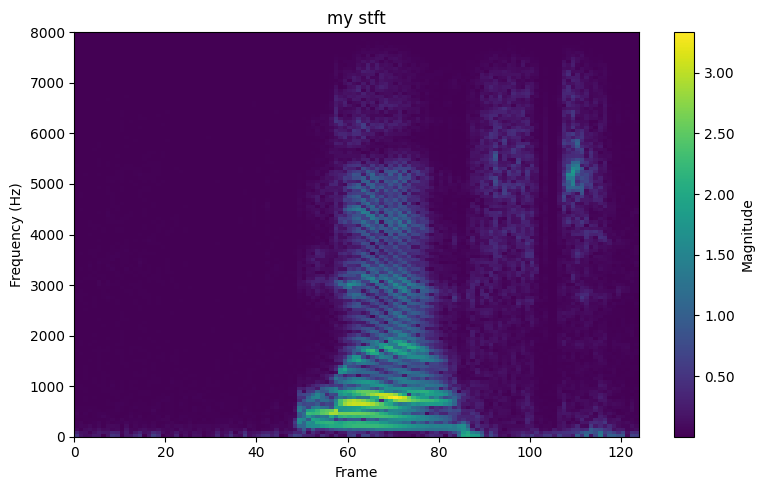

(1, 124, 129, 1)
File: 3ae5c04f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9668874172185431


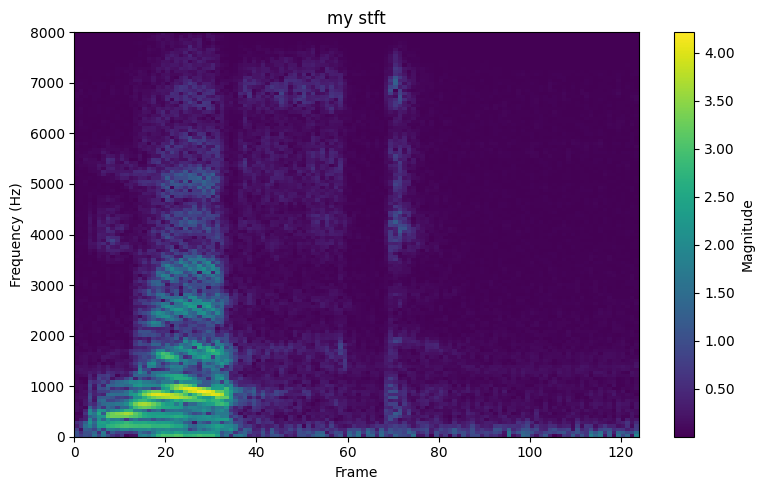

(1, 124, 129, 1)
File: 6823565f_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9671052631578947


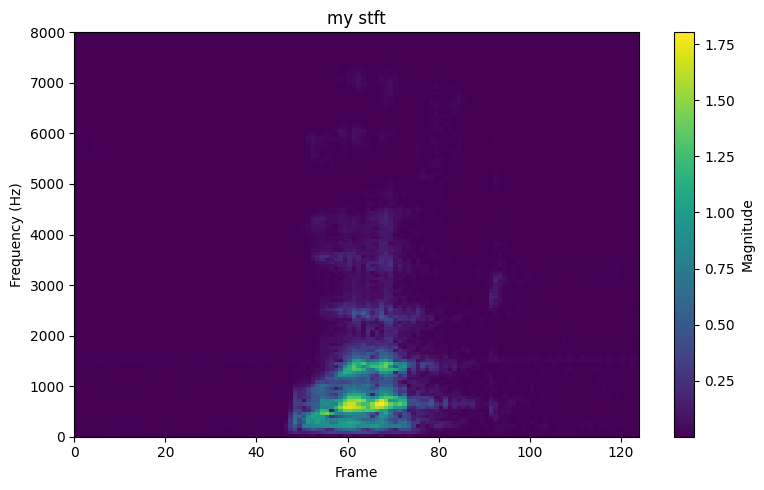

(1, 124, 129, 1)
File: 76e53db9_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9673202614379085


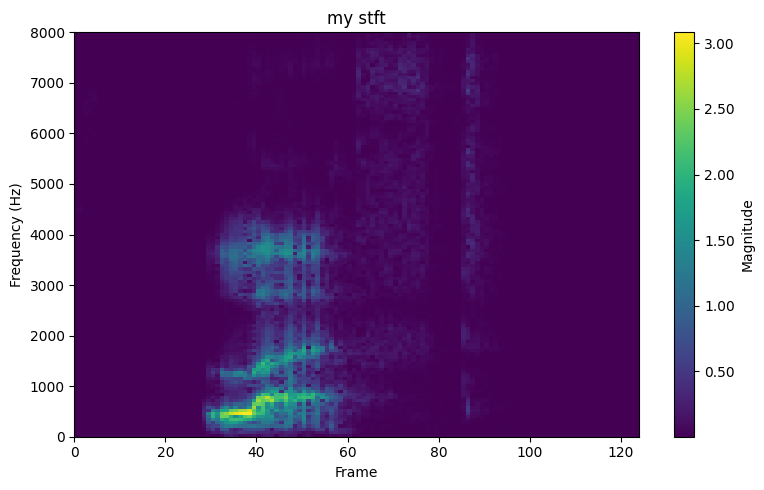

(1, 124, 129, 1)
File: cb8f8307_nohash_6.wav, True label: left, Predicted label: left

Accuracy: 0.9675324675324676


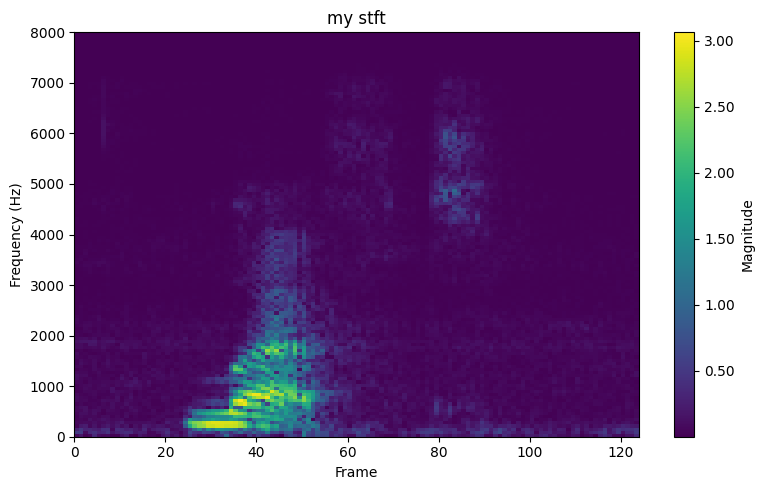

(1, 124, 129, 1)
File: e900b652_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.967741935483871


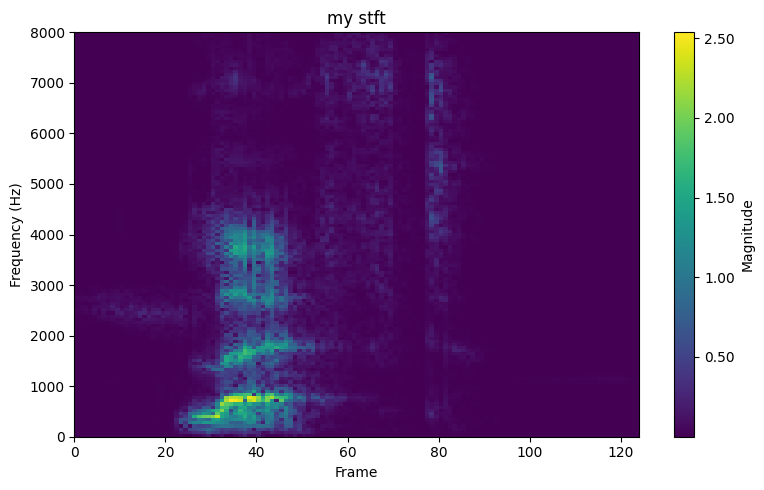

(1, 124, 129, 1)
File: cb8f8307_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 0.967948717948718


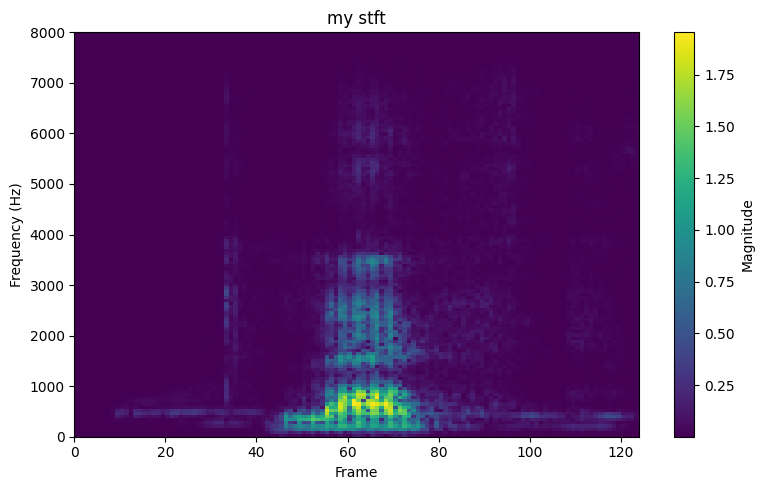

(1, 124, 129, 1)
File: 2da58b32_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9681528662420382


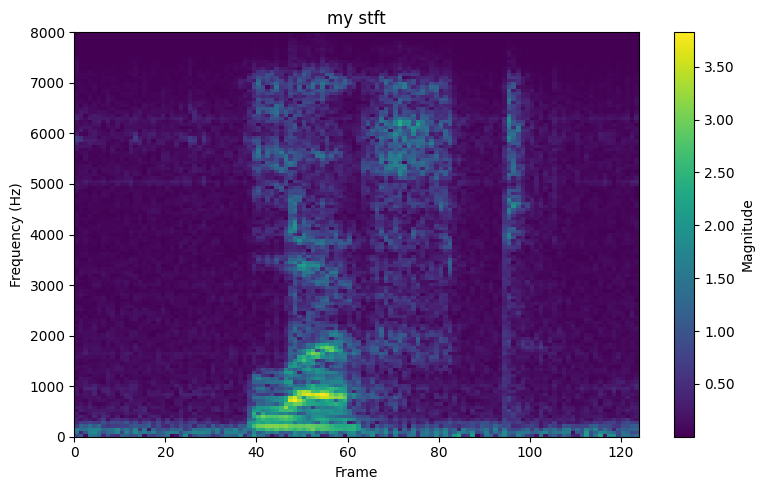

(1, 124, 129, 1)
File: 5165cf0a_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9683544303797469


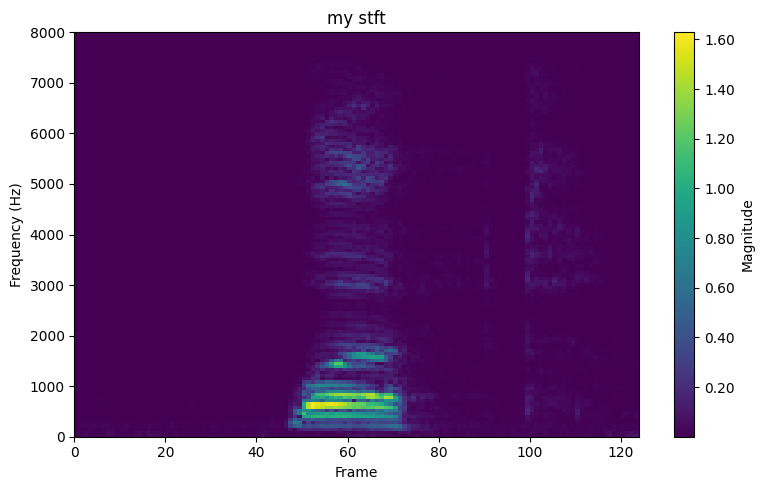

(1, 124, 129, 1)
File: 1a6eca98_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9685534591194969


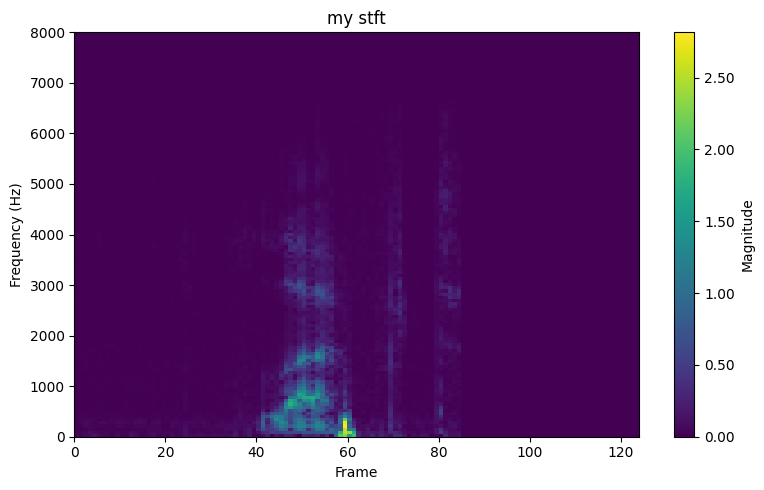

(1, 124, 129, 1)
File: 33903159_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.96875


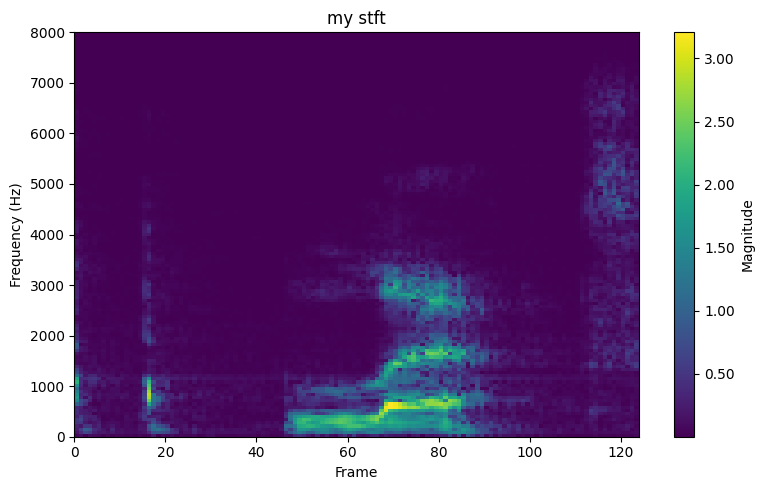

(1, 124, 129, 1)
File: f864cd4a_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.968944099378882


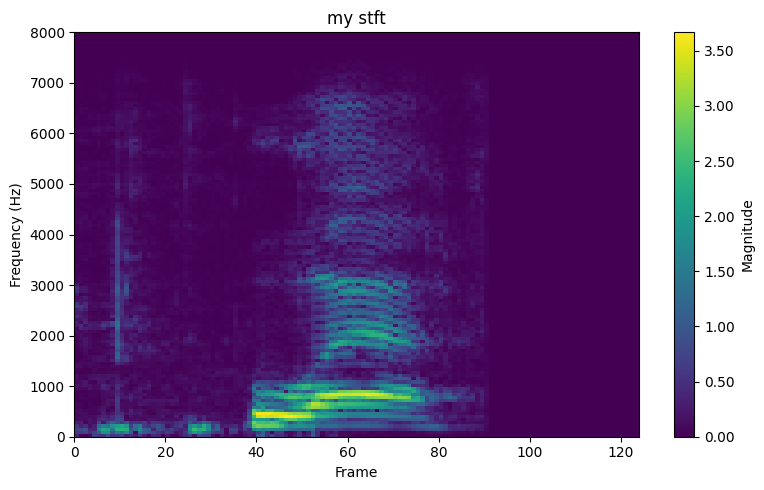

(1, 124, 129, 1)
File: 8d4cdc60_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9691358024691358


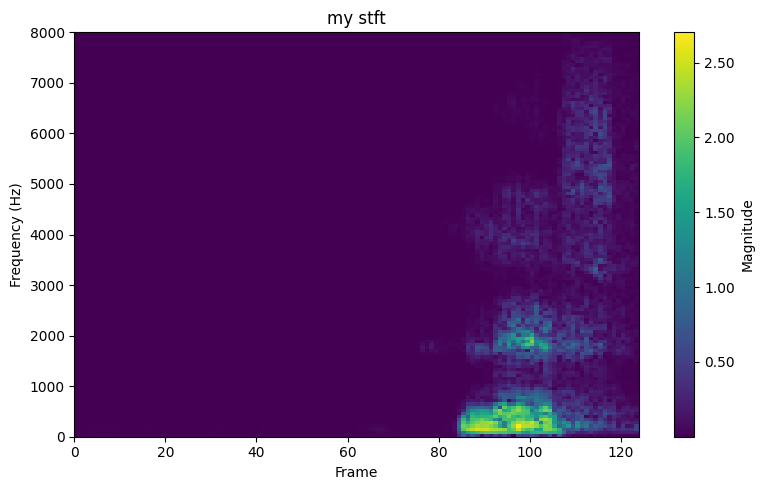

(1, 124, 129, 1)
File: 264f471d_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9693251533742331


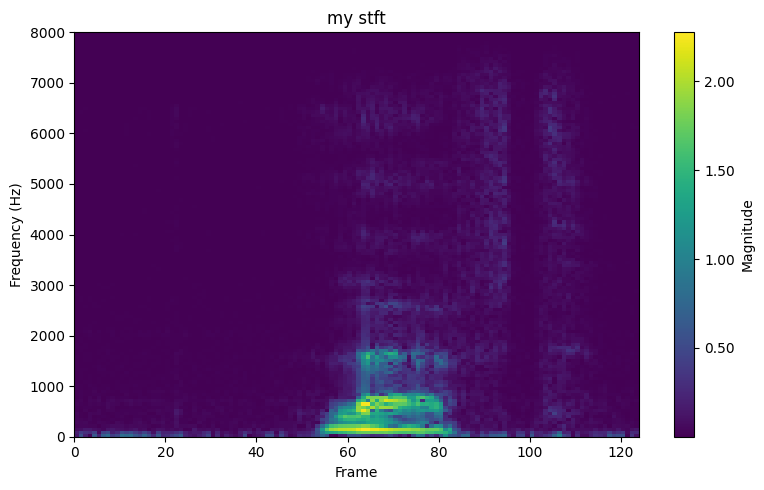

(1, 124, 129, 1)
File: 48a8a69d_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9695121951219512


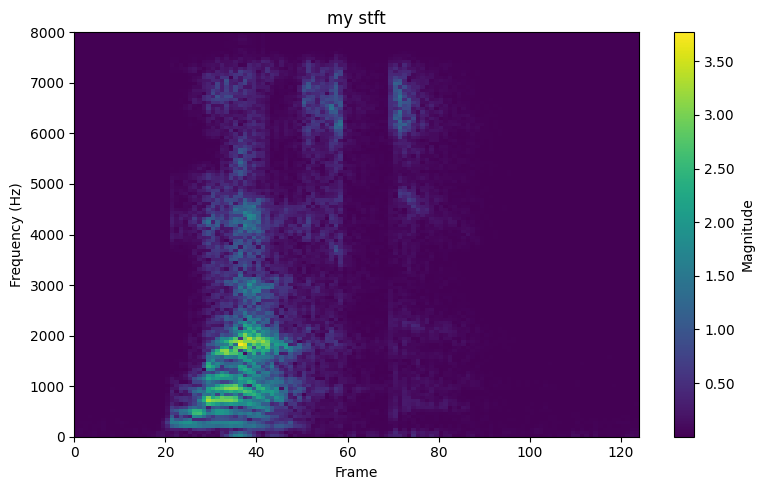

(1, 124, 129, 1)
File: 7cbf645a_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9696969696969697


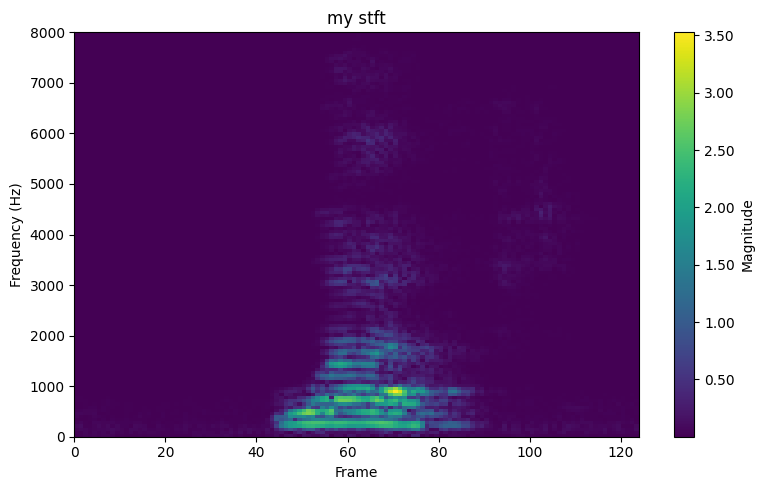

(1, 124, 129, 1)
File: 7846fd85_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9698795180722891


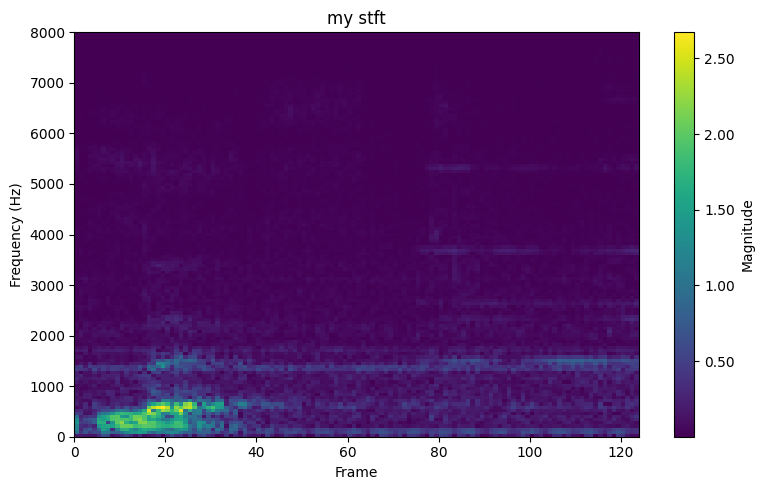

(1, 124, 129, 1)
File: 9229bff9_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9700598802395209


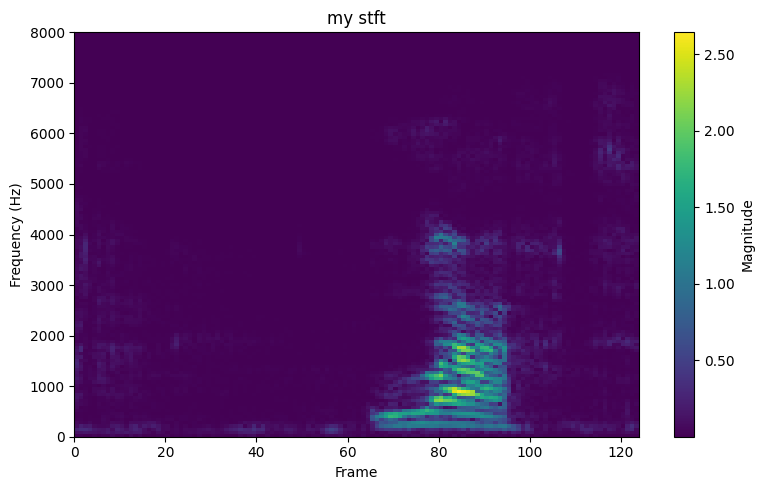

(1, 124, 129, 1)
File: 6f2c6f7e_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9702380952380952


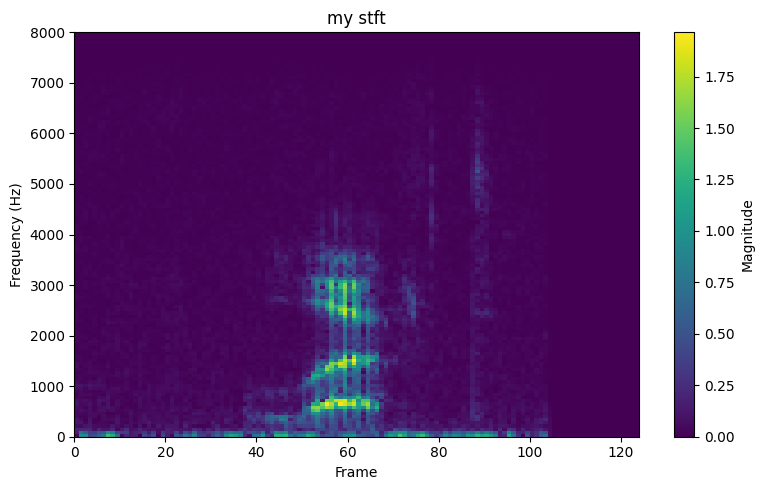

(1, 124, 129, 1)
File: a2473d62_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9704142011834319


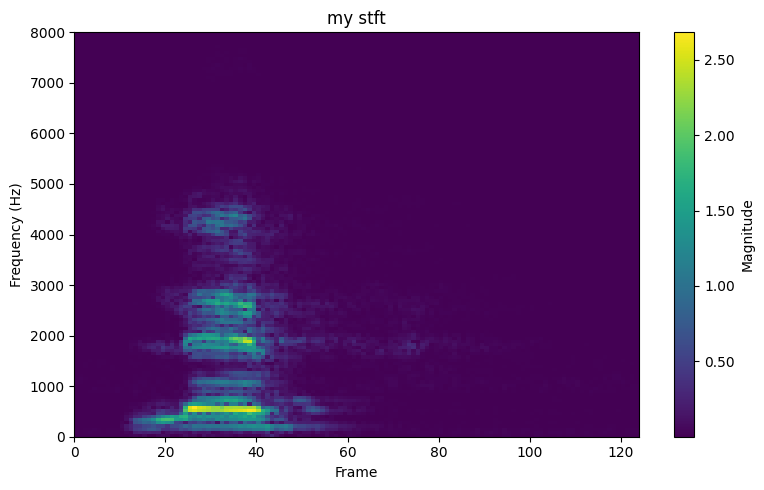

(1, 124, 129, 1)
File: ffa76c4a_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9705882352941176


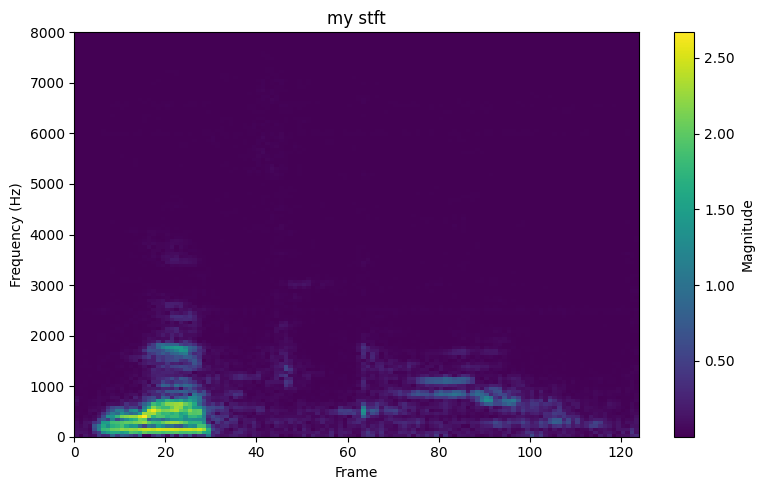

(1, 124, 129, 1)
File: 8134f43f_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9707602339181286


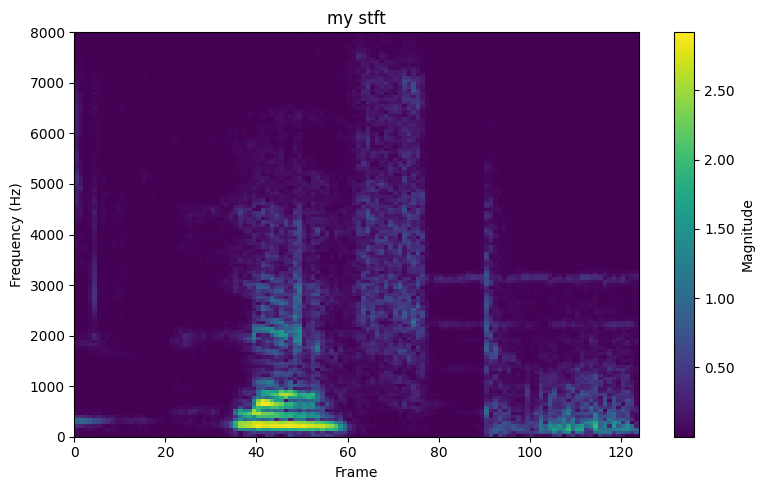

(1, 124, 129, 1)
File: 97f4c236_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9709302325581395


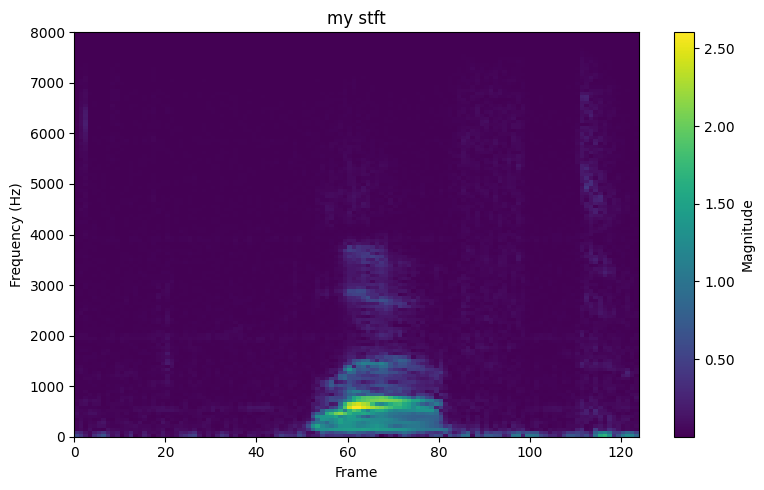

(1, 124, 129, 1)
File: 05739450_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9710982658959537


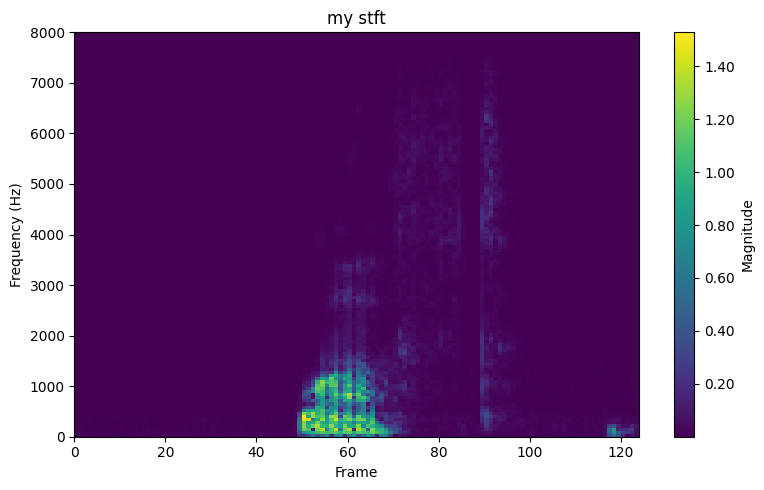

(1, 124, 129, 1)
File: 9ab86dd0_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9712643678160919


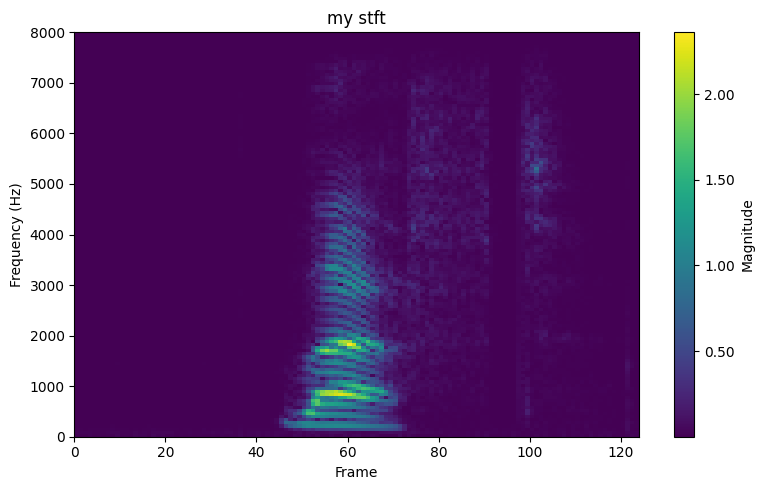

(1, 124, 129, 1)
File: 9d8ac38b_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9714285714285714


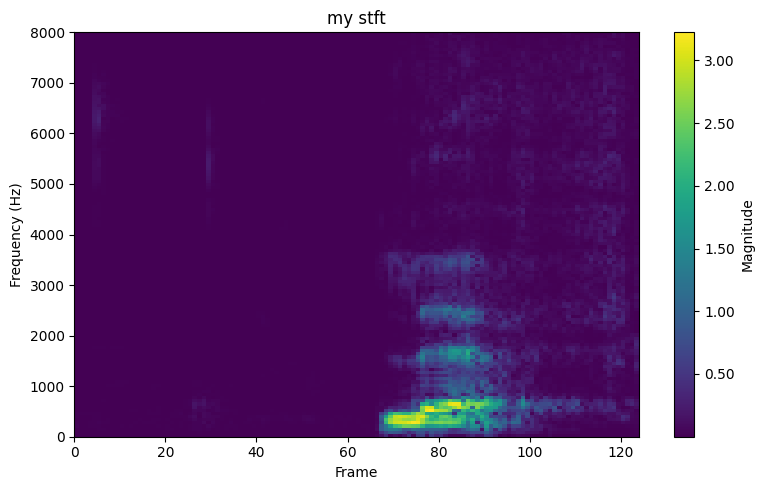

(1, 124, 129, 1)
File: bab36420_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9715909090909091


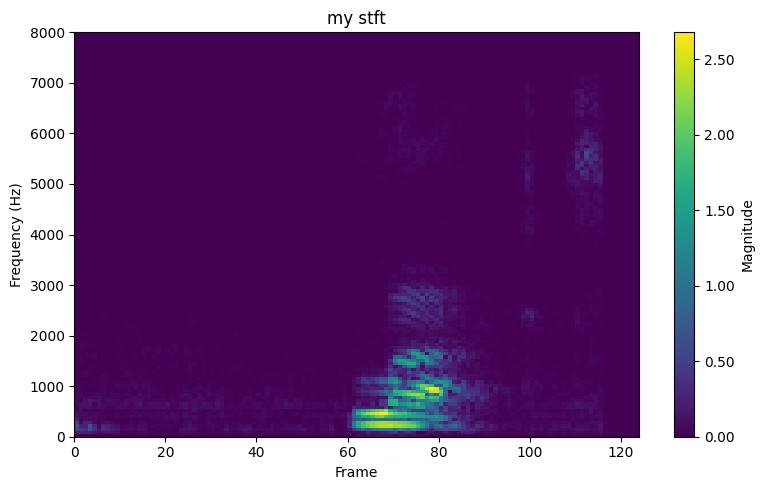

(1, 124, 129, 1)
File: 69086eb0_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9717514124293786


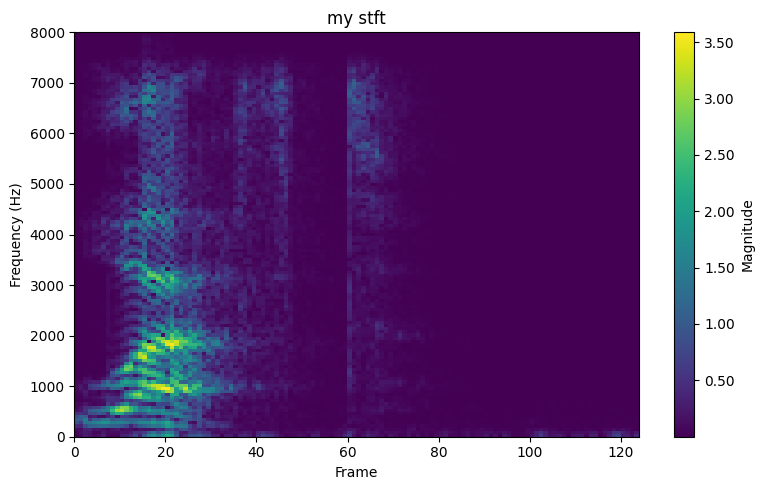

(1, 124, 129, 1)
File: 7cbf645a_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9719101123595506


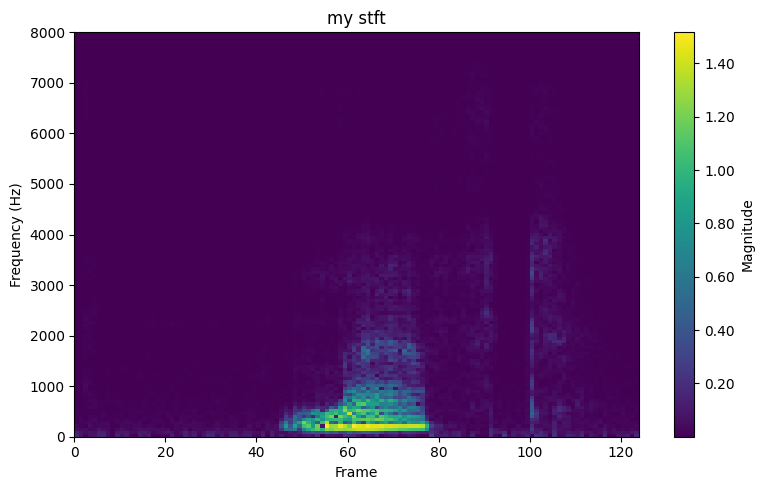

(1, 124, 129, 1)
File: f292725f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9720670391061452


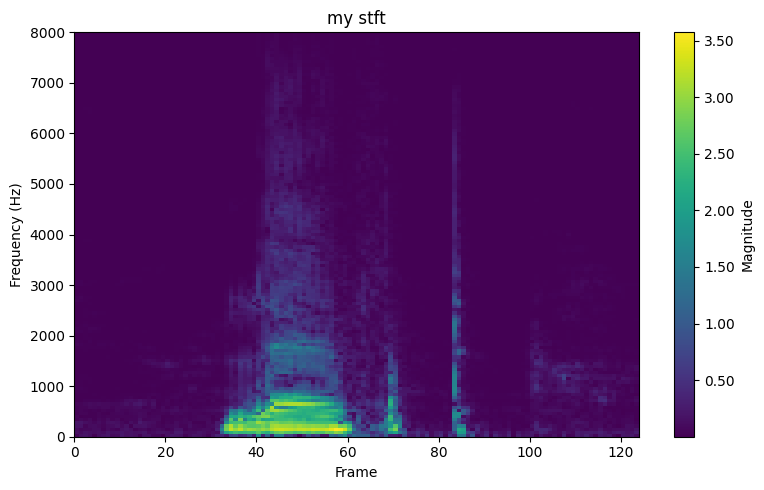

(1, 124, 129, 1)
File: 5b09db89_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9722222222222222


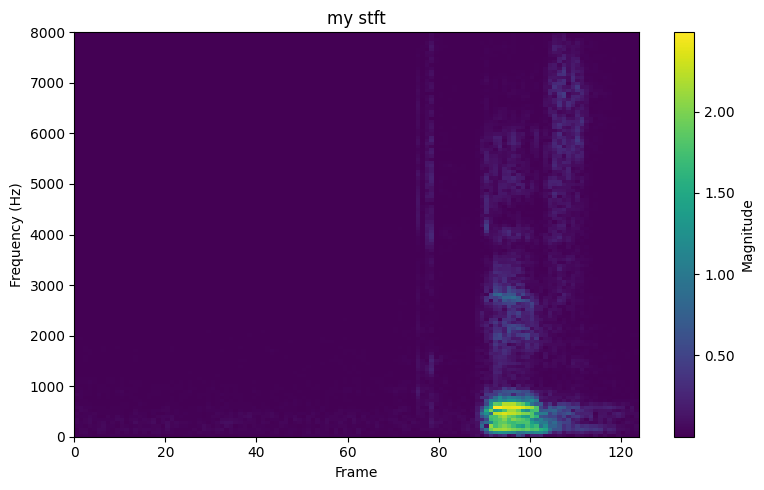

(1, 124, 129, 1)
File: b9f46737_nohash_2.wav, True label: left, Predicted label: yes

Accuracy: 0.9668508287292817


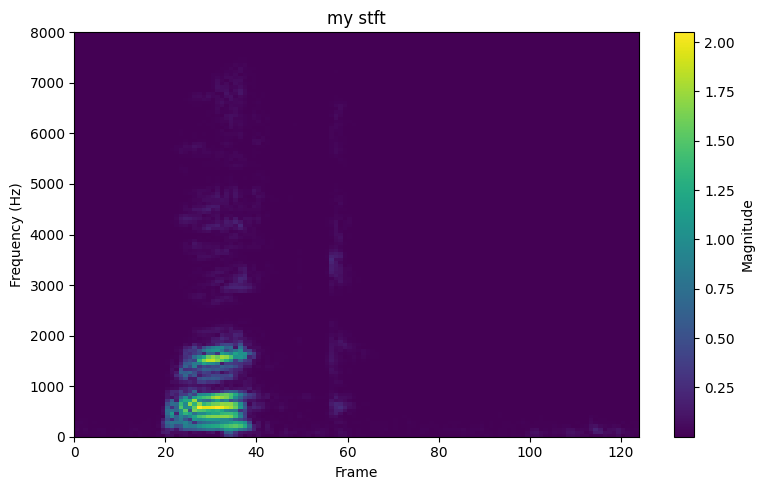

(1, 124, 129, 1)
File: 65040d9b_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.967032967032967


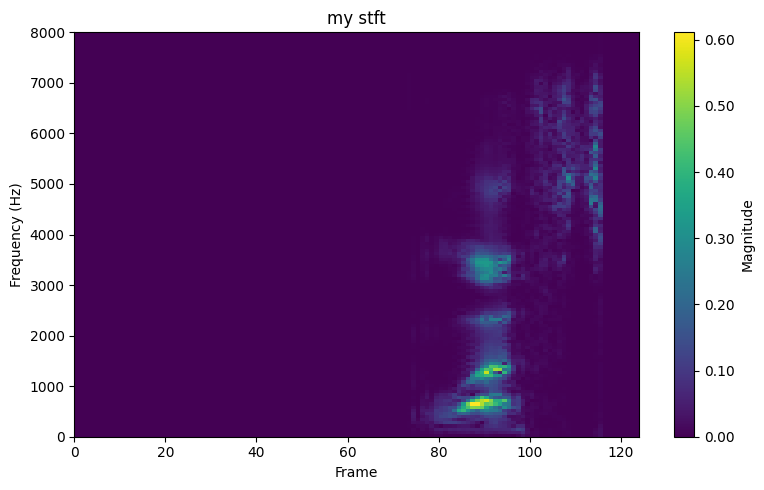

(1, 124, 129, 1)
File: 126403d4_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9672131147540983


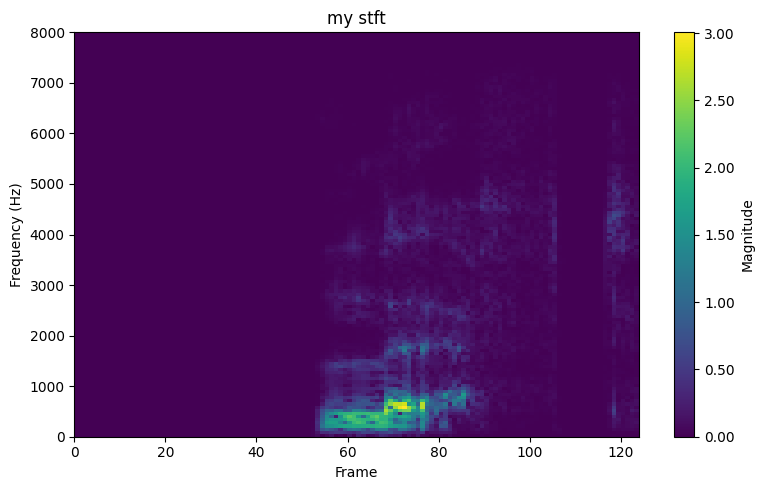

(1, 124, 129, 1)
File: 9db2bfe9_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.967391304347826


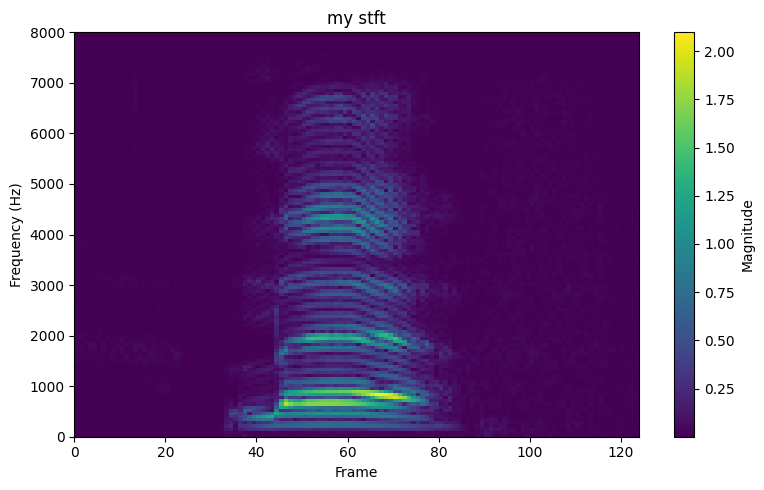

(1, 124, 129, 1)
File: 15f04ff8_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9675675675675676


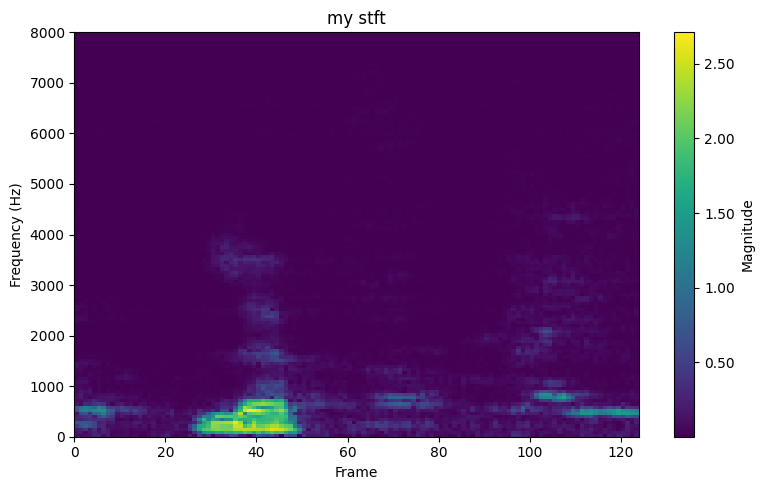

(1, 124, 129, 1)
File: 8134f43f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.967741935483871


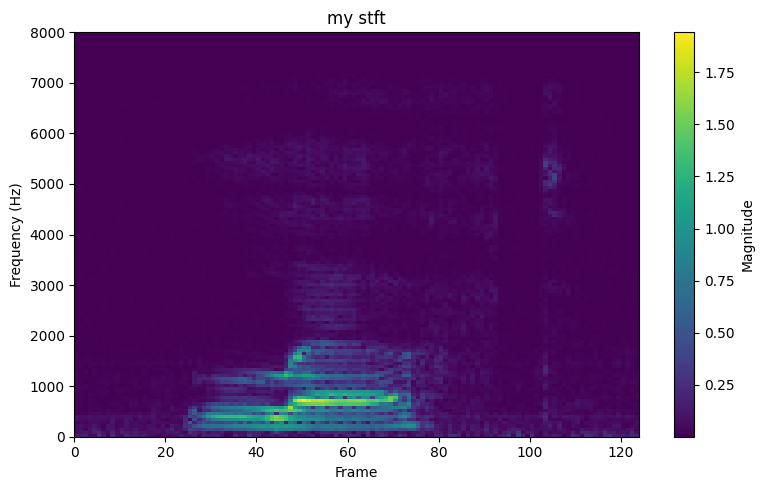

(1, 124, 129, 1)
File: 1887fe04_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9679144385026738


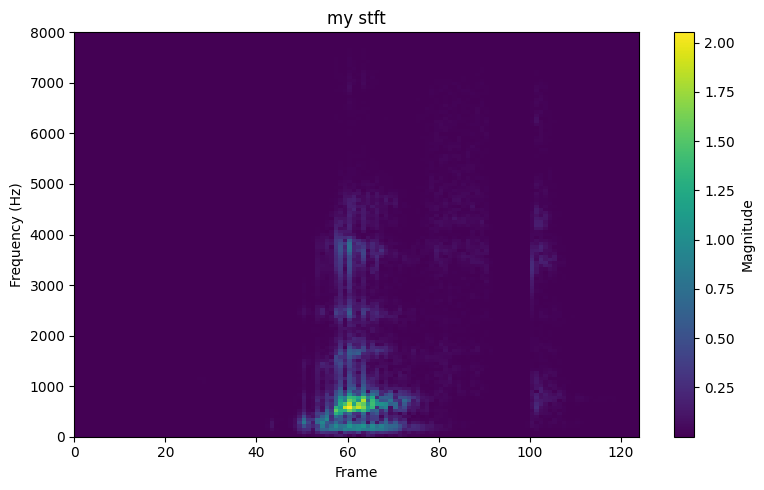

(1, 124, 129, 1)
File: b9515bf3_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9680851063829787


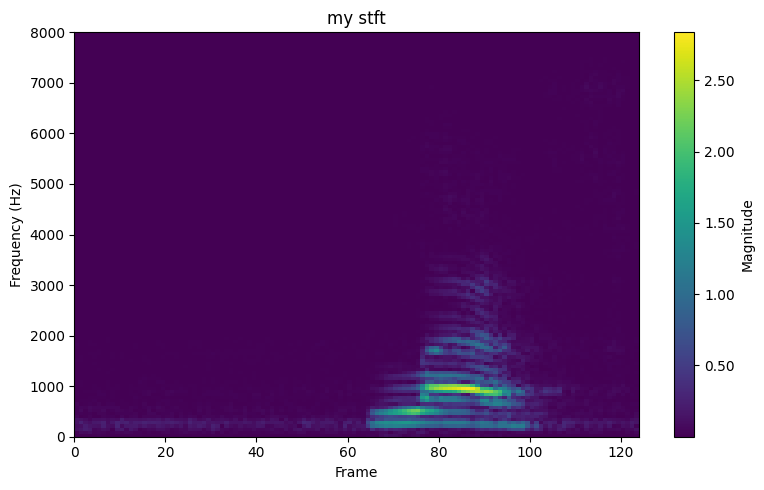

(1, 124, 129, 1)
File: aac5b7c1_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9682539682539683


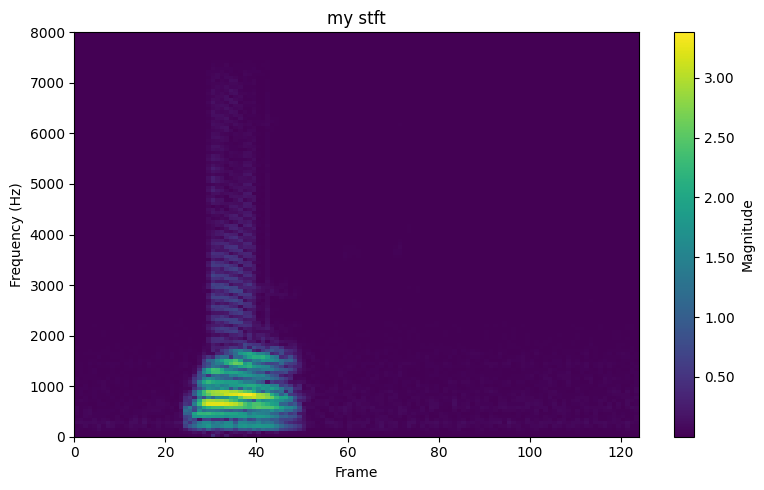

(1, 124, 129, 1)
File: 4620dc14_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.968421052631579


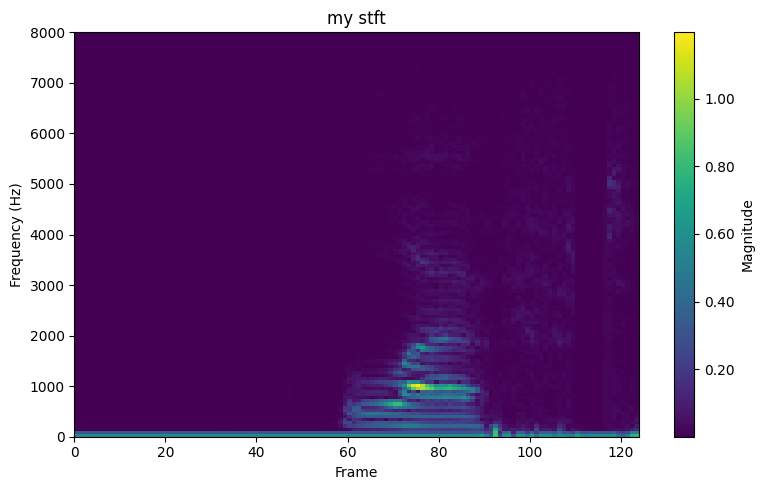

(1, 124, 129, 1)
File: 1c1060b1_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9685863874345549


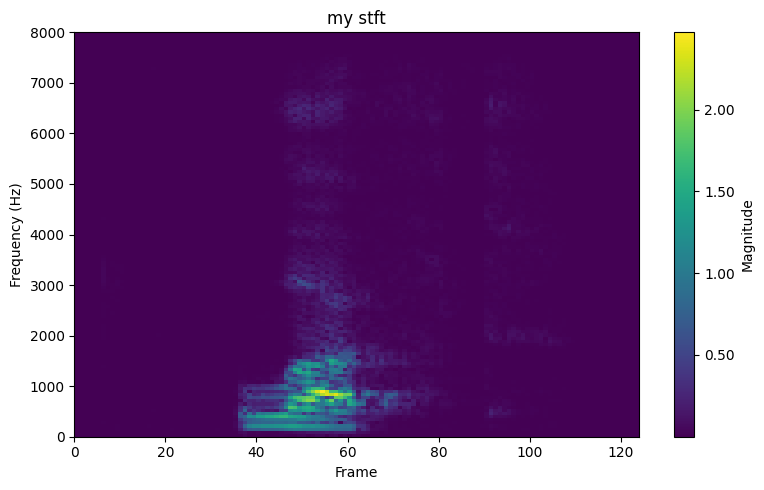

(1, 124, 129, 1)
File: caedb73a_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.96875


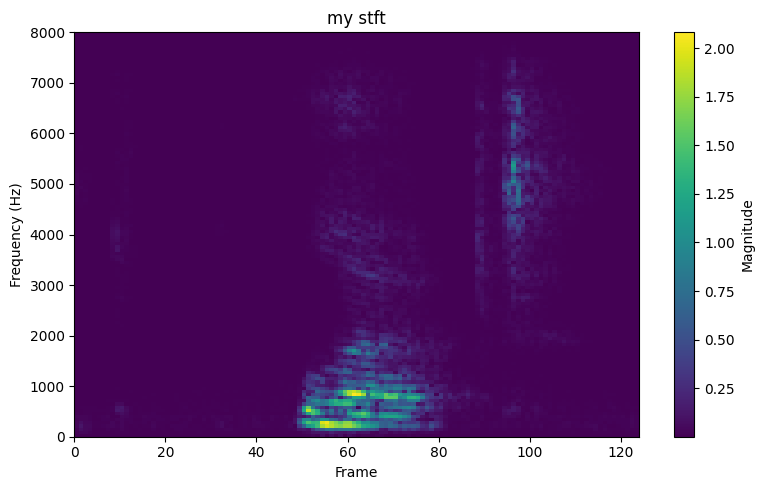

(1, 124, 129, 1)
File: bfaf2000_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9689119170984456


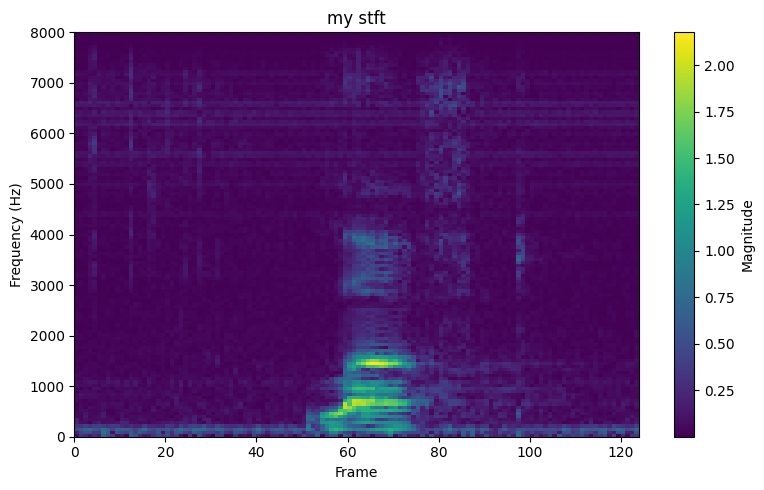

(1, 124, 129, 1)
File: 152491bc_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9690721649484536


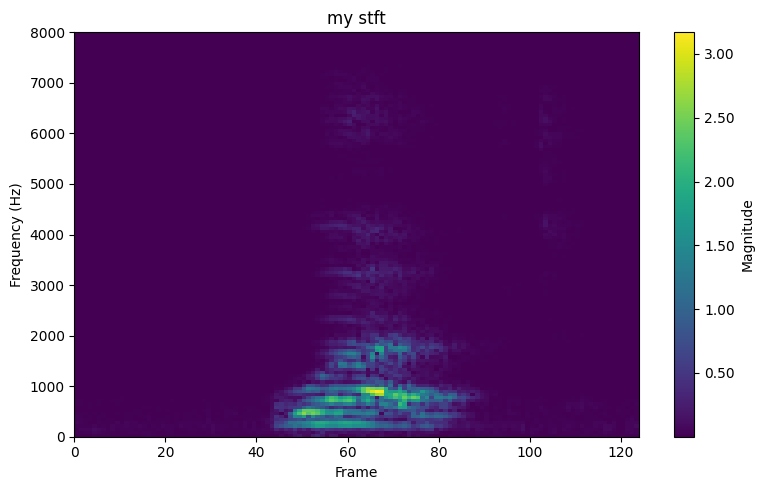

(1, 124, 129, 1)
File: 7846fd85_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9692307692307692


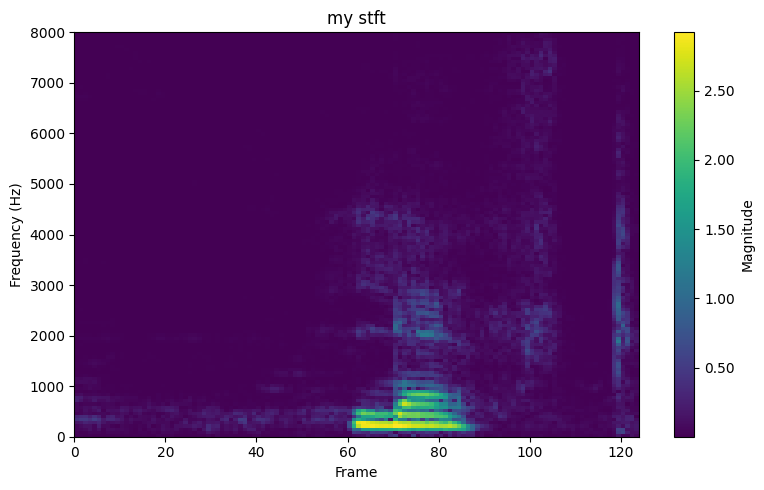

(1, 124, 129, 1)
File: 97f4c236_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 0.9693877551020408


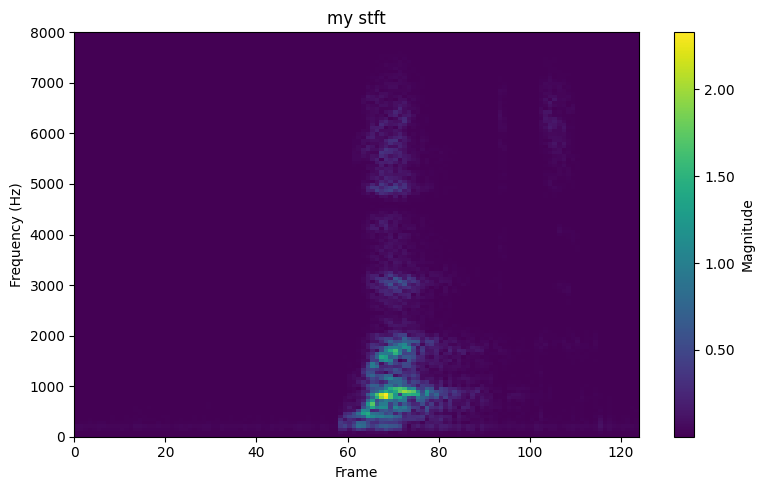

(1, 124, 129, 1)
File: 7de97453_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9695431472081218


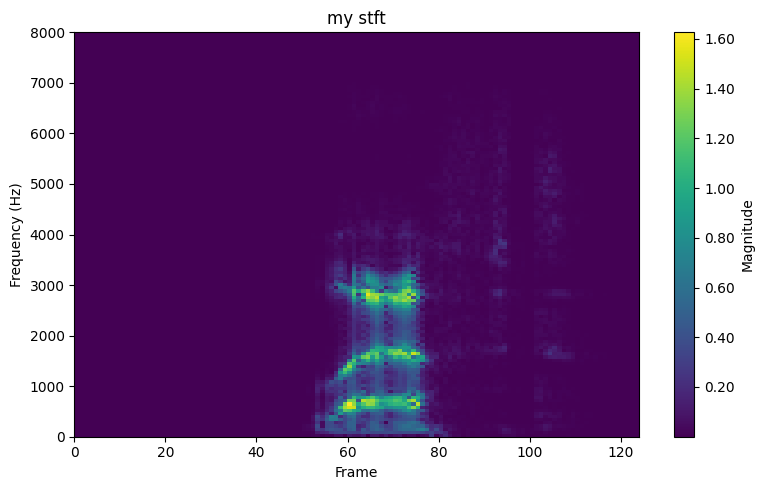

(1, 124, 129, 1)
File: 14872d06_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9696969696969697


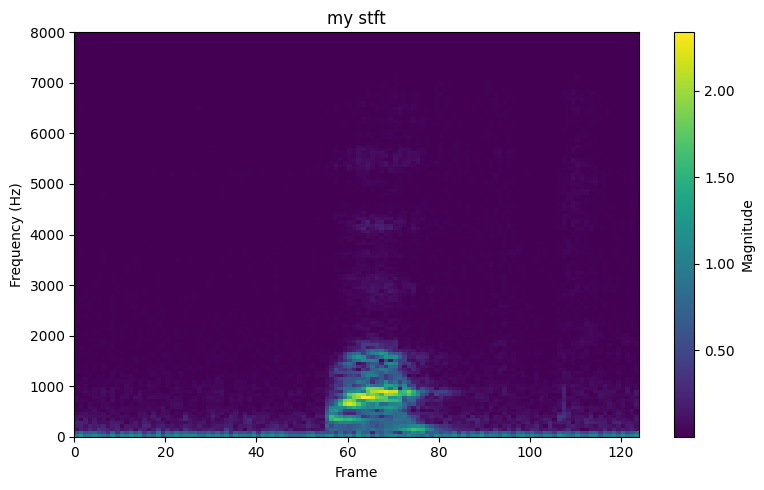

(1, 124, 129, 1)
File: aa753bb9_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9698492462311558


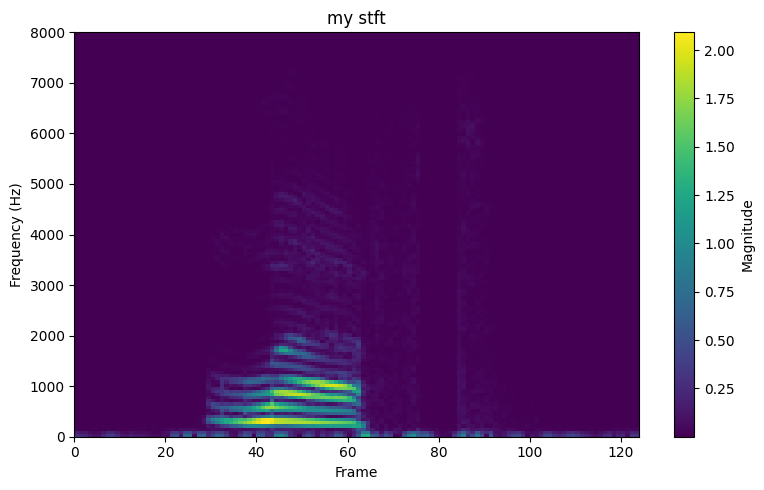

(1, 124, 129, 1)
File: e57abea3_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.97


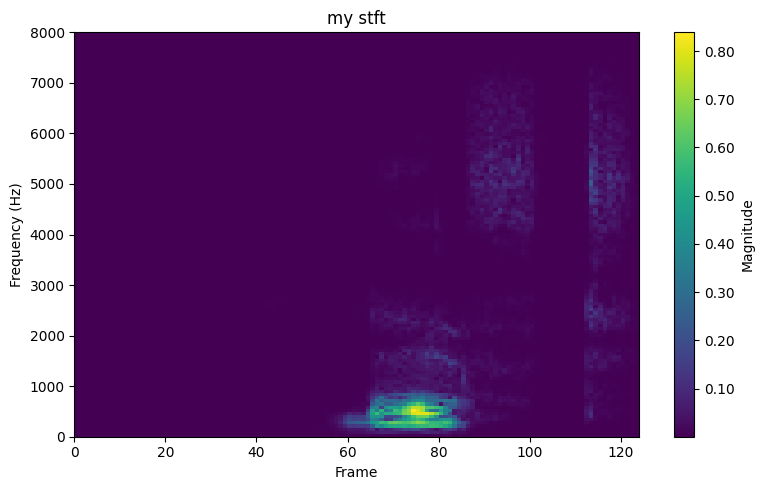

(1, 124, 129, 1)
File: 712e4d58_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9701492537313433


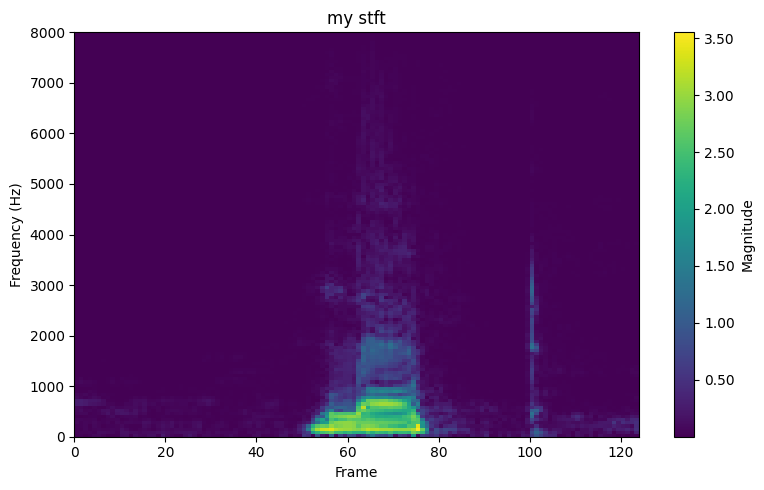

(1, 124, 129, 1)
File: 5b09db89_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 0.9702970297029703


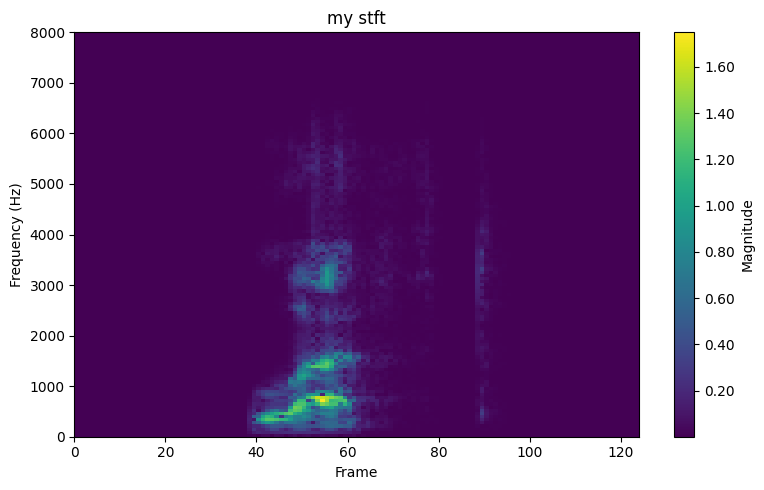

(1, 124, 129, 1)
File: 59fe87e6_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9704433497536946


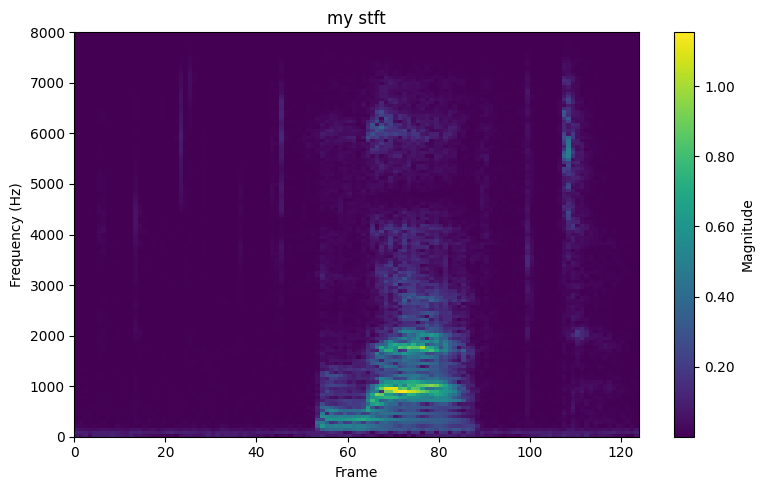

(1, 124, 129, 1)
File: 4ec7d027_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9705882352941176


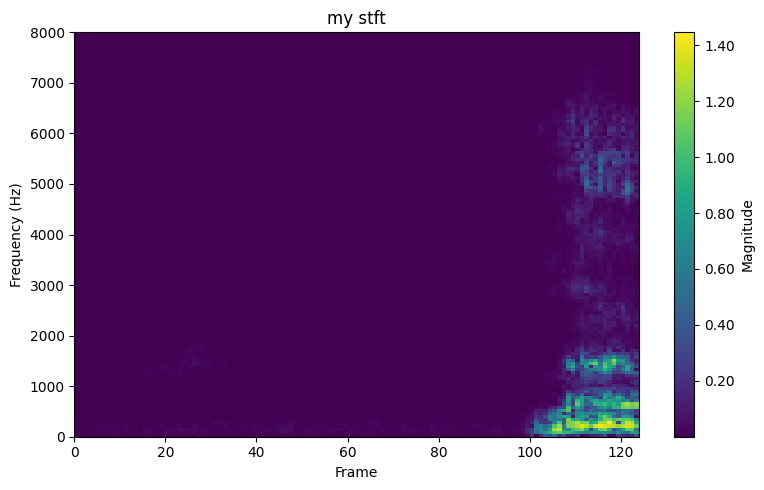

(1, 124, 129, 1)
File: a6d586b7_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9707317073170731


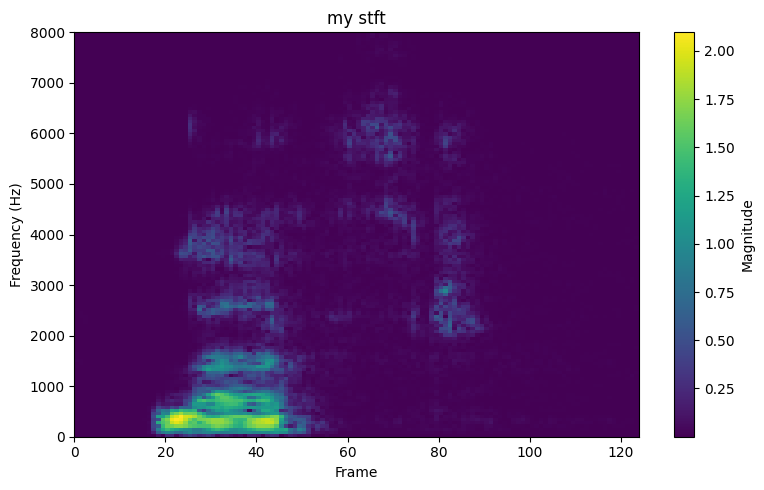

(1, 124, 129, 1)
File: aff582a1_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.970873786407767


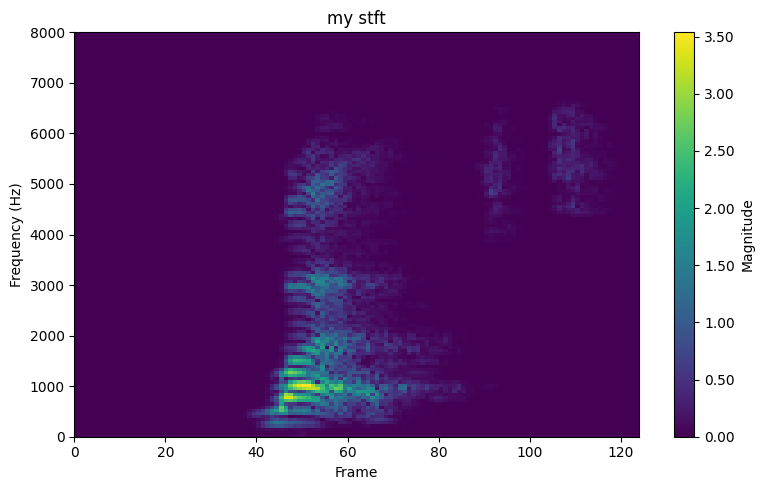

(1, 124, 129, 1)
File: d94eb94f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9710144927536232


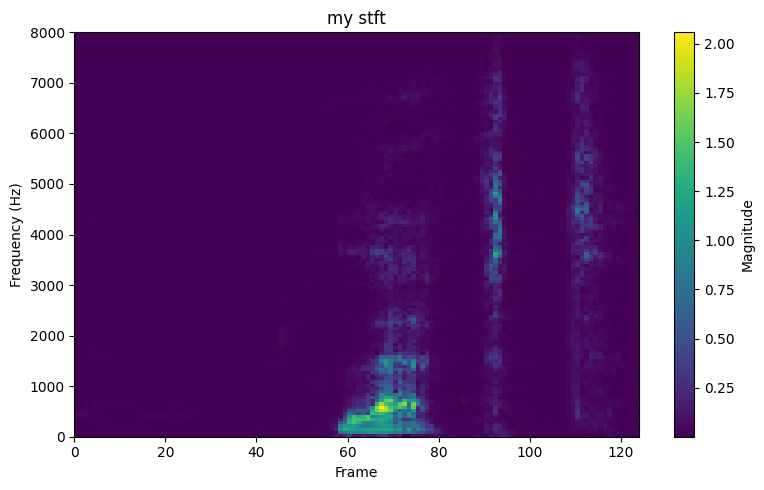

(1, 124, 129, 1)
File: c6ee87a7_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9711538461538461


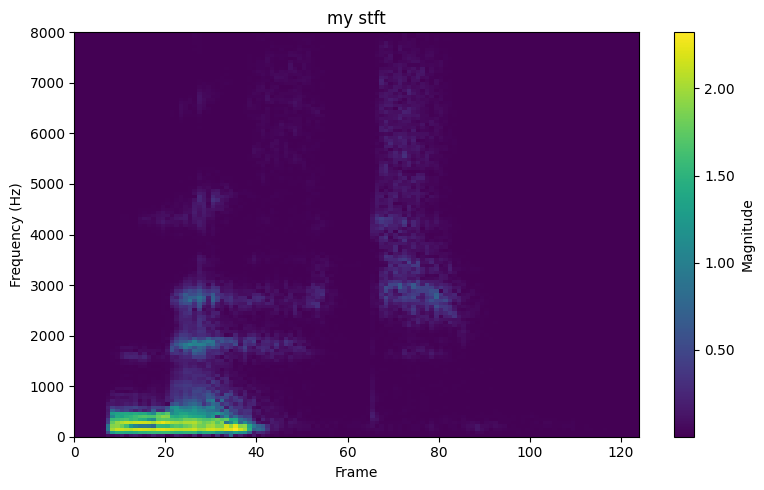

(1, 124, 129, 1)
File: 8012c69d_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9712918660287081


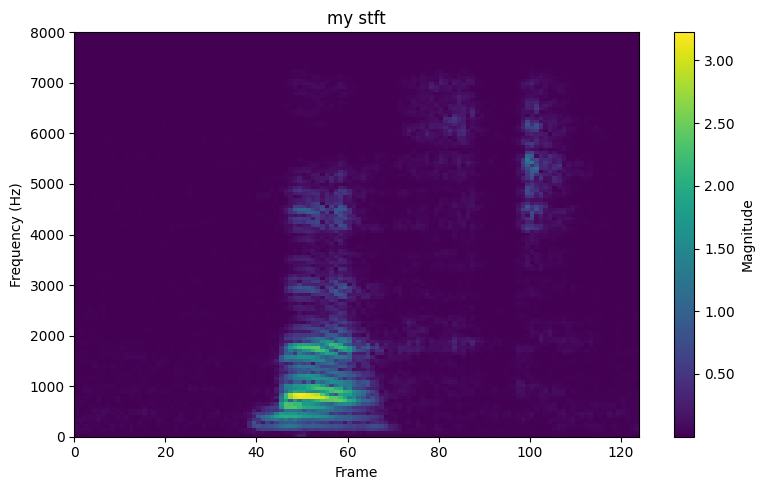

(1, 124, 129, 1)
File: ec545975_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9714285714285714


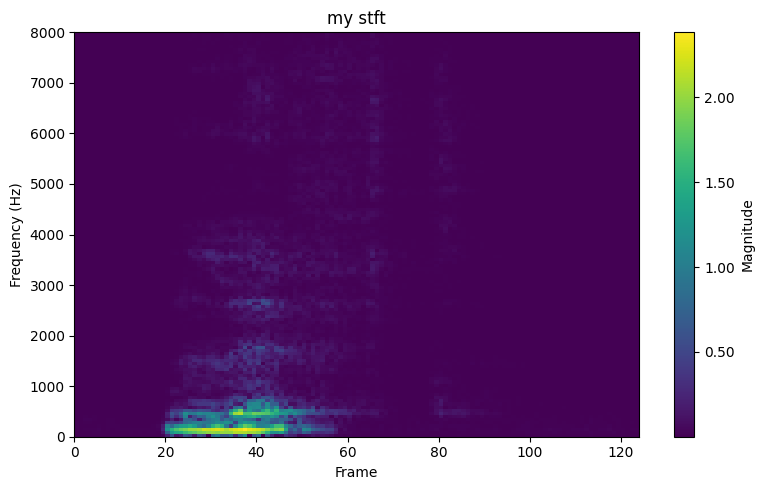

(1, 124, 129, 1)
File: ffd2ba2f_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9715639810426541


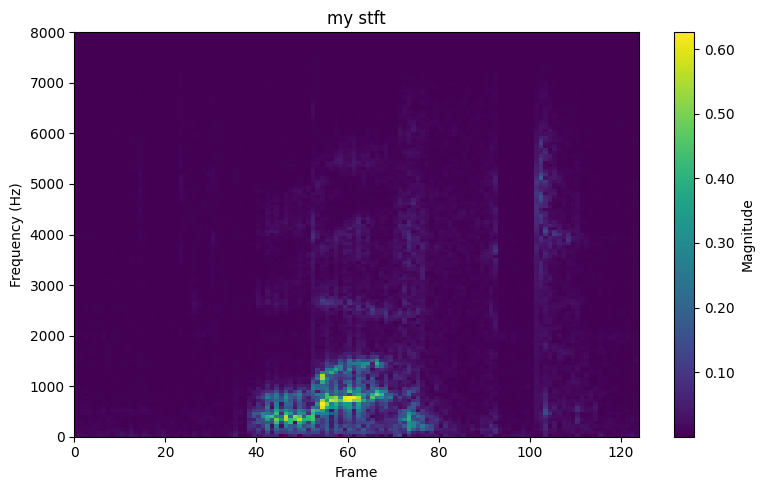

(1, 124, 129, 1)
File: adb45ef2_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9716981132075472


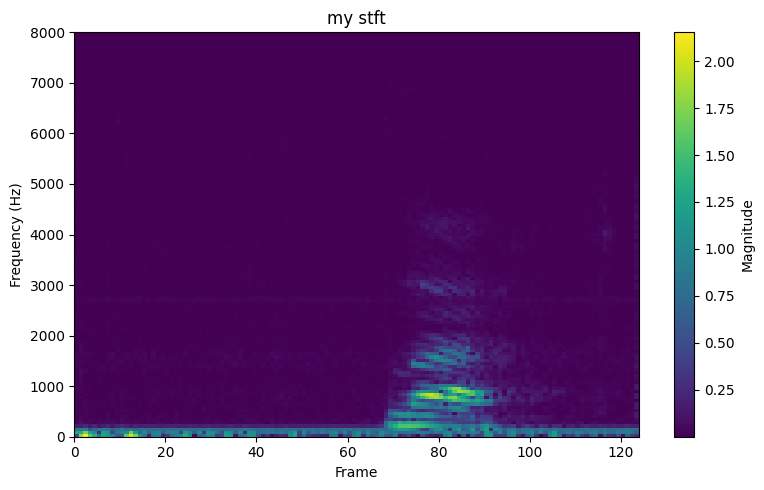

(1, 124, 129, 1)
File: cb5d2c6e_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.971830985915493


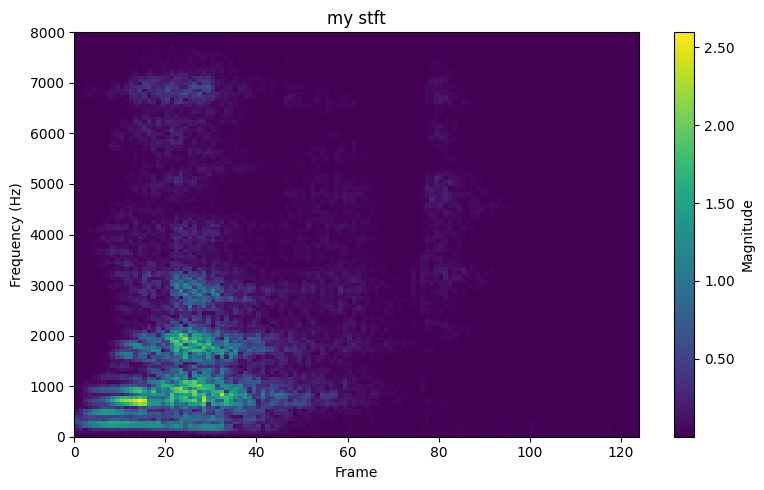

(1, 124, 129, 1)
File: 11321027_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9719626168224299


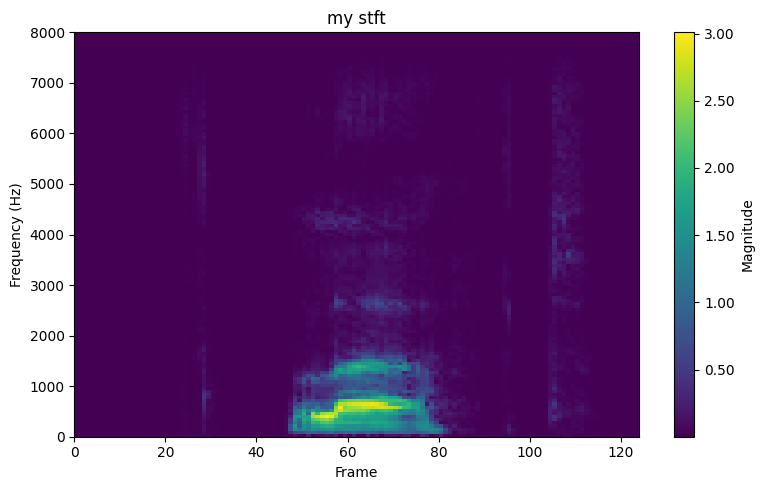

(1, 124, 129, 1)
File: 0137b3f4_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9720930232558139


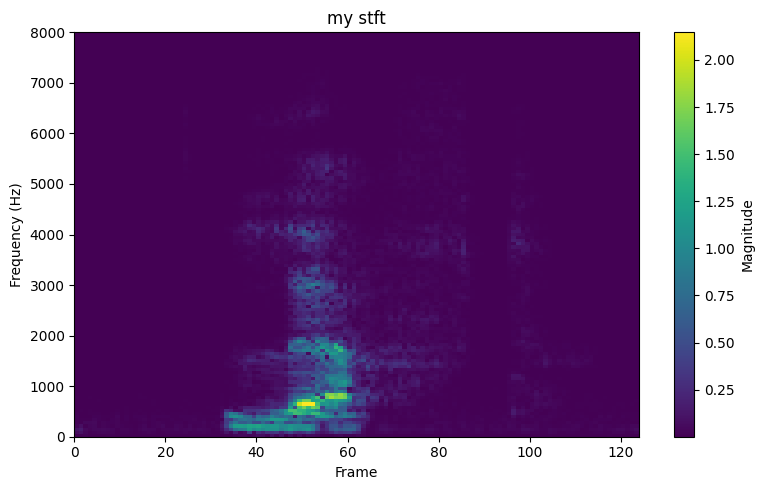

(1, 124, 129, 1)
File: ad89eb1e_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9722222222222222


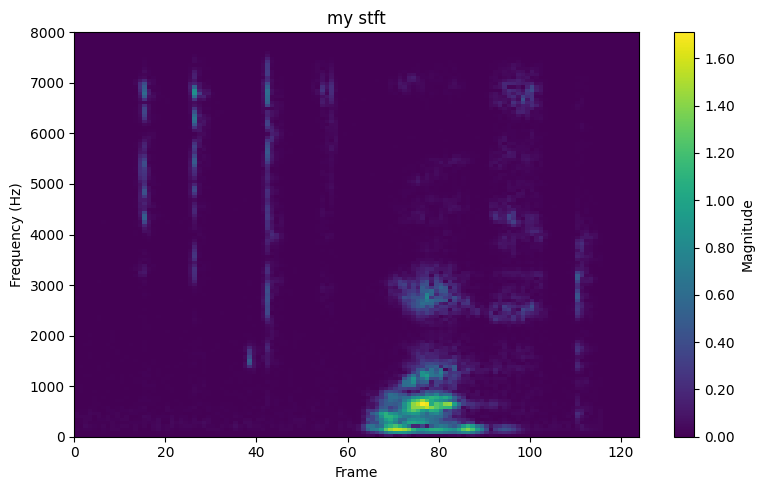

(1, 124, 129, 1)
File: 92e17cc4_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9723502304147466


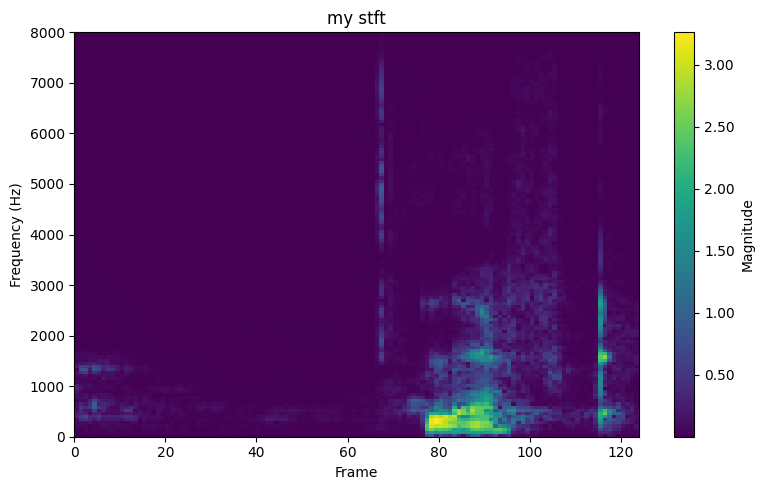

(1, 124, 129, 1)
File: c1e0e8e3_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9724770642201835


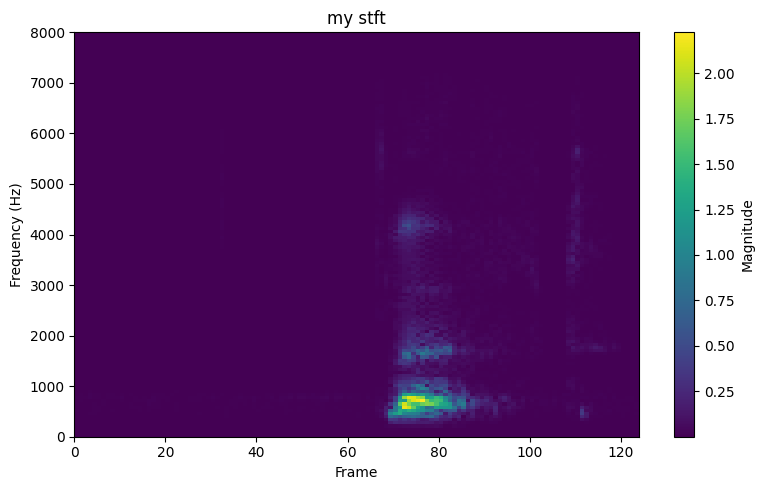

(1, 124, 129, 1)
File: 338dacf5_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9726027397260274


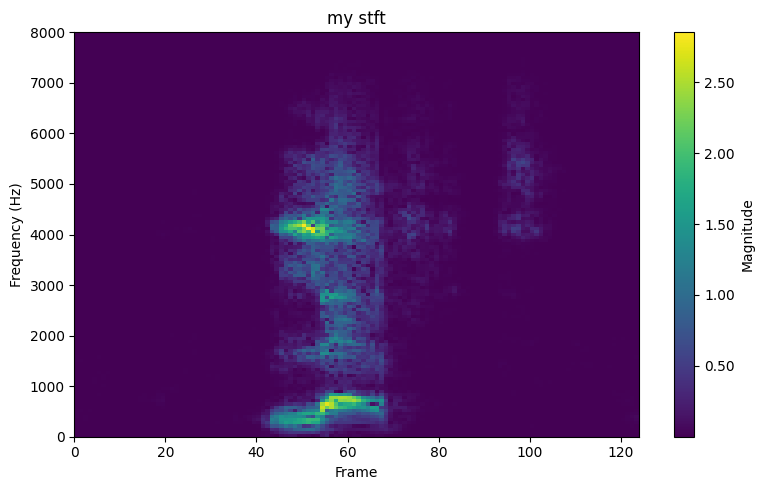

(1, 124, 129, 1)
File: 9a69672b_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9727272727272728


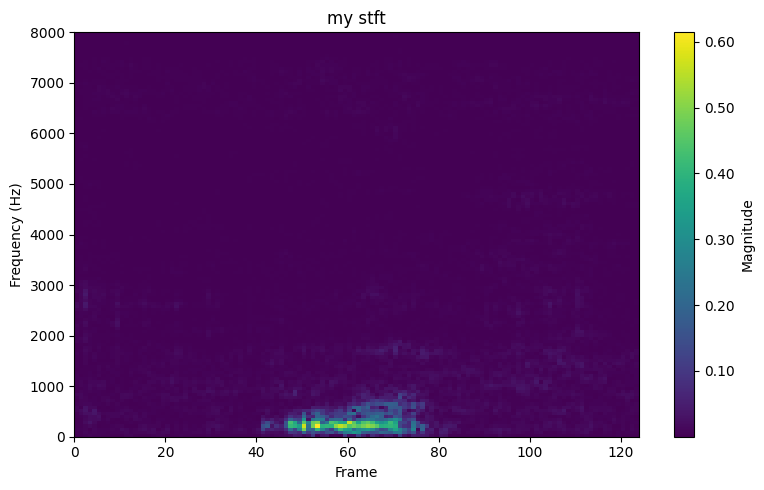

(1, 124, 129, 1)
File: dbb40d24_nohash_5.wav, True label: left, Predicted label: left

Accuracy: 0.9728506787330317


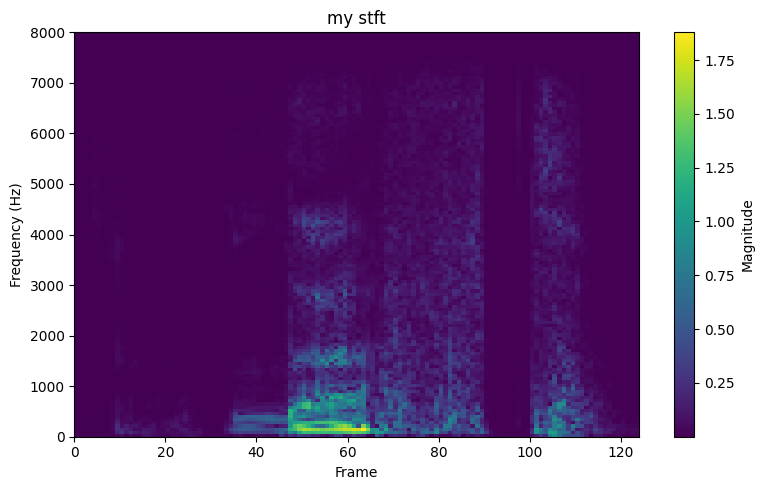

(1, 124, 129, 1)
File: e2286c18_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.972972972972973


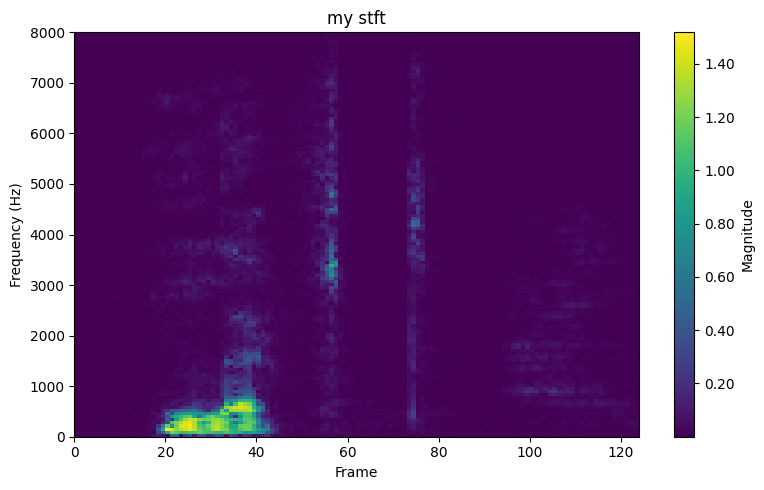

(1, 124, 129, 1)
File: c6ee87a7_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9730941704035875


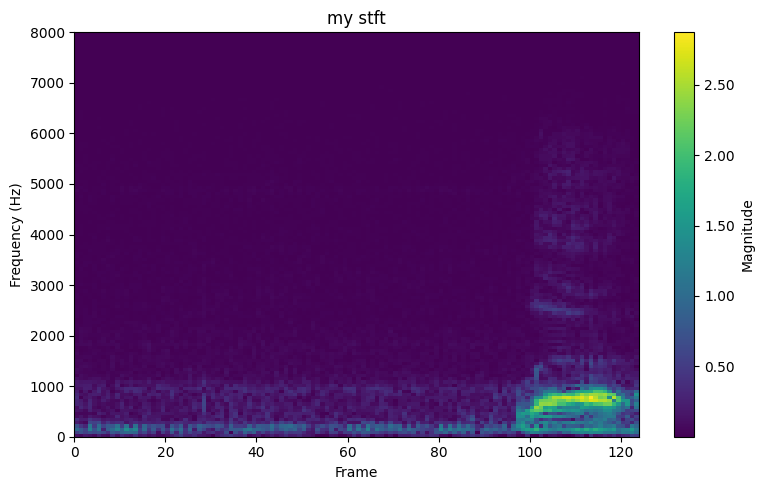

(1, 124, 129, 1)
File: a19452d5_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9732142857142857


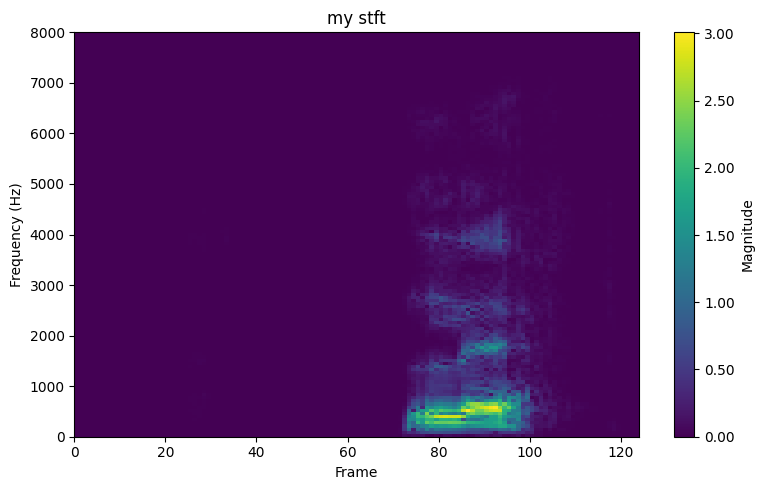

(1, 124, 129, 1)
File: 9db2bfe9_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9733333333333334


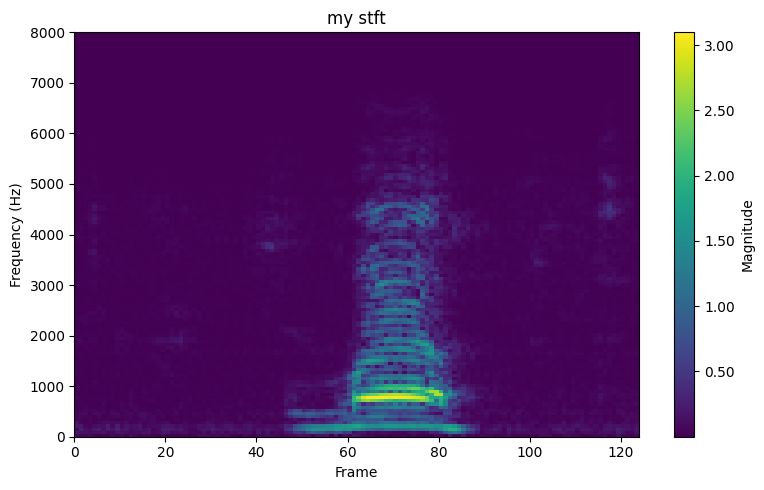

(1, 124, 129, 1)
File: 7dc50b88_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9734513274336283


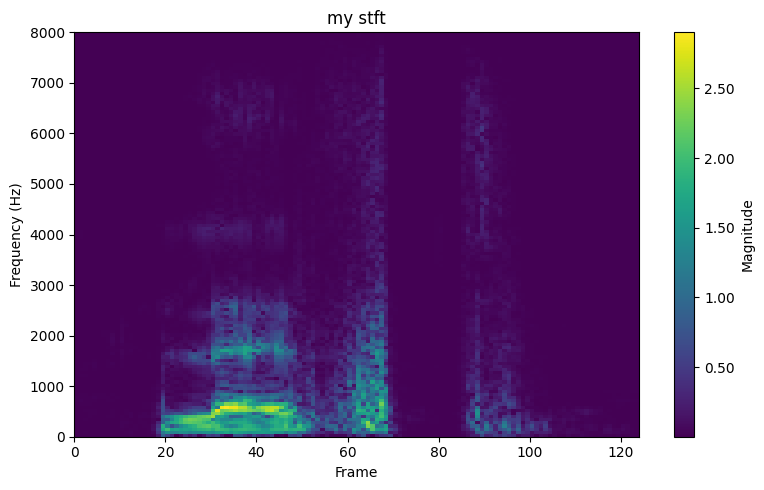

(1, 124, 129, 1)
File: 9aa21fa9_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.973568281938326


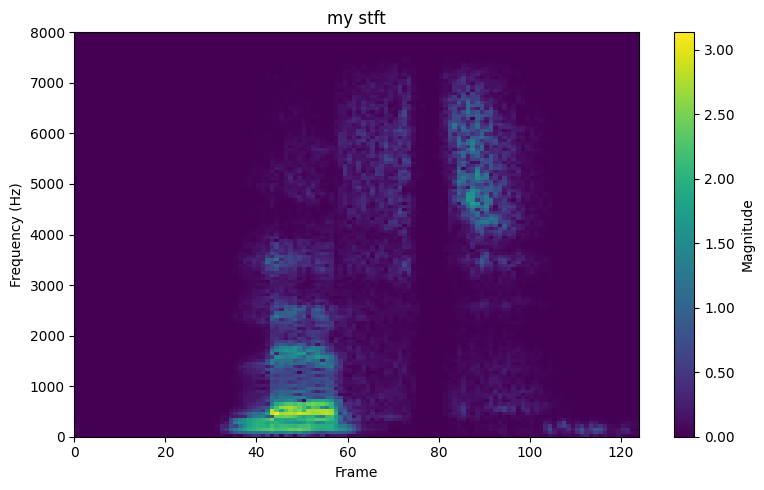

(1, 124, 129, 1)
File: a1cff772_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9736842105263158


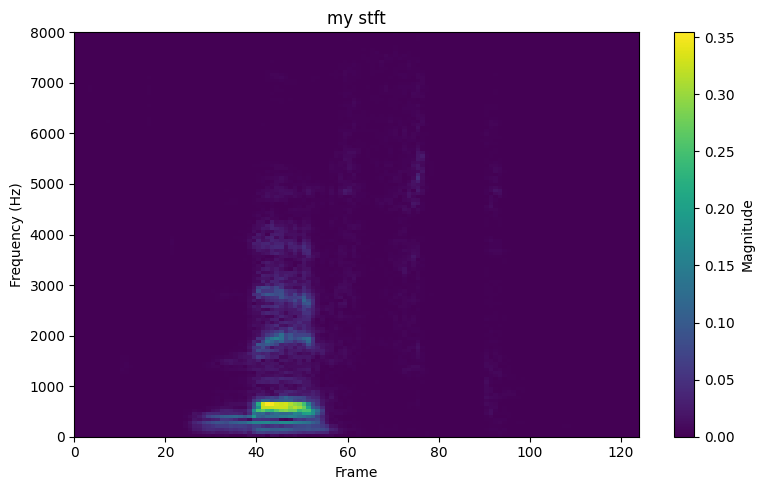

(1, 124, 129, 1)
File: 8f4c551f_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9737991266375546


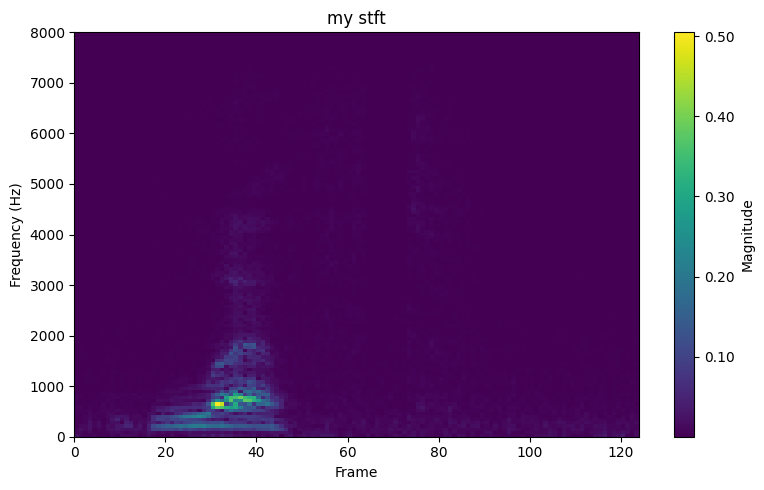

(1, 124, 129, 1)
File: ccf418a5_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9739130434782609


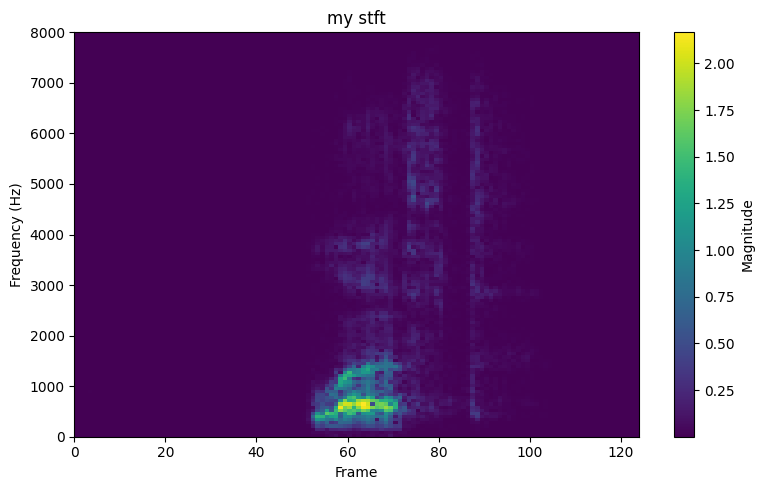

(1, 124, 129, 1)
File: eb3f7d82_nohash_4.wav, True label: left, Predicted label: left

Accuracy: 0.974025974025974


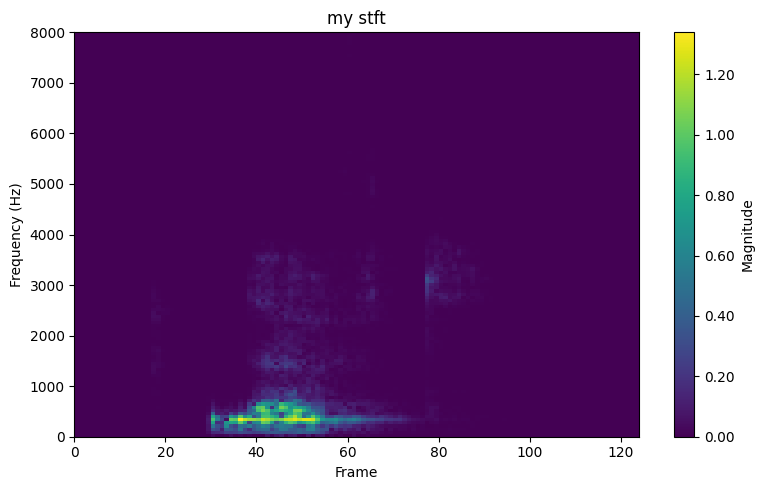

(1, 124, 129, 1)
File: cb2929ce_nohash_5.wav, True label: left, Predicted label: left

Accuracy: 0.9741379310344828


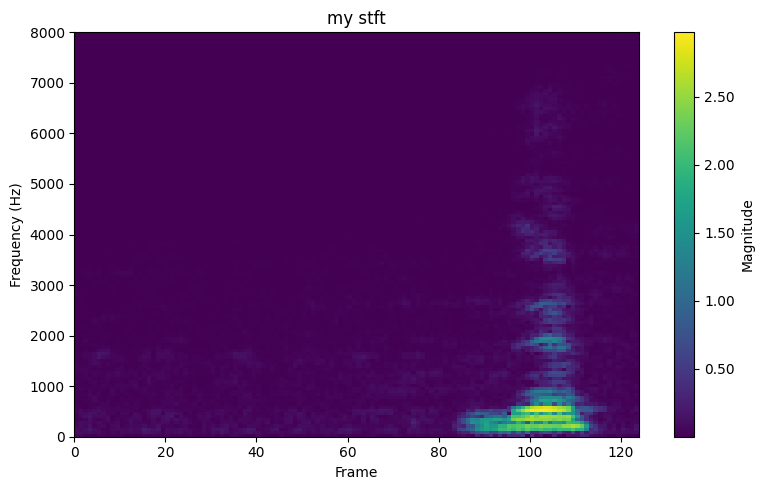

(1, 124, 129, 1)
File: 8281a2a8_nohash_3.wav, True label: left, Predicted label: left

Accuracy: 0.9742489270386266


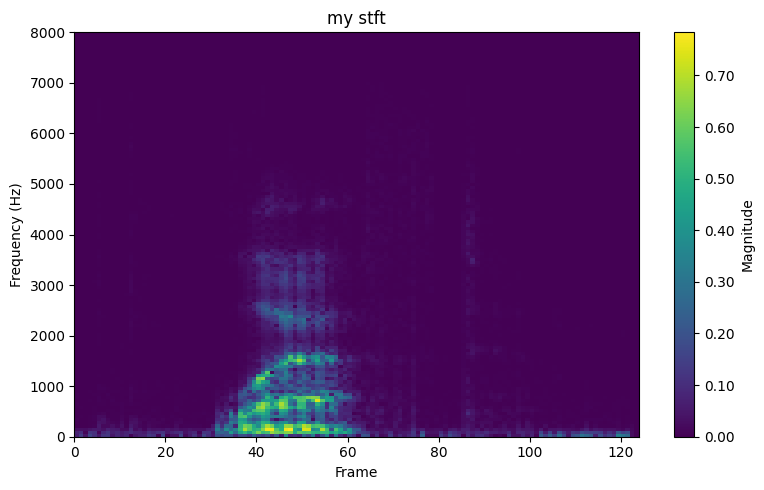

(1, 124, 129, 1)
File: 4beff0c5_nohash_1.wav, True label: left, Predicted label: left

Accuracy: 0.9743589743589743


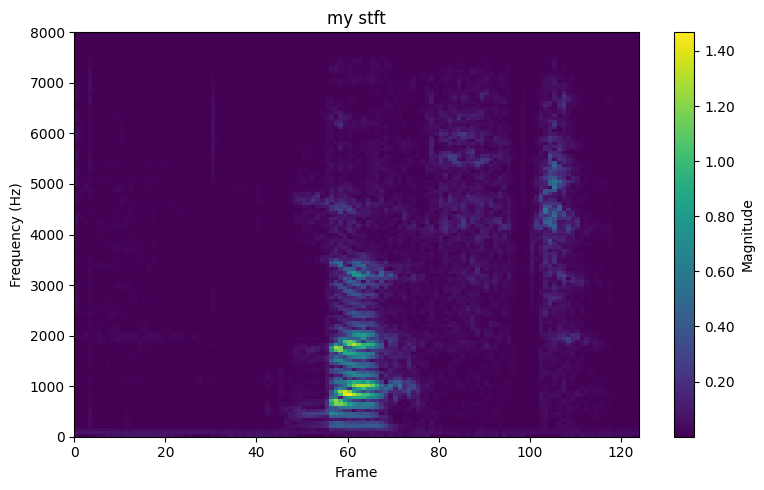

(1, 124, 129, 1)
File: 023a61ad_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9744680851063829


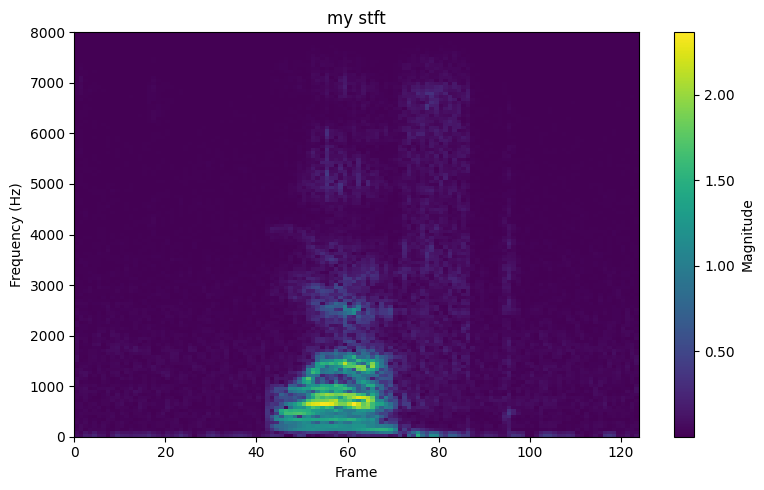

(1, 124, 129, 1)
File: 7192fddc_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9745762711864406


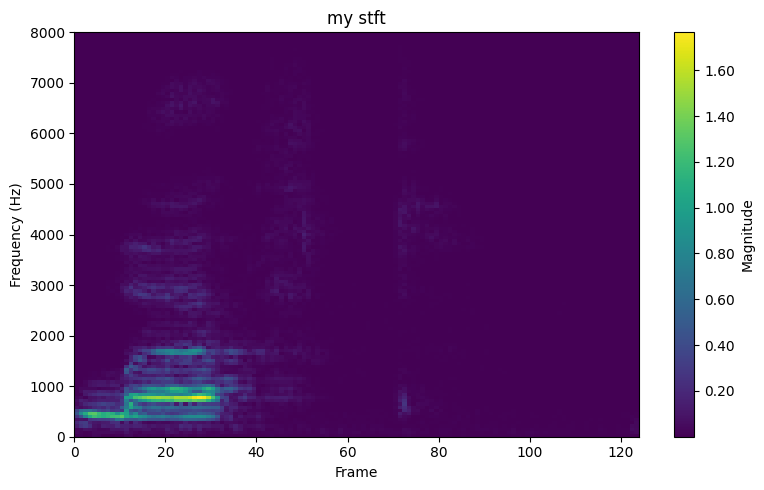

(1, 124, 129, 1)
File: 587f3271_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9746835443037974


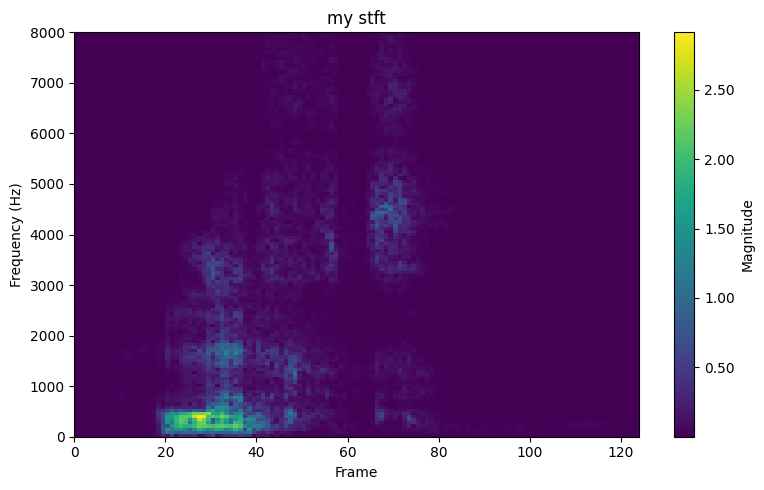

(1, 124, 129, 1)
File: ad63d93c_nohash_2.wav, True label: left, Predicted label: left

Accuracy: 0.9747899159663865


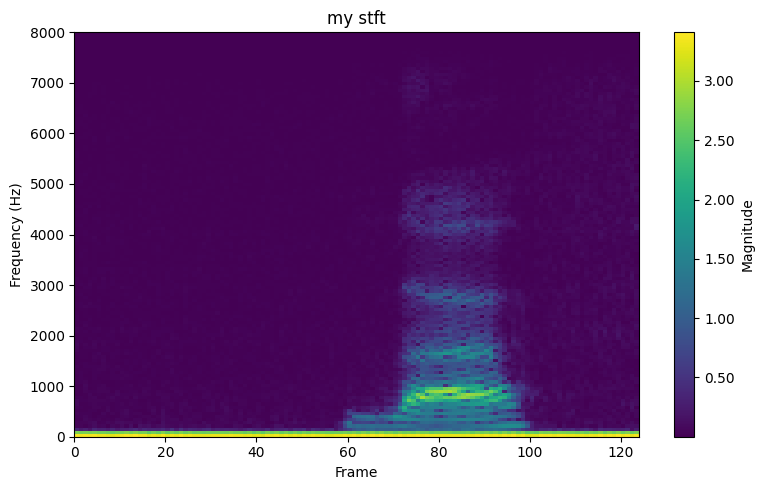

(1, 124, 129, 1)
File: ee4a907f_nohash_0.wav, True label: left, Predicted label: left

Accuracy: 0.9748953974895398


KeyboardInterrupt: 

In [ ]:
label_names = ['down', 'go', 'left', 'no', 'right', 'stop', 'up', 'yes']
correct_predictions = 0
total_predictions = 0

for label in os.listdir(data_dir):
    label_dir = data_dir/label
    if label_dir.is_dir():
        for filename in os.listdir(label_dir):
            if filename.endswith('.wav'):
                total_predictions += 1
                x = label_dir/filename
                x = tf.io.read_file(str(x))
                x, sample_rate = tf.audio.decode_wav(x, desired_channels=1, desired_samples=16000,)
                x = tf.squeeze(x, axis=-1)
                waveform = x

                output = run_custom_model_with_learned_weights(waveform)

                predicted_index = np.argmax(output, axis=1)[0]
                predicted_label = label_names[predicted_index]

                print(f"File: {filename}, True label: {label}, Predicted label: {predicted_label}")

                if predicted_label == label:
                    correct_predictions += 1
                accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
                print(f"\nAccuracy: {accuracy}")

accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
print(f"\nAccuracy: {accuracy}")